## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_standard"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "standard"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


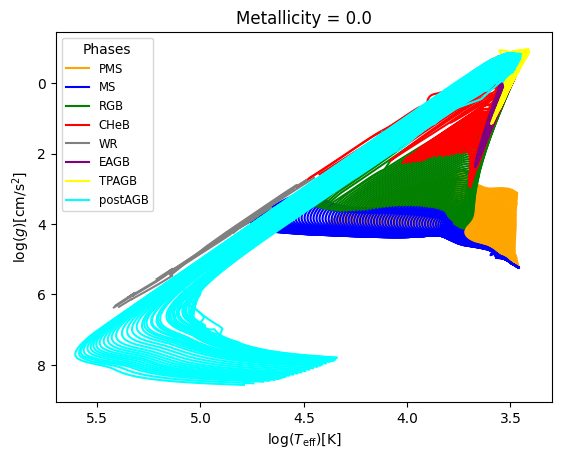

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


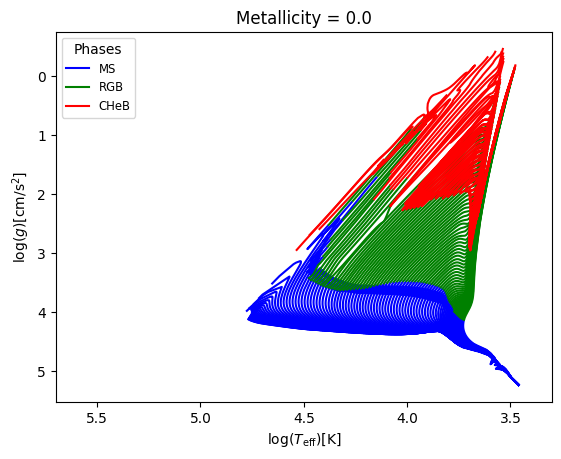

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.1154, Median : 8.15

log_Teff  : Range : 3.34 - 5.3788, Mean : 4.0283, Median : 3.9761

log_g  : Range : -1.08 - 6.2594, Mean : 3.5075, Median : 3.8521

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 11.4145, Median : 2.8996

log_R  : Range : -1.0 - 3.1298, Mean : 0.735, Median : 0.7005



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378801600728572
Median value in train data for the log_Teff parameter: 3.976722754899366
Mean value in train data for the log_Teff parameter: 4.028639708216513

Range in train data for the log_g parameter : -1.0828963170617296 - 6.259434356871683
Median value in train data for the log_g parameter: 3.852761890388139
Mean value in train data for the log_g parameter: 3.508503471076473

Range in train data for the log_R parameter : -0.9974628481553472 - 3.129269620812593
Median value in train data for the log_R parameter: 0.7005259212303901
Mean value in train data for the log_R parameter: 0.7346615625058007

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3447003632081813 - 5.3787504733463445
Median value in test data for the log_Teff parameter: 3.9741415586935043
Mean value in test data for the log_Teff parameter: 4.027301245585765

Range in test data for the log_g pa

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7503697754371119
  RMSE :  0.17867017821632553
  MAE :  0.15276972181763626
  MedAE :  0.15385964037280764
  CORR :  0.8662614294215141
  MAX_ER :  0.7158267661817614
  Percentiles : 
    75th percentile :  0.21036427944035507
    90th percentile :  0.25684313292430255
    95th percentile :  0.30189056290731503
    99th percentile :  0.4376512367586636

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.7805873116770892
  RMSE :  0.14836747143553664
  MAE :  0.11890601794054799
  MedAE :  0.10570876409456531
  CORR :  0.8837977866743556
  MAX_ER :  0.6313385072628921
  Percentiles : 
    75th percentile :  0.16586873689801274
    90th percentile :  0.2221642233449746
    95t

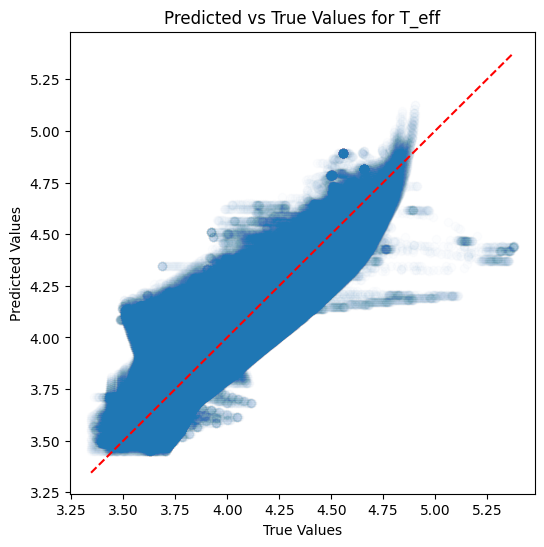

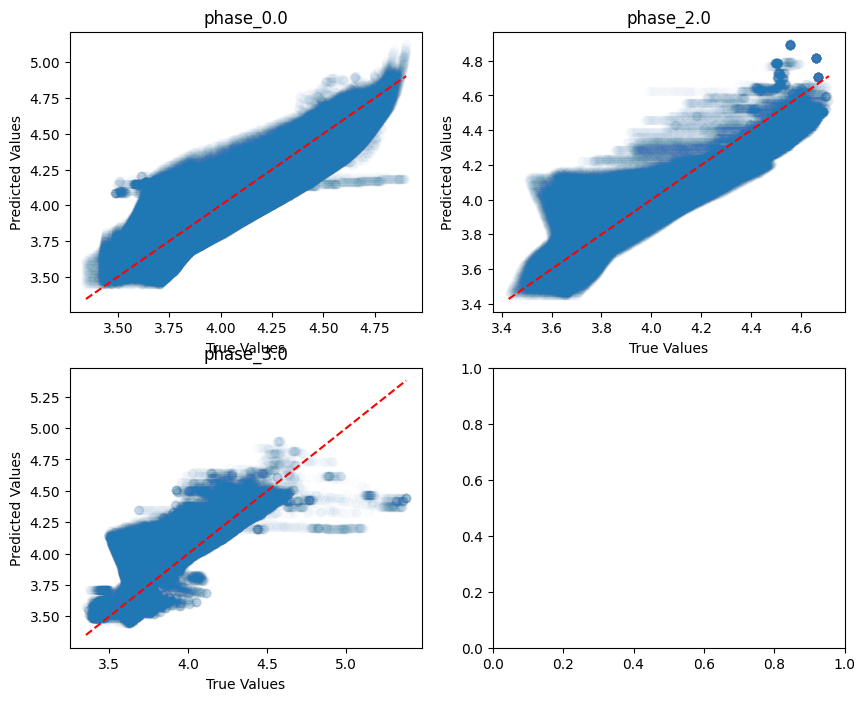

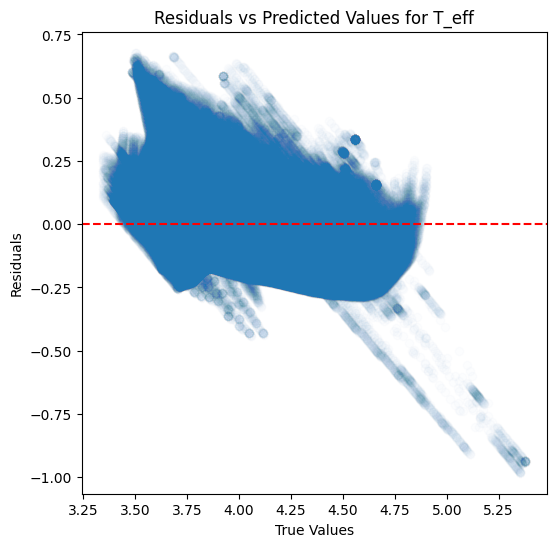

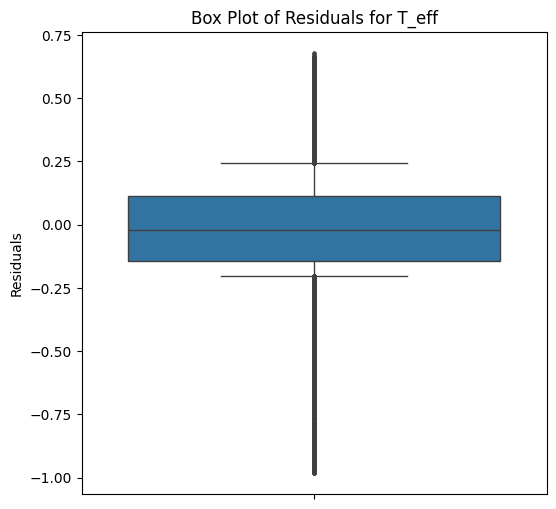

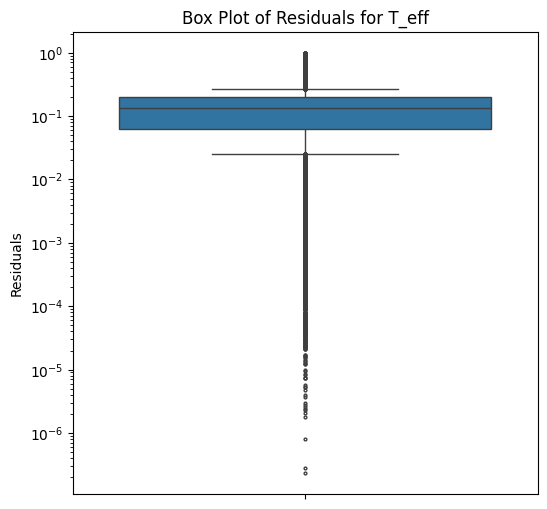

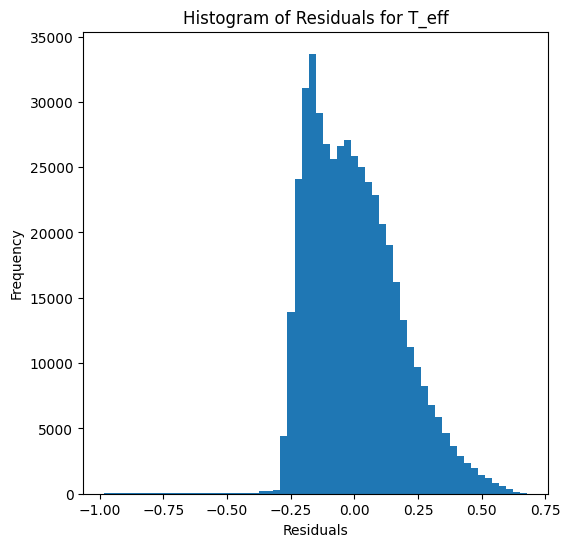

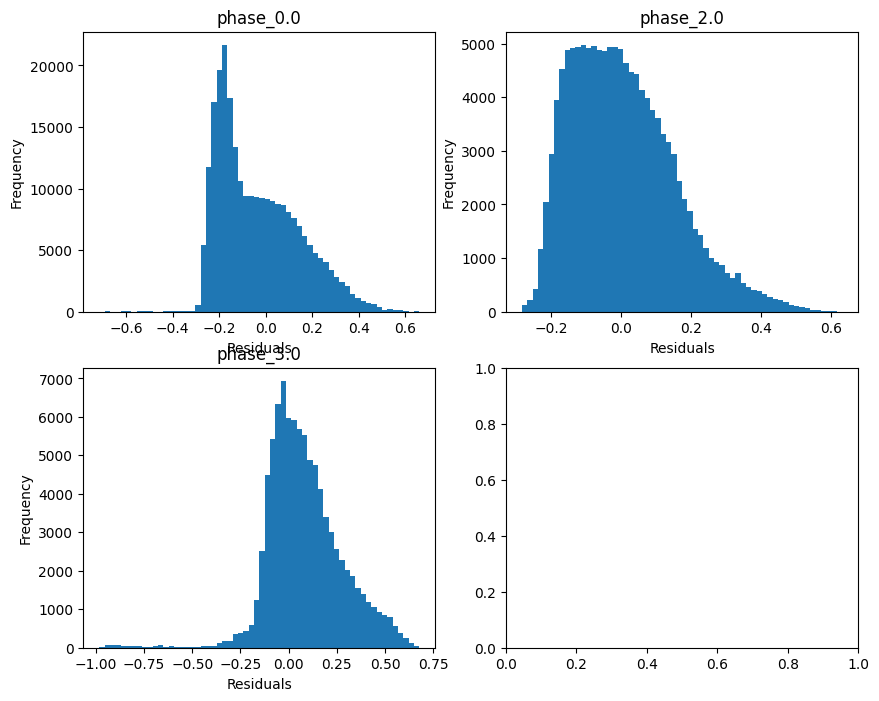

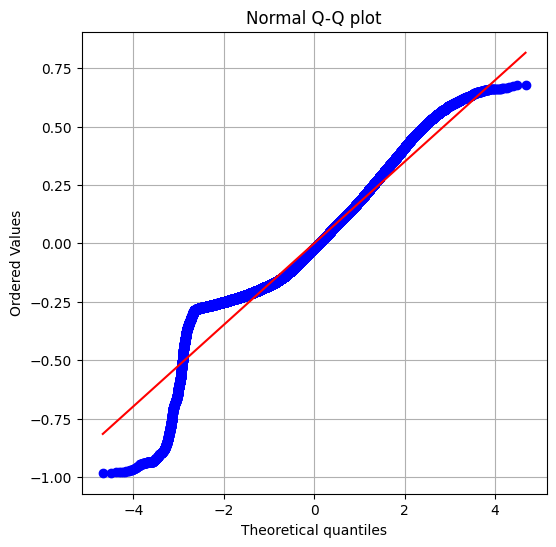

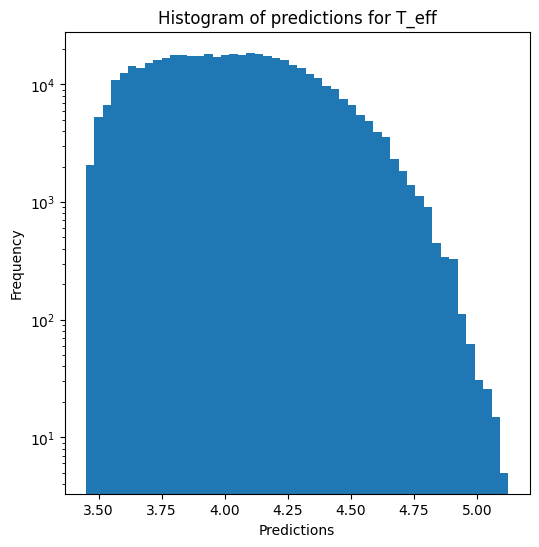

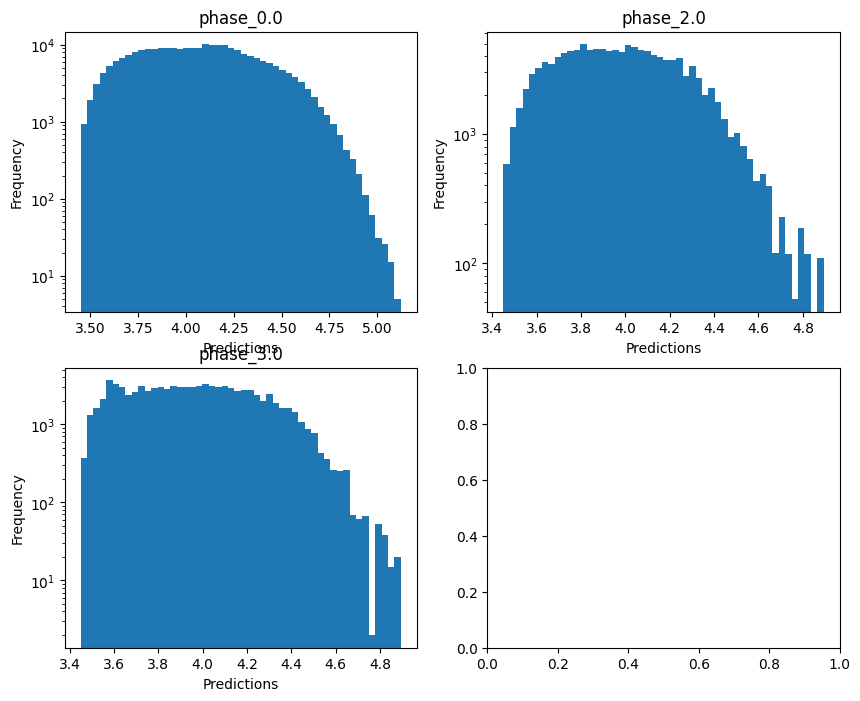

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  -0.06113406410934452
  RMSE :  1.0159381552564244
  MAE :  0.8734582859394928
  MedAE :  0.7996566314287543
  CORR :  0.29813341758803996
  MAX_ER :  3.809494134884476
  Percentiles : 
    75th percentile :  1.1240293853381513
    90th percentile :  1.6136113077473444
    95th percentile :  1.8676325276492394
    99th percentile :  2.265335235053569

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.22451634099644813
  RMSE :  1.049120401372819
  MAE :  0.794251281717219
  MedAE :  0.5756164969183395
  CORR :  0.4743260904396199
  MAX_ER :  3.3836152444402403
  Percentiles : 
    75th percentile :  1.1814406431783868
    90th percentile :  1.8728378175514413
    95th percentile :  2.2398698067761957
    99th percentile :  2.6881356451968808

log_g results for the phase ca

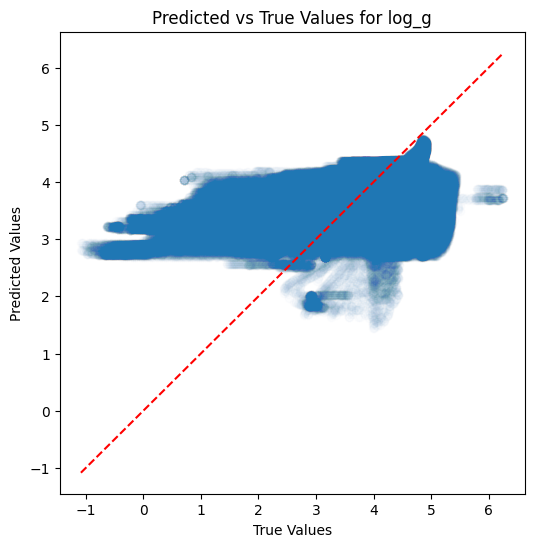

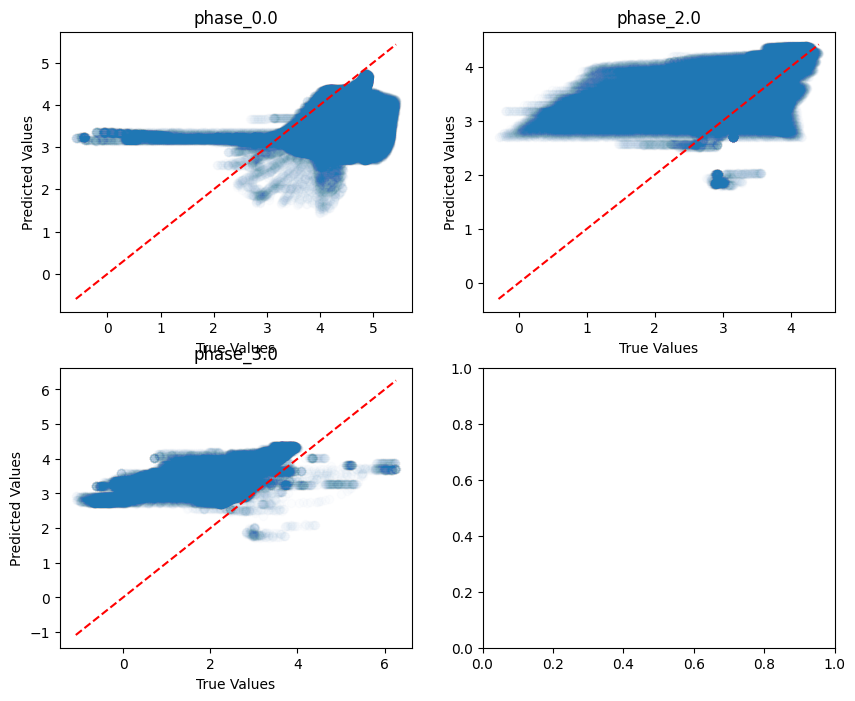

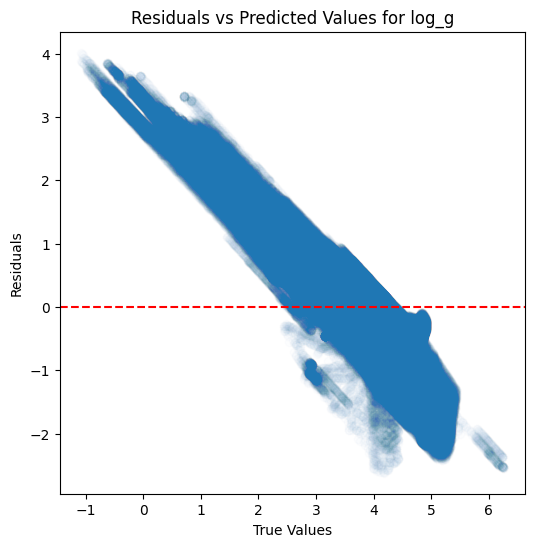

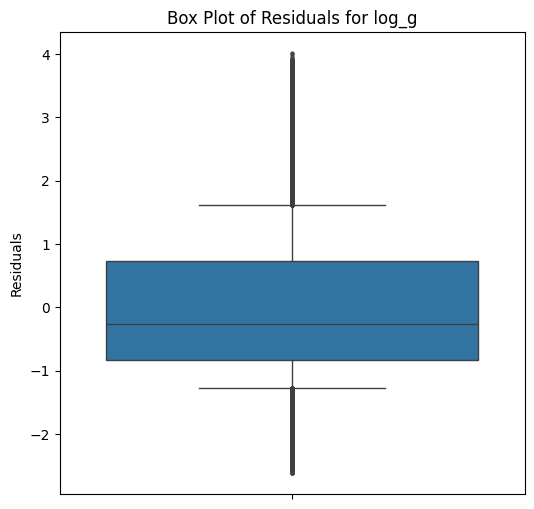

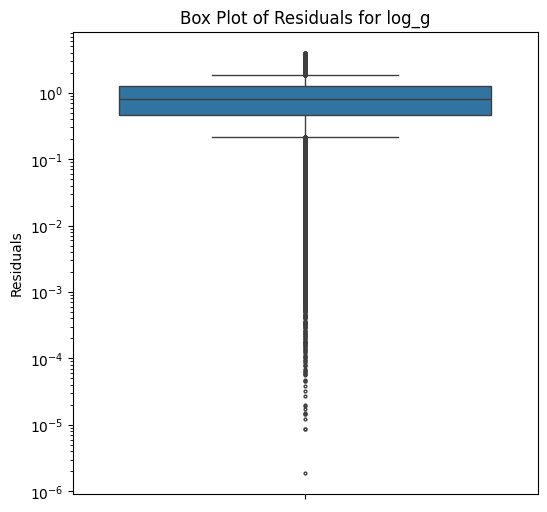

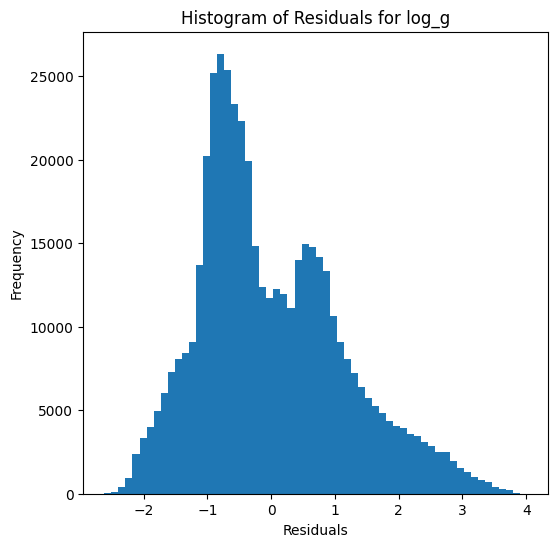

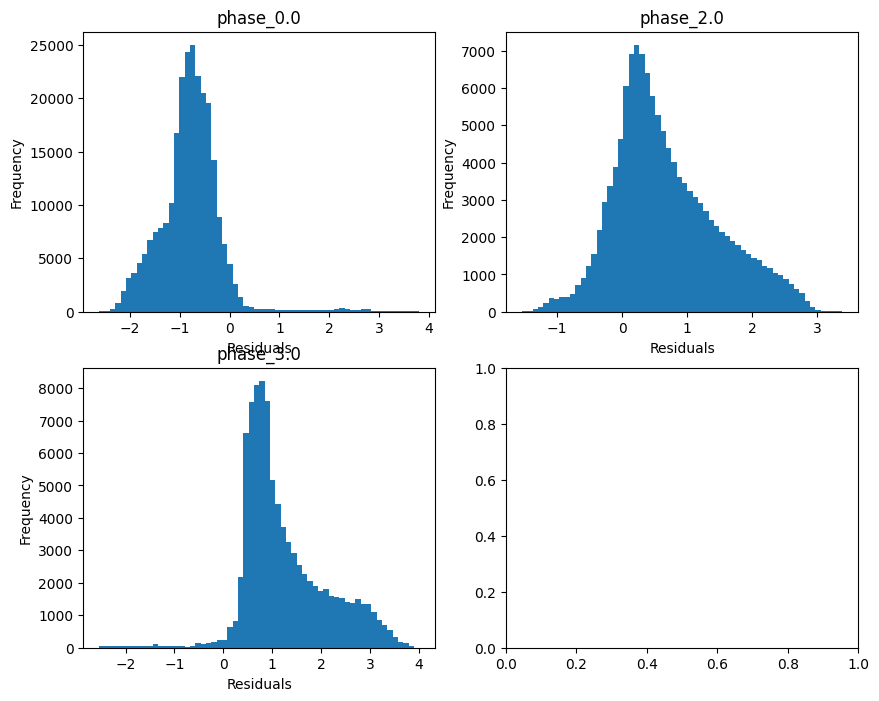

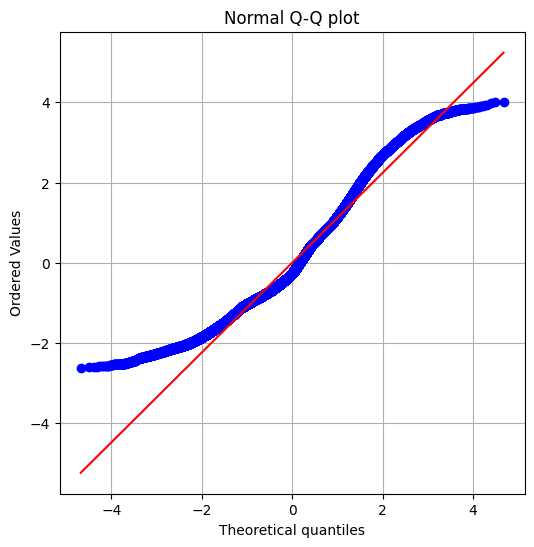

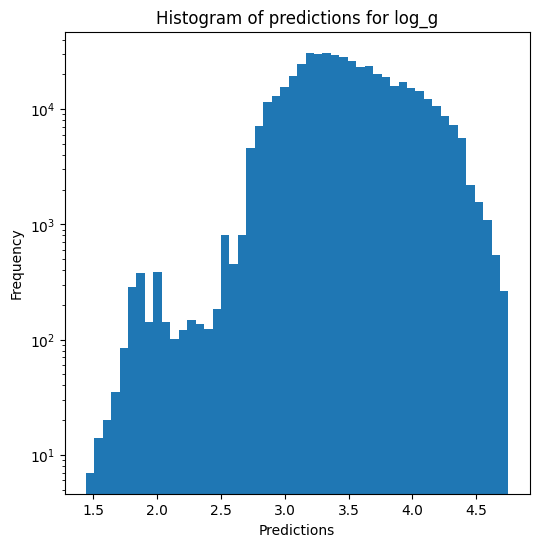

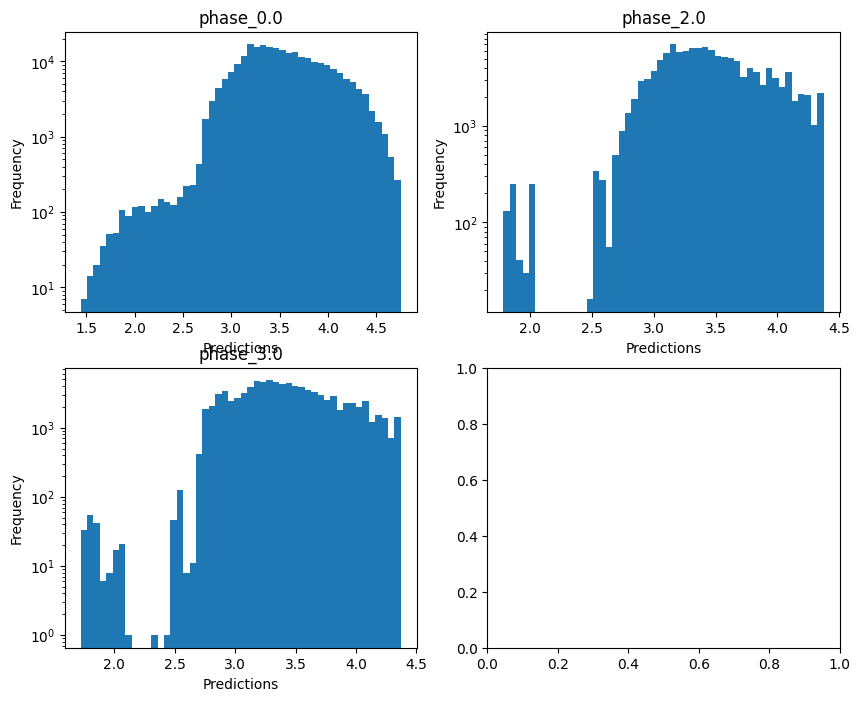

no negative values

radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.4447713018606817
  RMSE :  0.6258804209974922
  MAE :  0.523523747592557
  MedAE :  0.47616038527161436
  CORR :  0.6719624779362798
  MAX_ER :  2.043563584354475
  Percentiles : 
    75th percentile :  0.7045079703191984
    90th percentile :  1.0100653716430383
    95th percentile :  1.2099146395974256
    99th percentile :  1.4881984830797506

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.30463254778698523
  RMSE :  0.5829583734189554
  MAE :  0.4633948685494158
  MedAE :  0.36497341476205125
  CORR :  0.5669445250663583
  MAX_ER :  1.7887148220101259
  Percentiles : 
    75th percentile :  0.6678287842168433
    90th percentile :  1.012225780241796
    95th percentile :  1.1936339671259117
    99th percentile :  1.4145188810845337

radius results for the phase

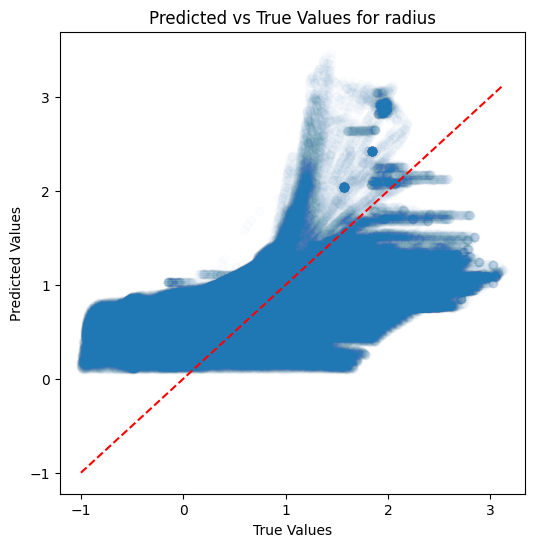

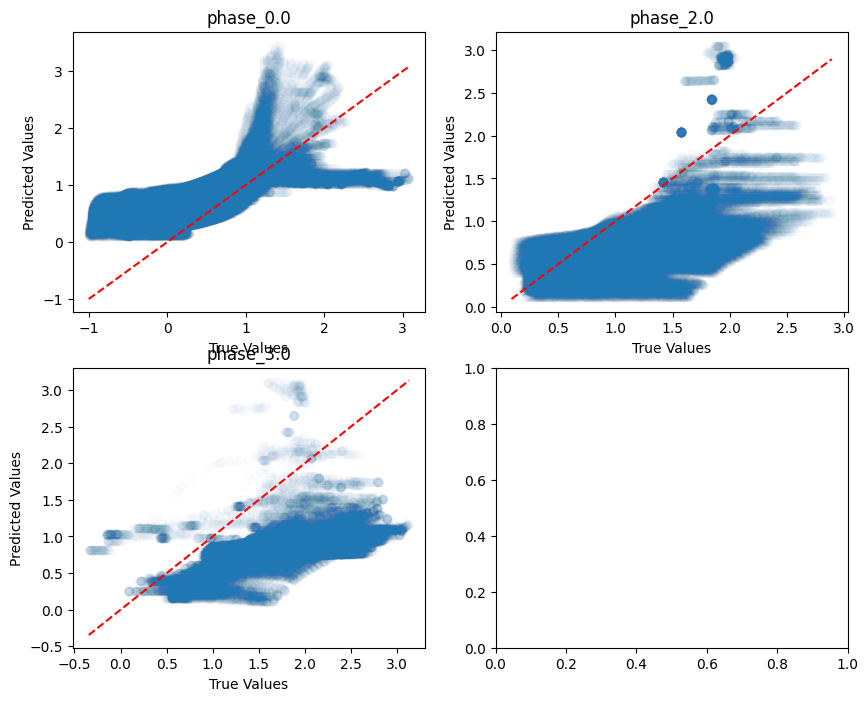

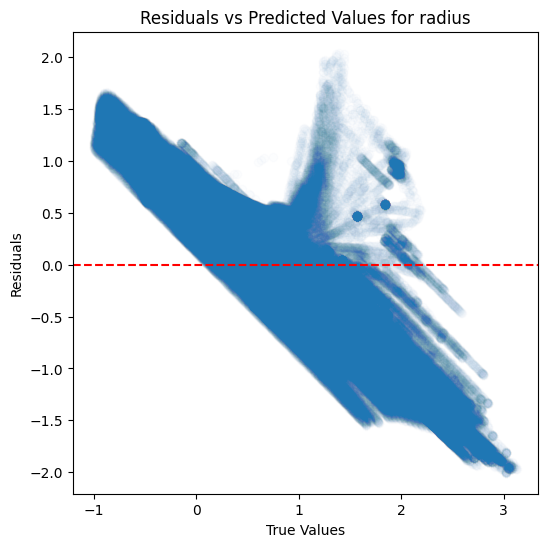

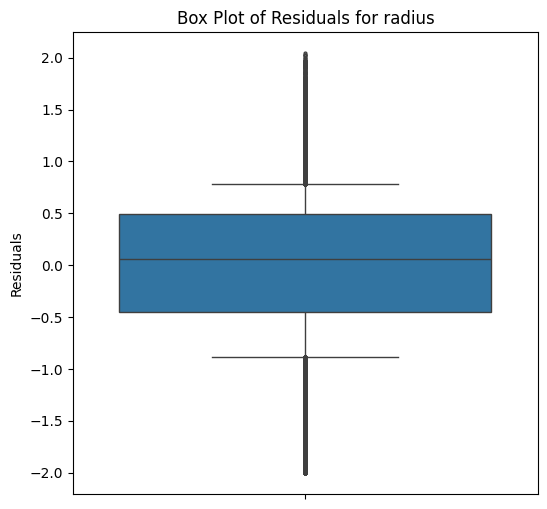

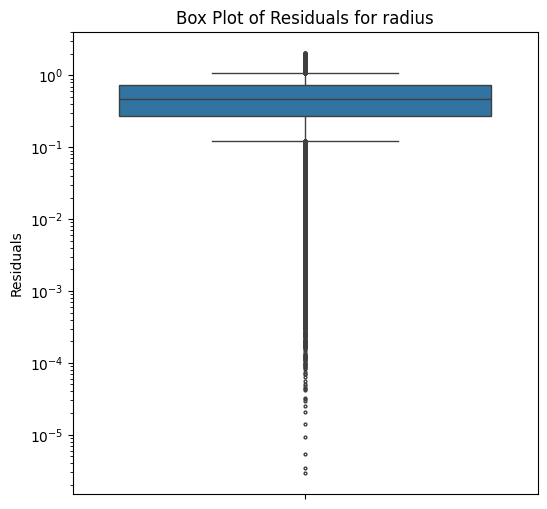

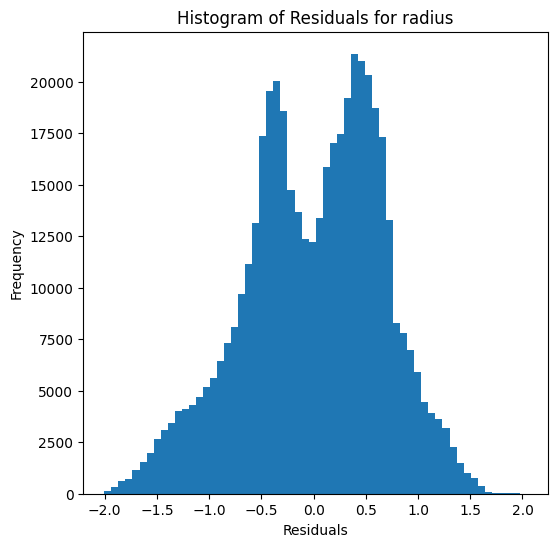

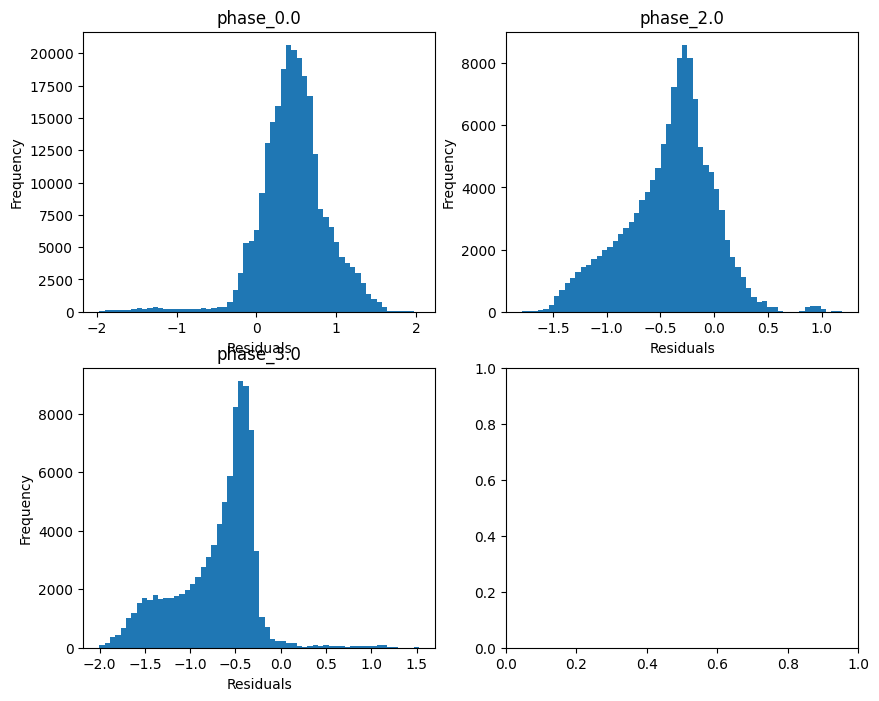

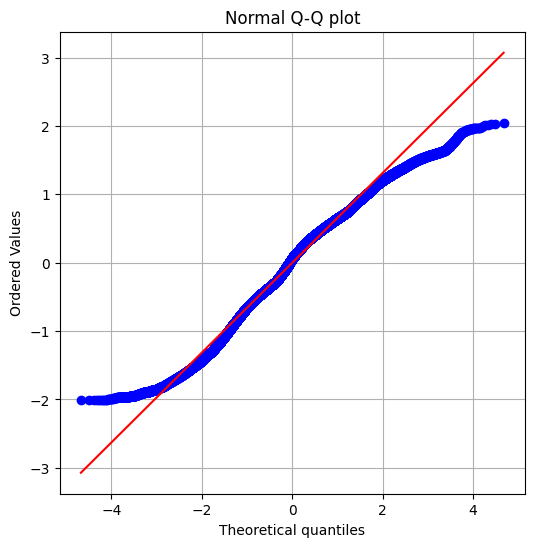

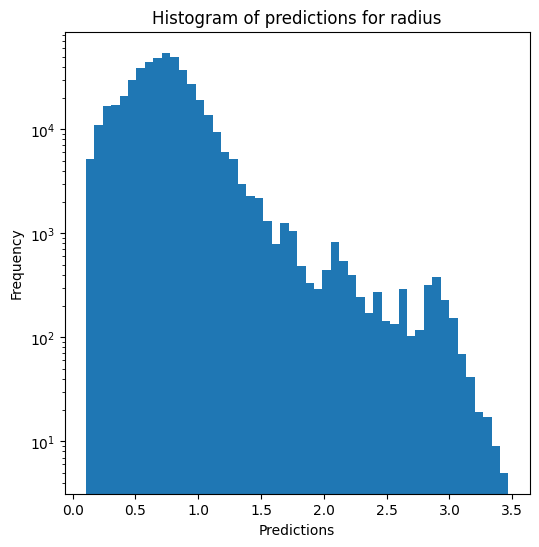

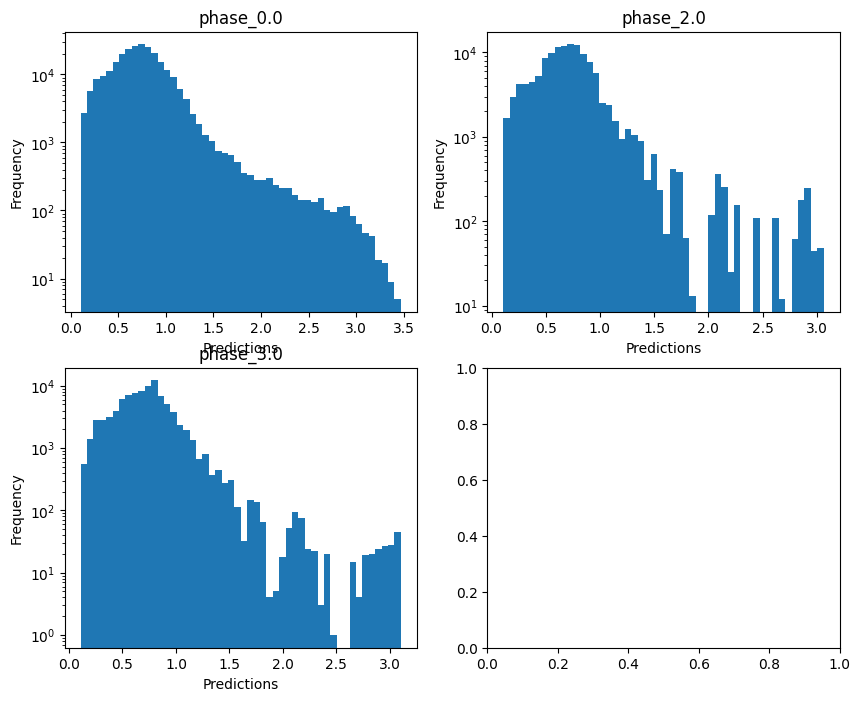

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9600898418075682
  RMSE :  0.07043997869238784
  MAE :  0.01169421726008613
  MedAE :  0.0011525635056073291
  CORR :  0.9802579096071886
  MAX_ER :  0.9507131678891638
  Percentiles : 
    75th percentile :  0.0025756861562894473
    90th percentile :  0.004750572493116323
    95th percentile :  0.01179646164437828
    99th percentile :  0.40768841340131934

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9589975428692362
  RMSE :  0.06407942113629951
  MAE :  0.023882934572649332
  MedAE :  0.003231238662225966
  CORR :  0.9794425035529
  MAX_ER :  0.8470942576263263
  Percentiles : 
    75th percentile :  0.007856155940577647
    90th percentile :  0.08244408428139437


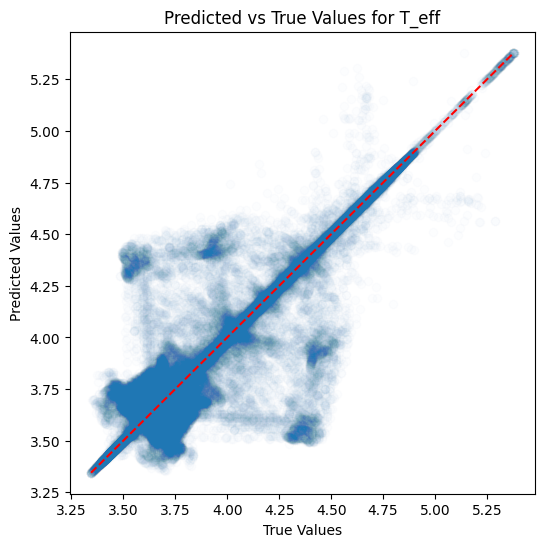

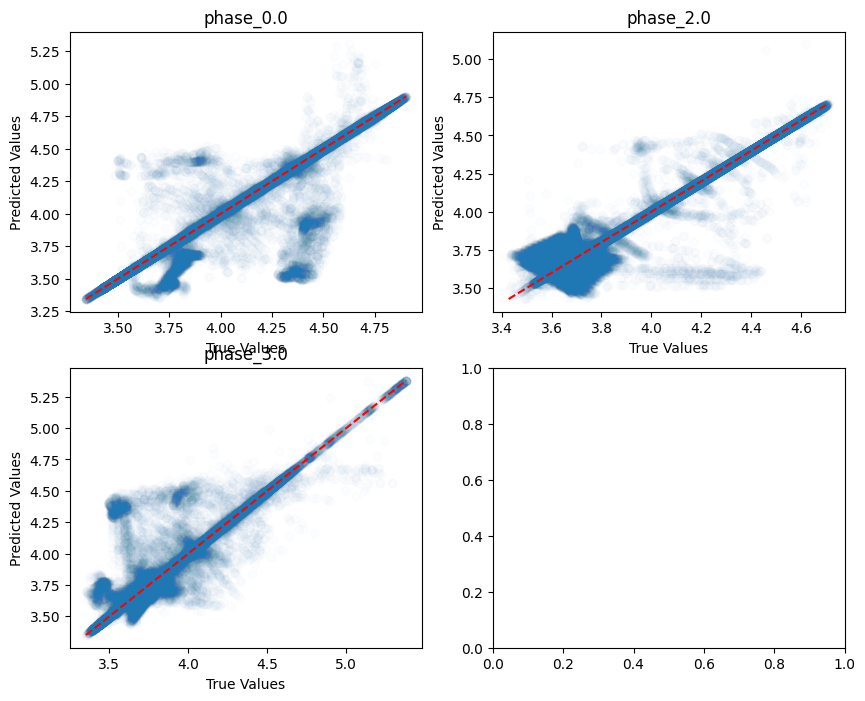

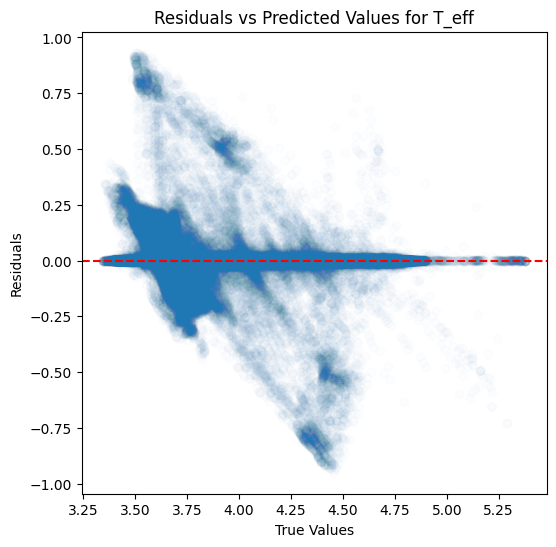

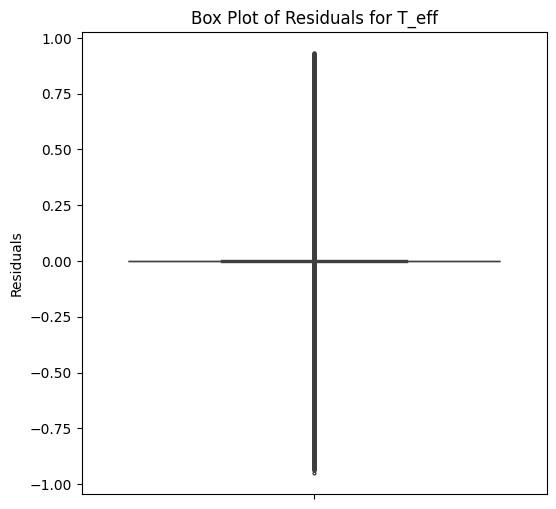

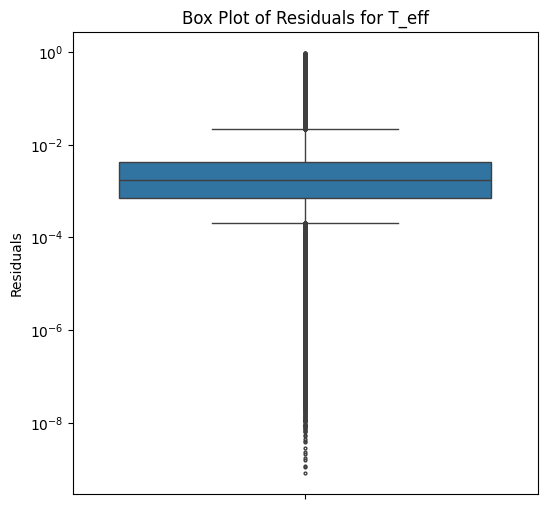

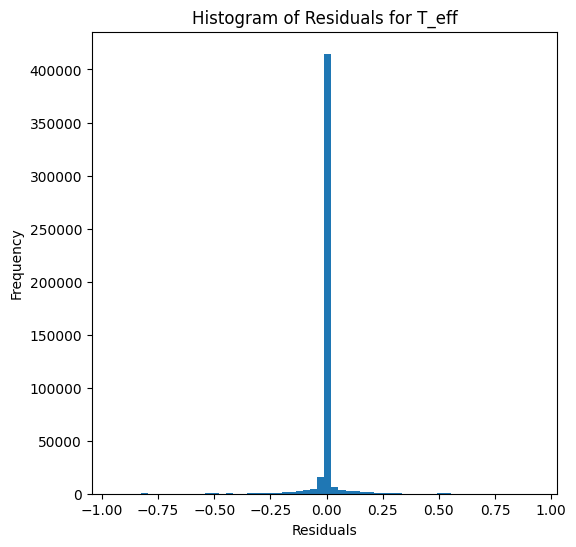

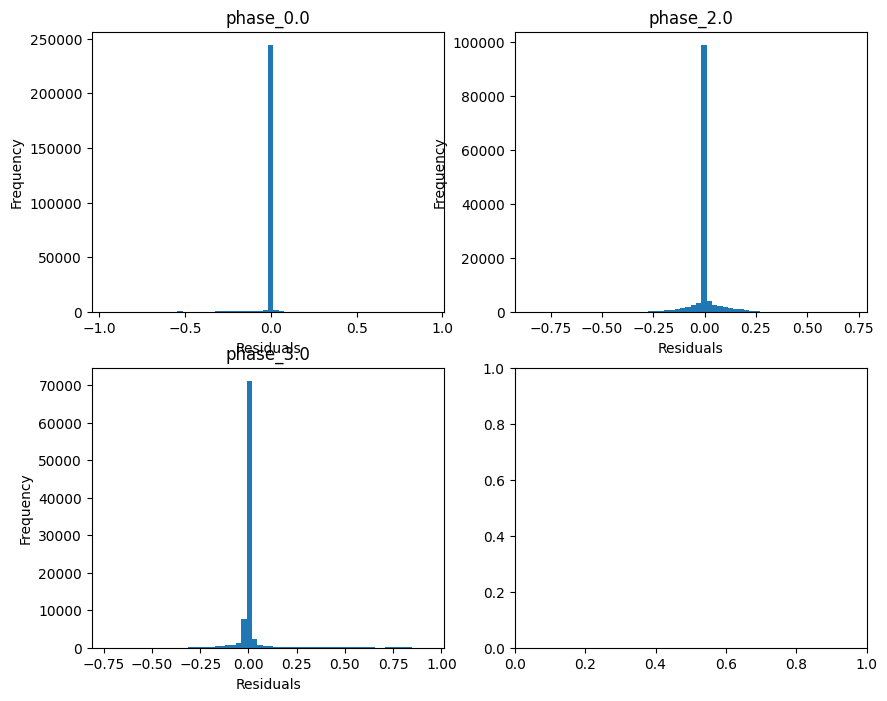

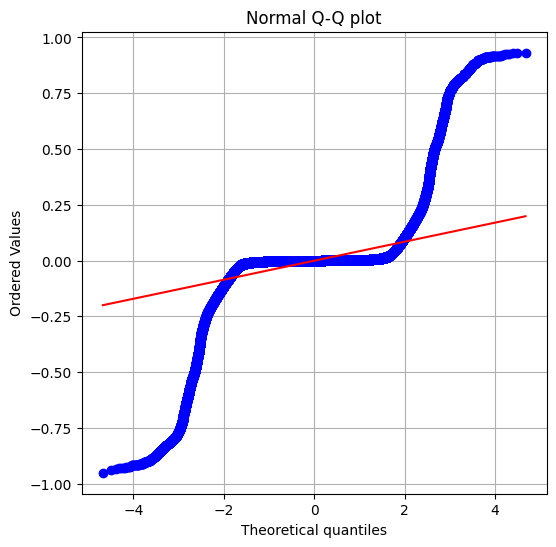

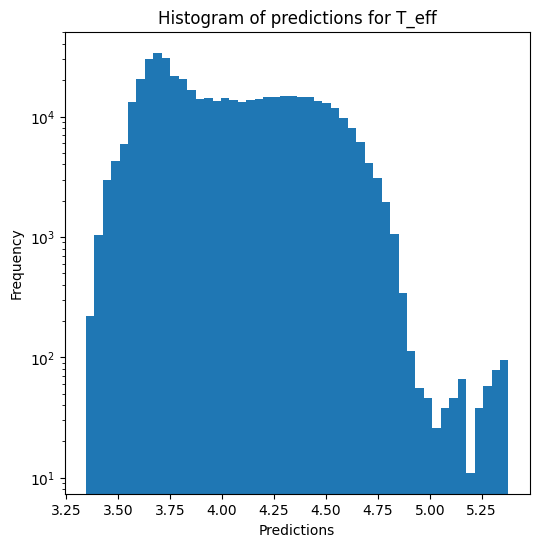

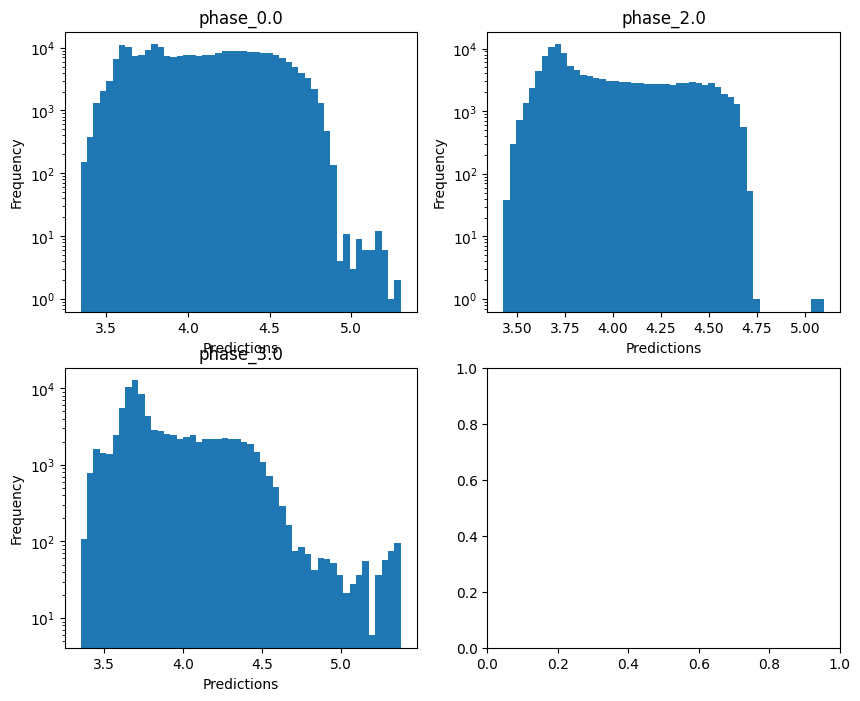


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.45749390103105436
  RMSE :  0.46413689893523524
  MAE :  0.07447348161970971
  MedAE :  0.0041288987405168065
  CORR :  0.8062207393762549
  MAX_ER :  5.681742527263148
  Percentiles : 
    75th percentile :  0.008254492794063317
    90th percentile :  0.01717142915690455
    95th percentile :  0.03669005629427762
    99th percentile :  3.0959862871720576

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.10822677245062406
  RMSE :  0.8596926266488014
  MAE :  0.3515862682654098
  MedAE :  0.015897274193044986
  CORR :  0.5516616408008641
  MAX_ER :  4.585015970670848
  Percentiles : 
    75th percentile :  0.04472922066462415
    90th percentile :  1.5046567398924746
    95th percentile :  2.3353034813839058
    99th percentile :  3.4638556884179894

log_g results for the phase category 

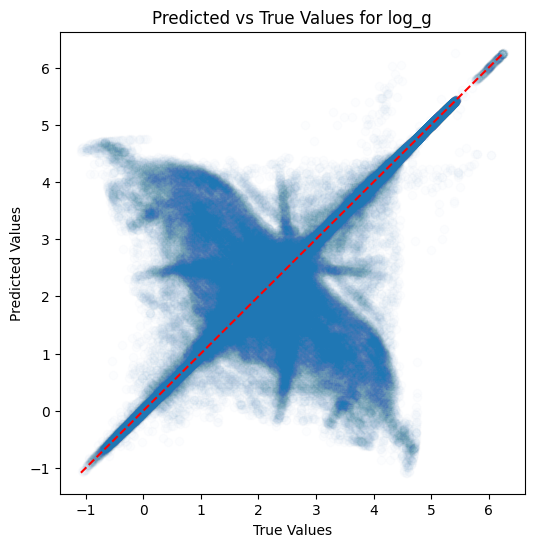

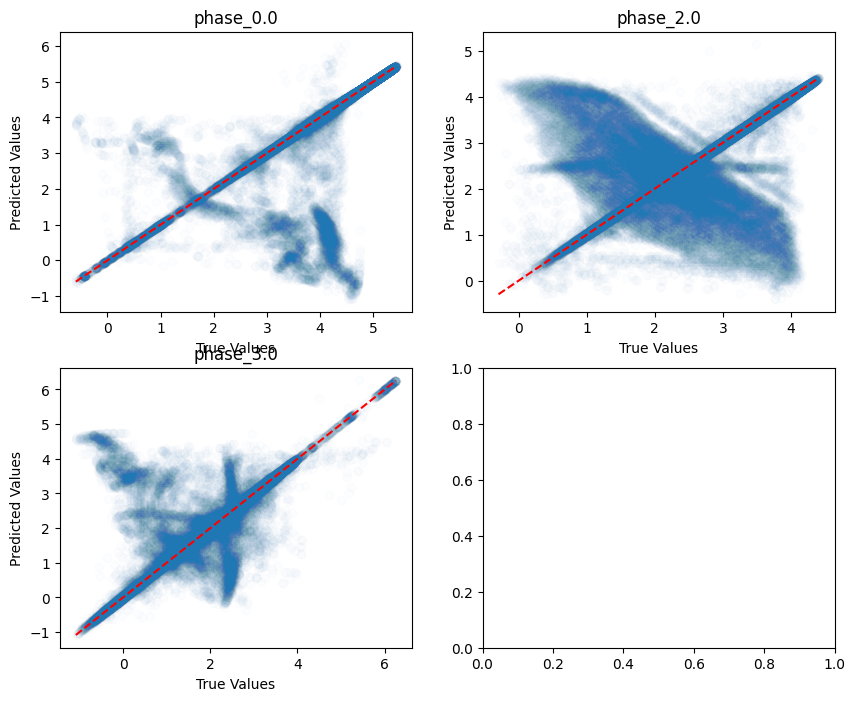

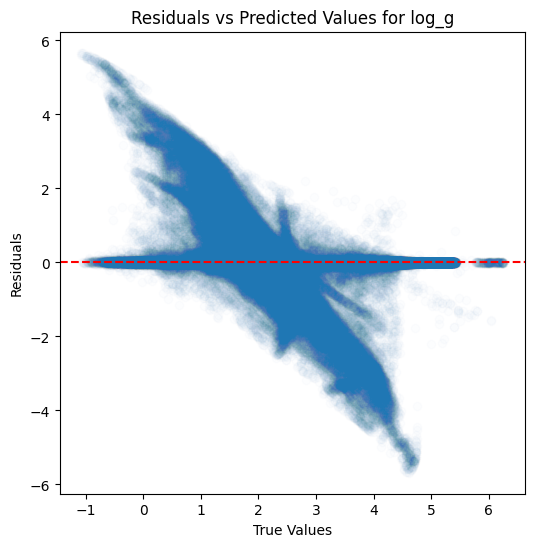

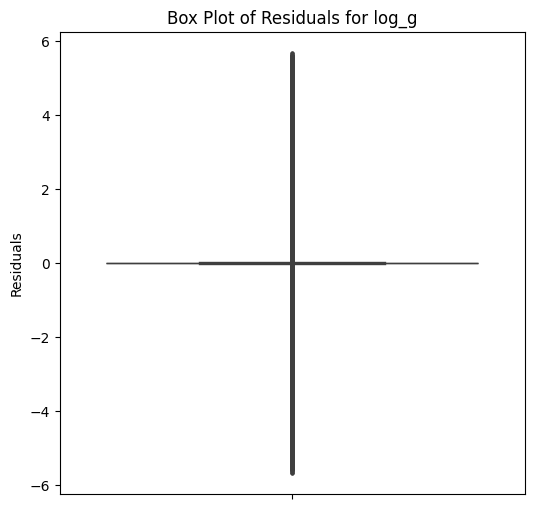

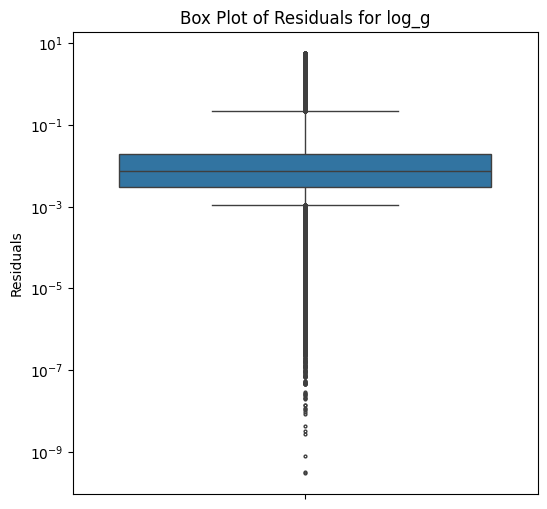

...

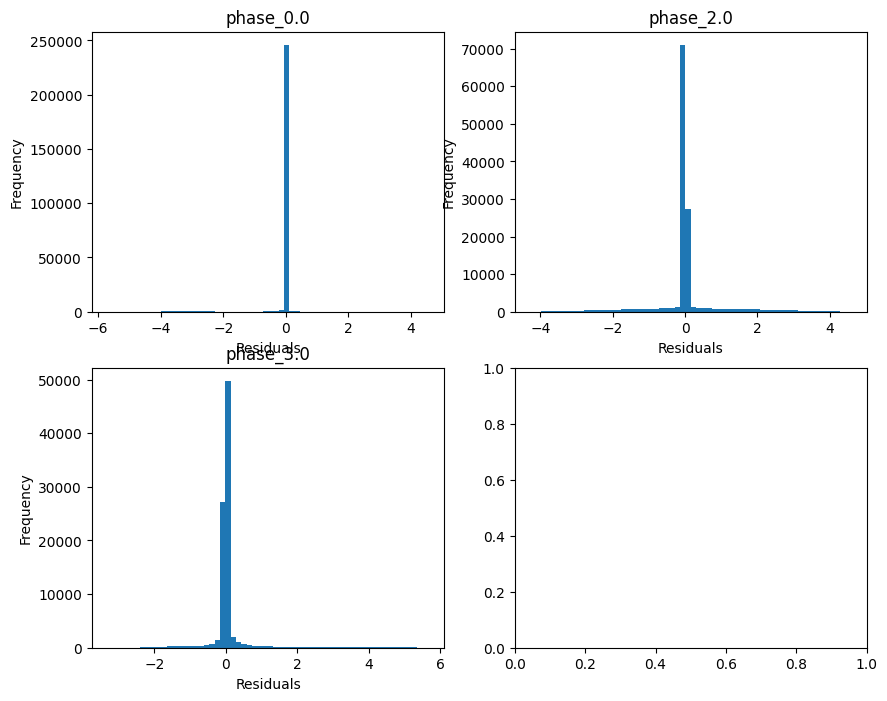

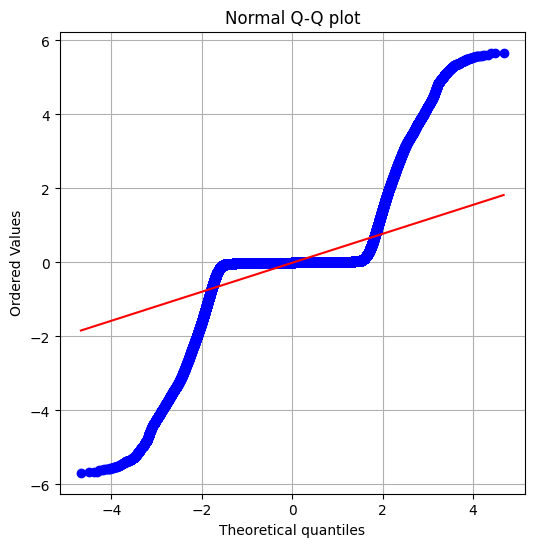

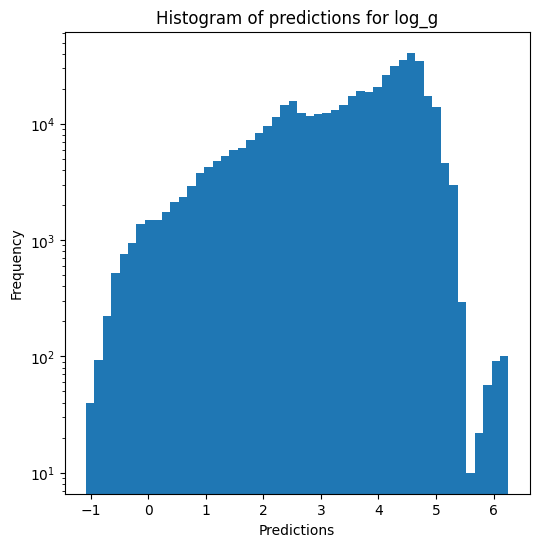

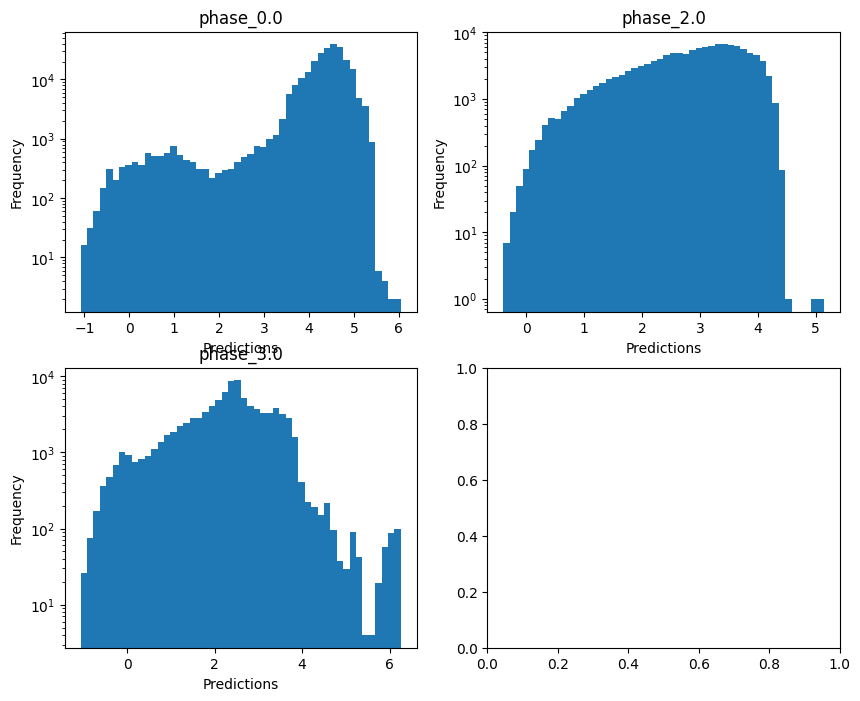

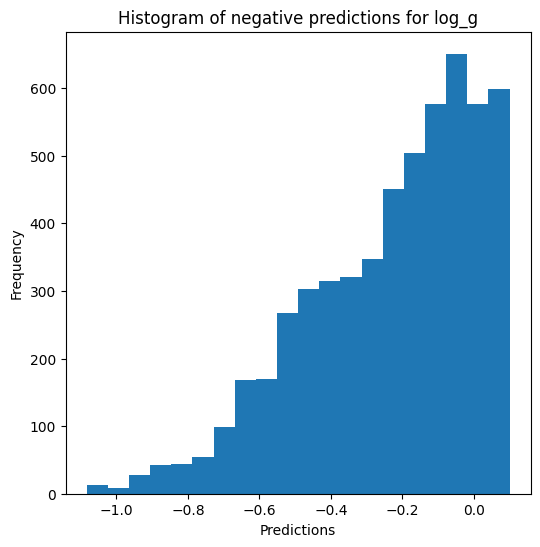


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8360374886351921
  RMSE :  0.23233956511784837
  MAE :  0.0382061186936798
  MedAE :  0.0028589520457222538
  CORR :  0.926555506289964
  MAX_ER :  2.8409947115068483
  Percentiles : 
    75th percentile :  0.005419156874407249
    90th percentile :  0.011011541024295642
    95th percentile :  0.021317211188585716
    99th percentile :  1.550231349047053

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.23293822663889696
  RMSE :  0.42983795999245017
  MAE :  0.17580202291670927
  MedAE :  0.007965282952388408
  CORR :  0.6239320344796885
  MAX_ER :  2.2923746376311427
  Percentiles : 
    75th percentile :  0.022444283366635953
    90th percentile :  0.7521972349365778
    95th percentile :  1.167463634543624
    99th percentile :  1.7322610138394667

radius results for the phase cate

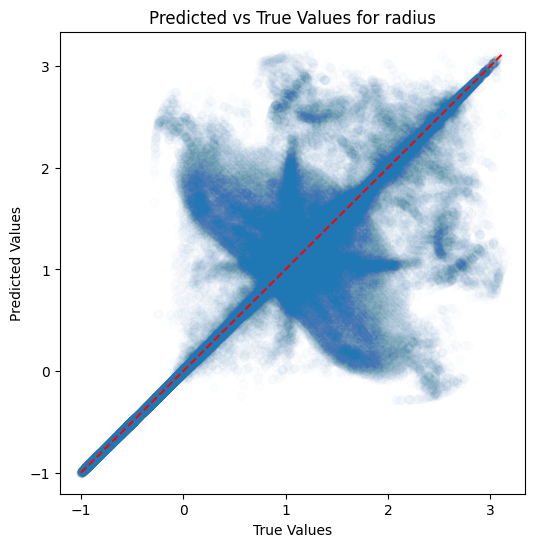

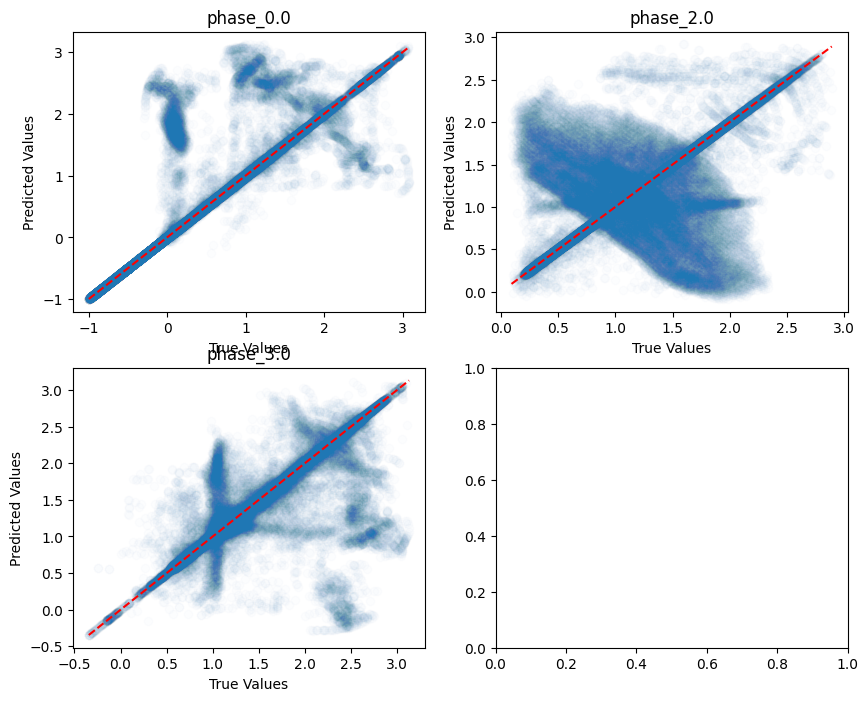

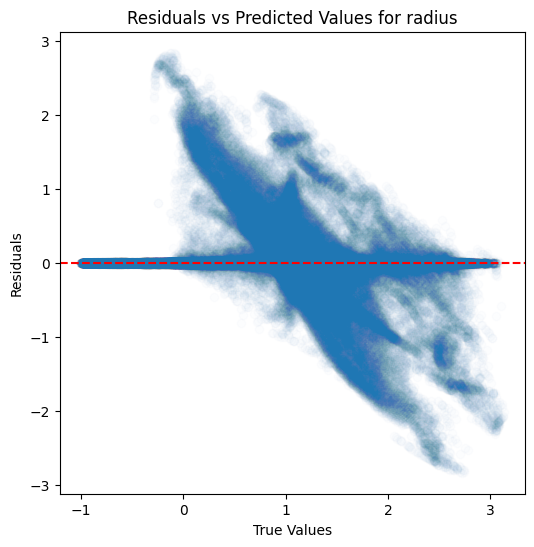

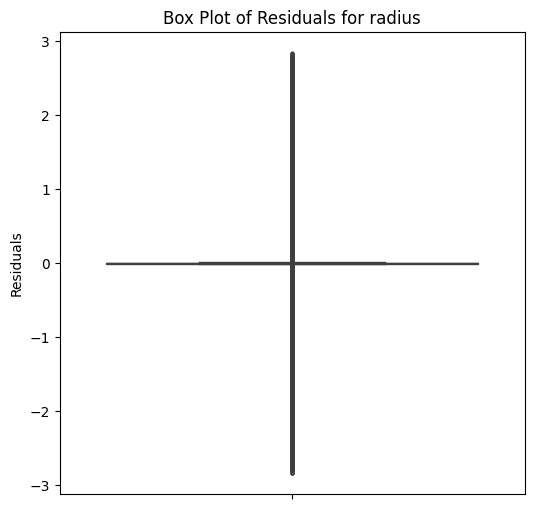

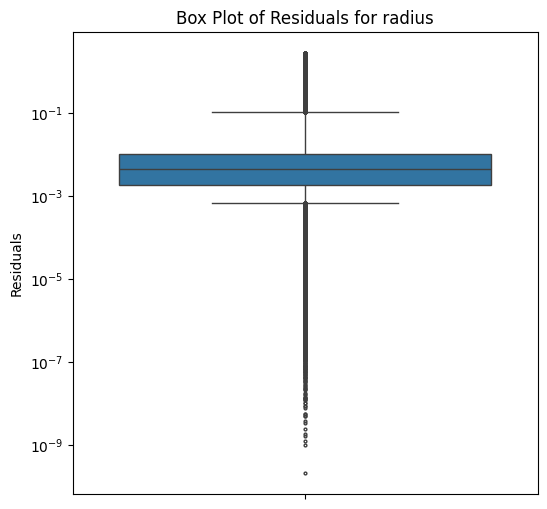

...

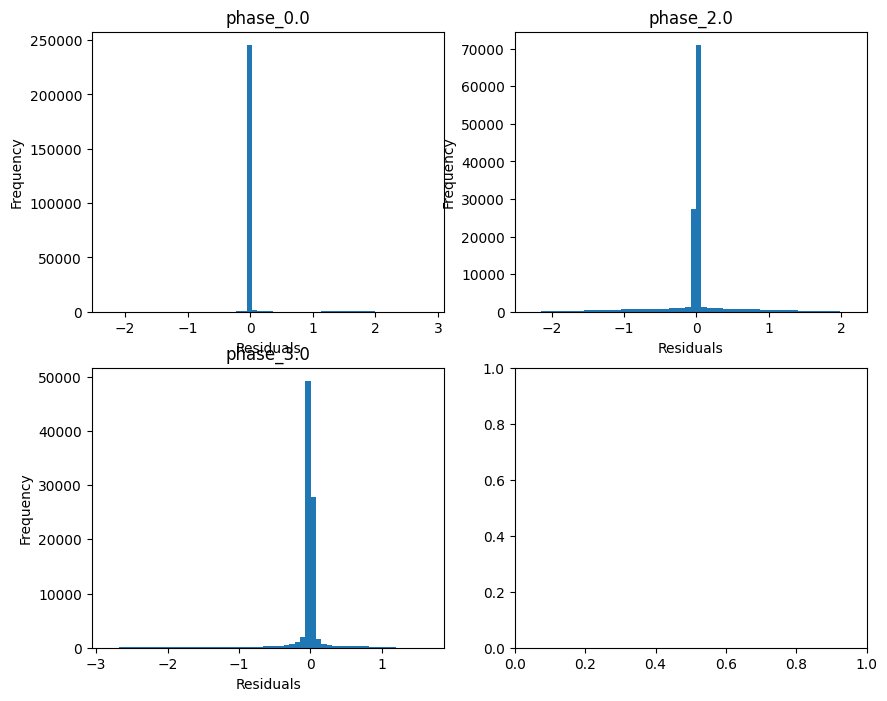

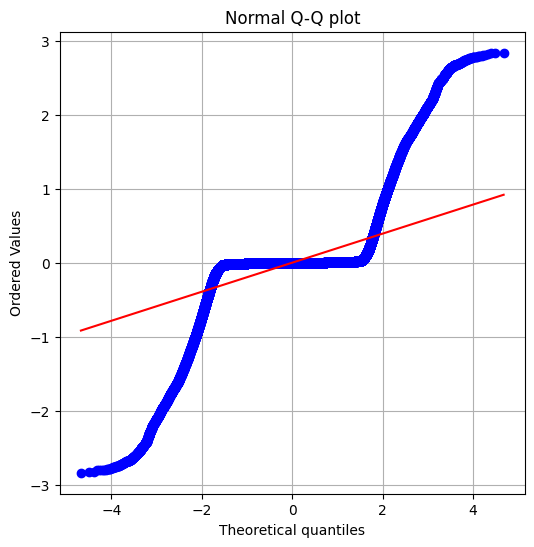

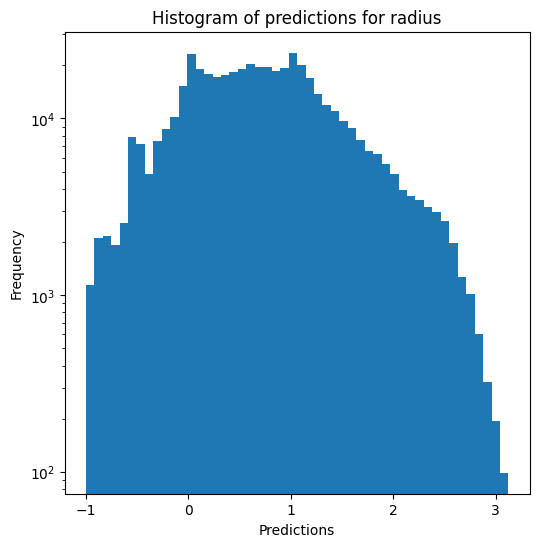

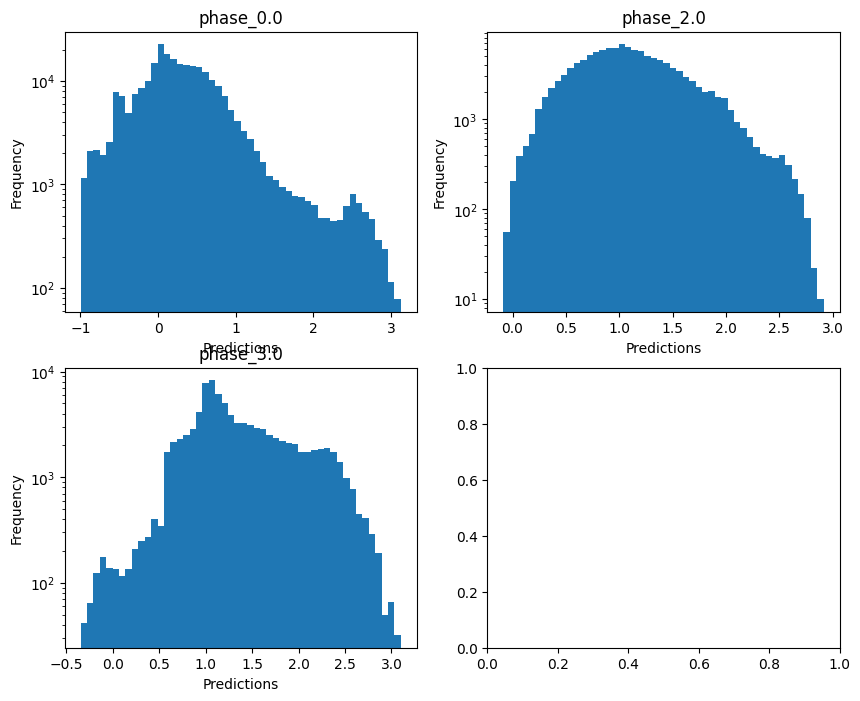

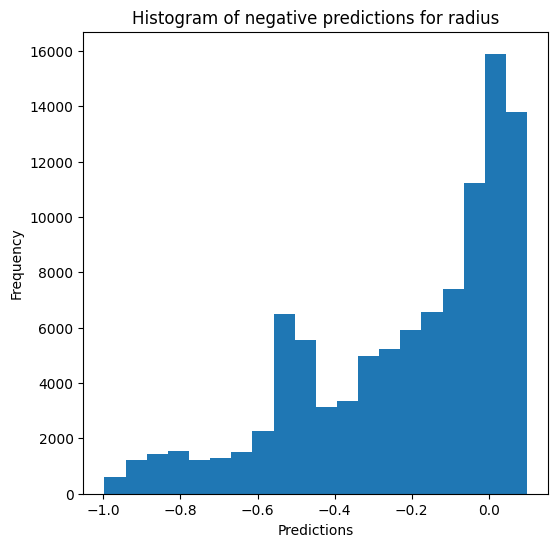

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9795972895047481
  RMSE :  0.050450089742862594
  MAE :  0.010427203327284773
  MedAE :  0.0014701746617009626
  CORR :  0.9897827730900279
  MAX_ER :  0.9161086762692139
  Percentiles : 
    75th percentile :  0.0031612302285888294
    90th percentile :  0.00743896327255338
    95th percentile :  0.028300041972230357
    99th percentile :  0.25077840868395723

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9843516318801757
  RMSE :  0.03959214749841299
  MAE :  0.01654104068618515
  MedAE :  0.002144211097382609
  CORR :  0.992151361185105
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.010459284258129475
    90th percentile :  0.056579135407041

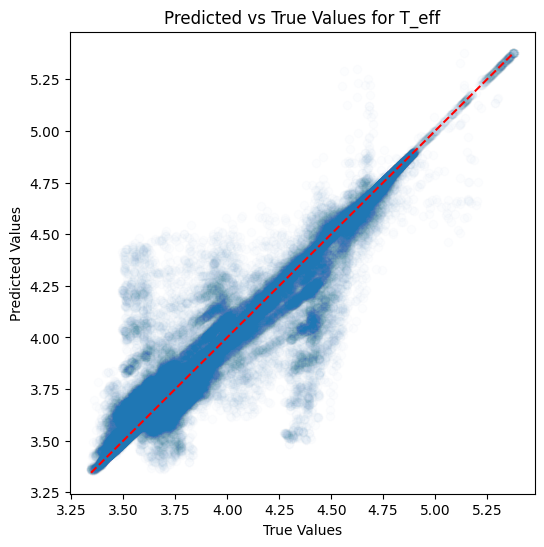

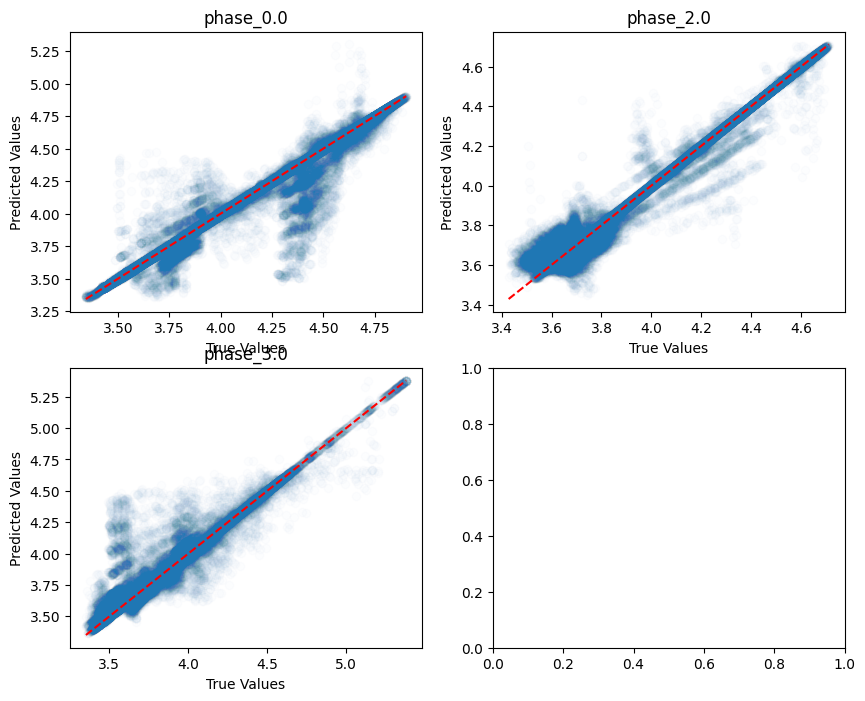

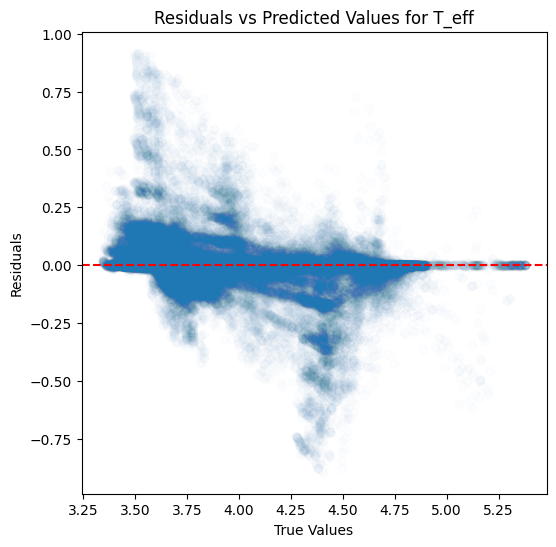

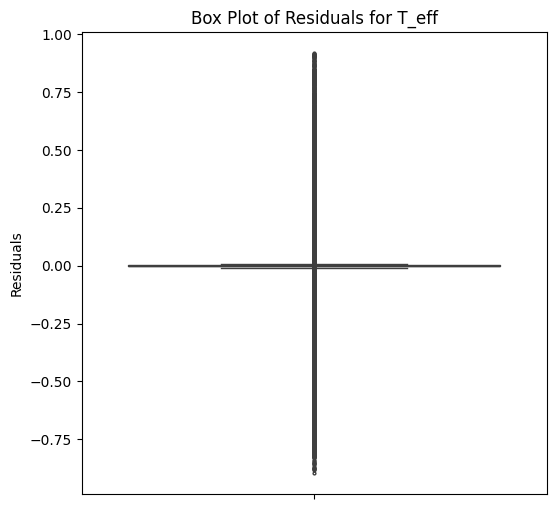

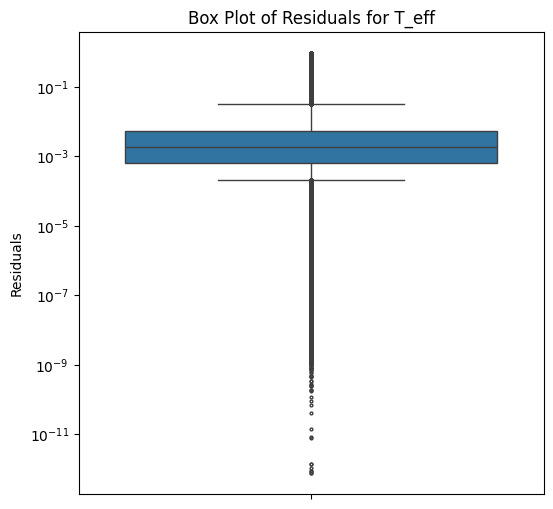

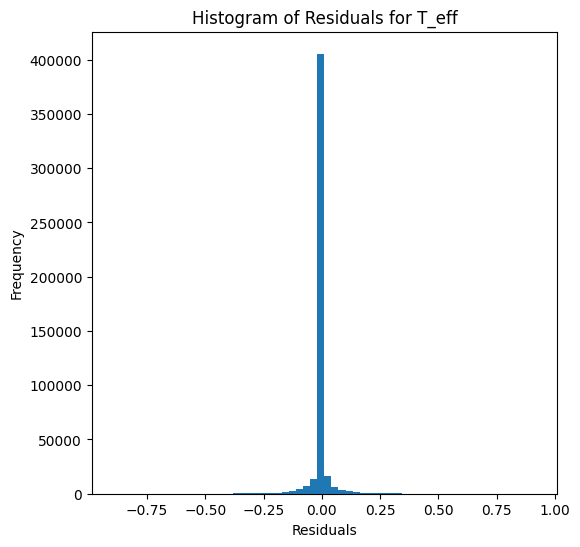

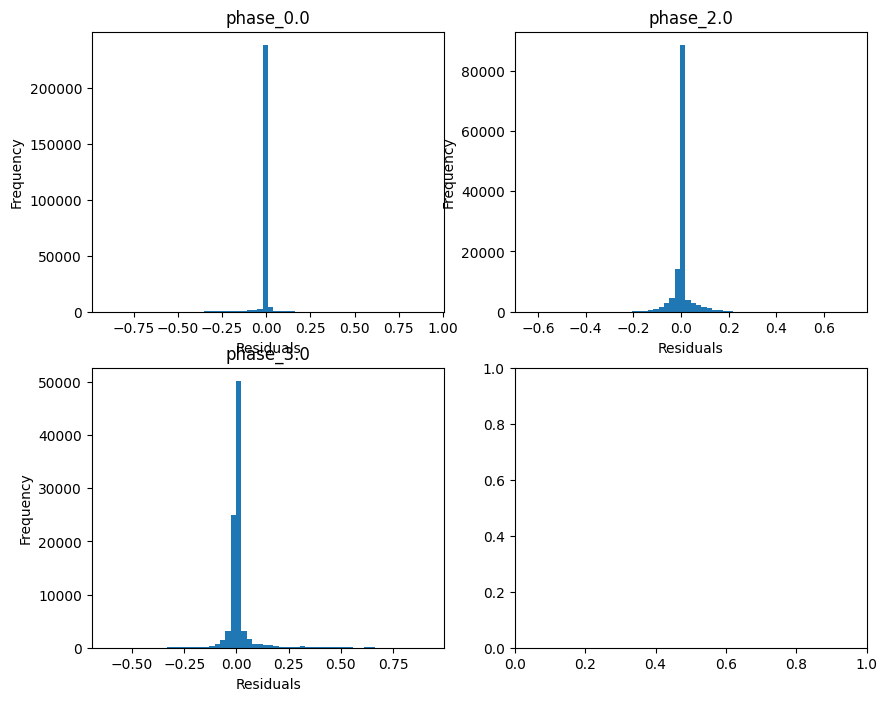

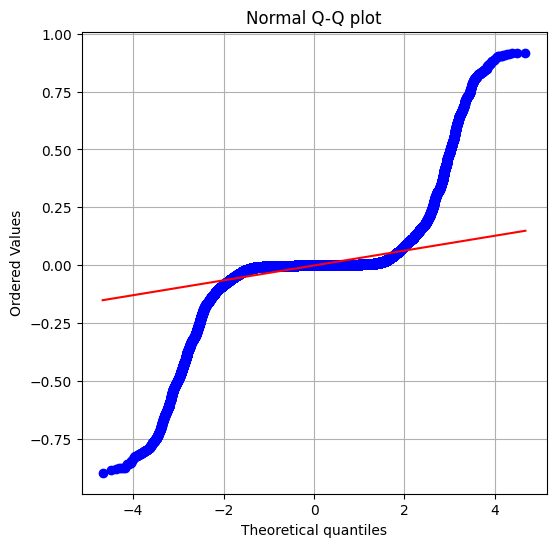

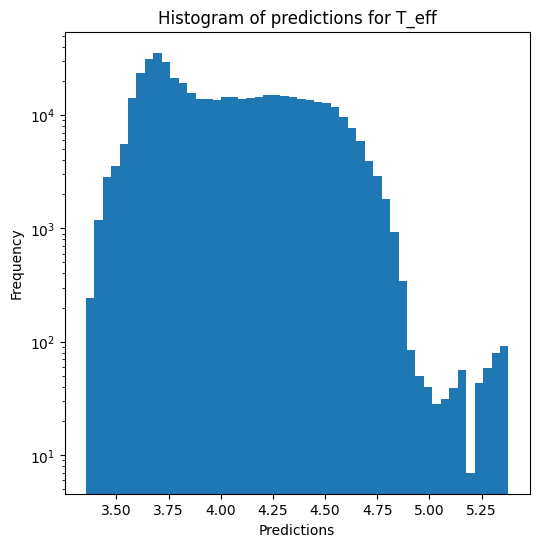

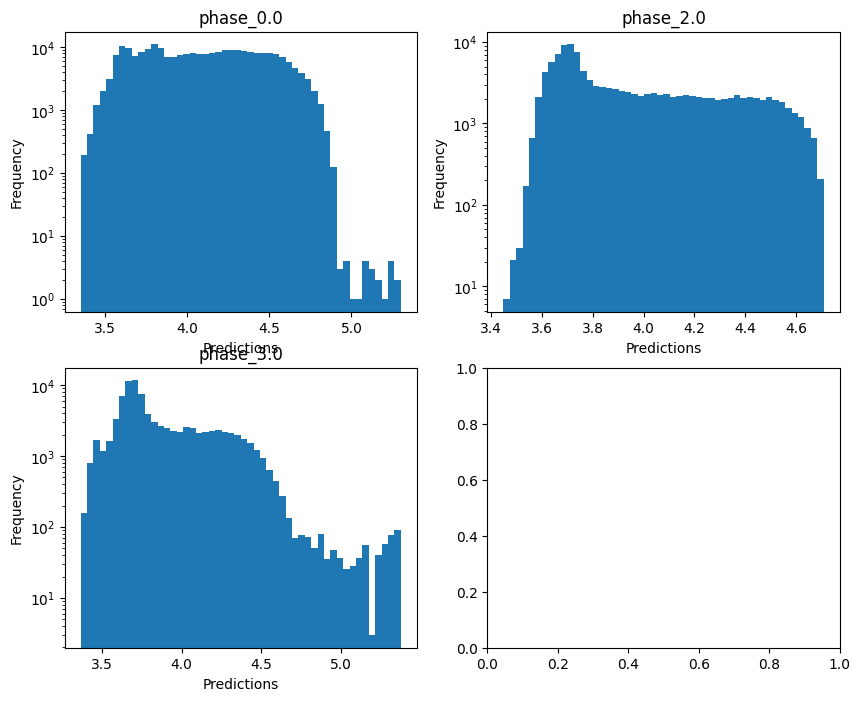


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.7240932323440599
  RMSE :  0.33187404281728927
  MAE :  0.0616549116835952
  MedAE :  0.0028837255297560205
  CORR :  0.8867512302011042
  MAX_ER :  5.572704498947318
  Percentiles : 
    75th percentile :  0.006914886350063987
    90th percentile :  0.018431711577060608
    95th percentile :  0.123019706781153
    99th percentile :  1.7983633043371139

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.595896903825001
  RMSE :  0.5789627610914576
  MAE :  0.24721627397774565
  MedAE :  0.010287925017565147
  CORR :  0.7759932574016178
  MAX_ER :  4.587359712892218
  Percentiles : 
    75th percentile :  0.14292810575018122
    90th percentile :  0.9746860582533188
    95th percentile :  1.4712983160468076
    99th percentile :  2.3197640818234917

log_g results for the phase category with

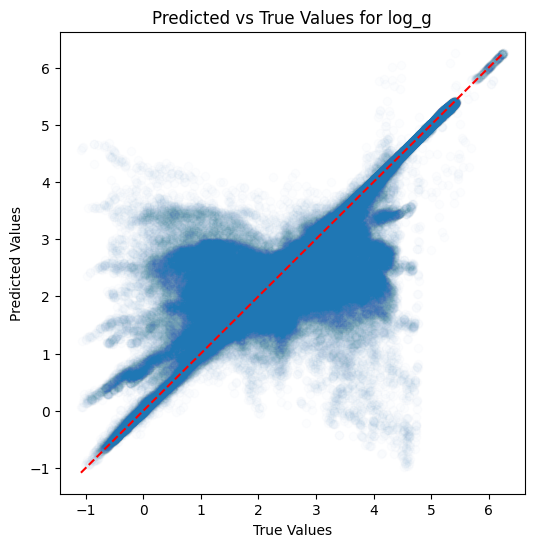

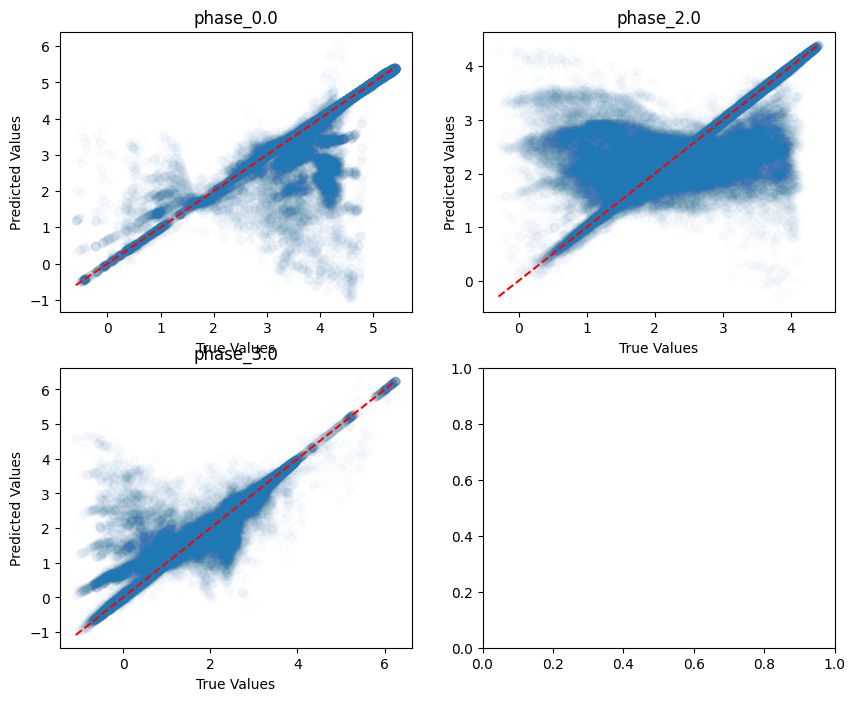

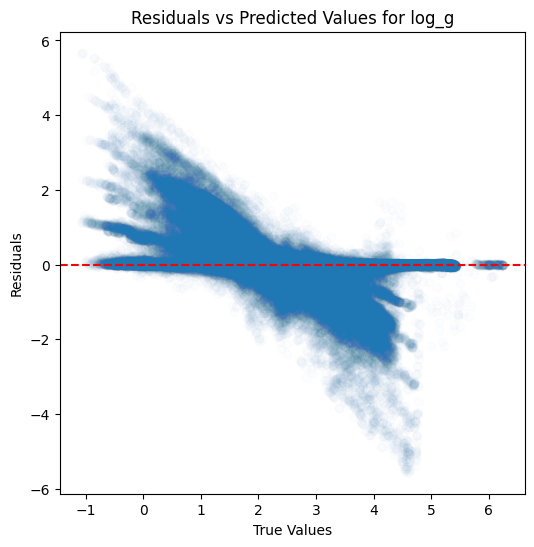

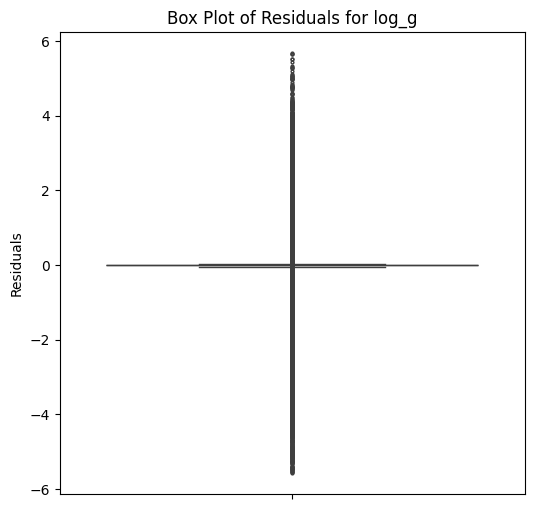

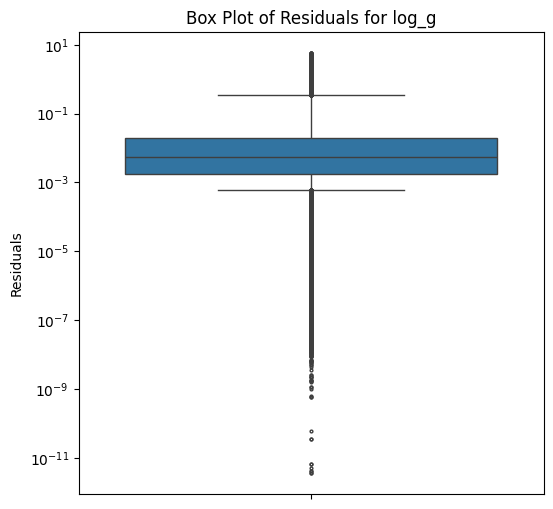

...

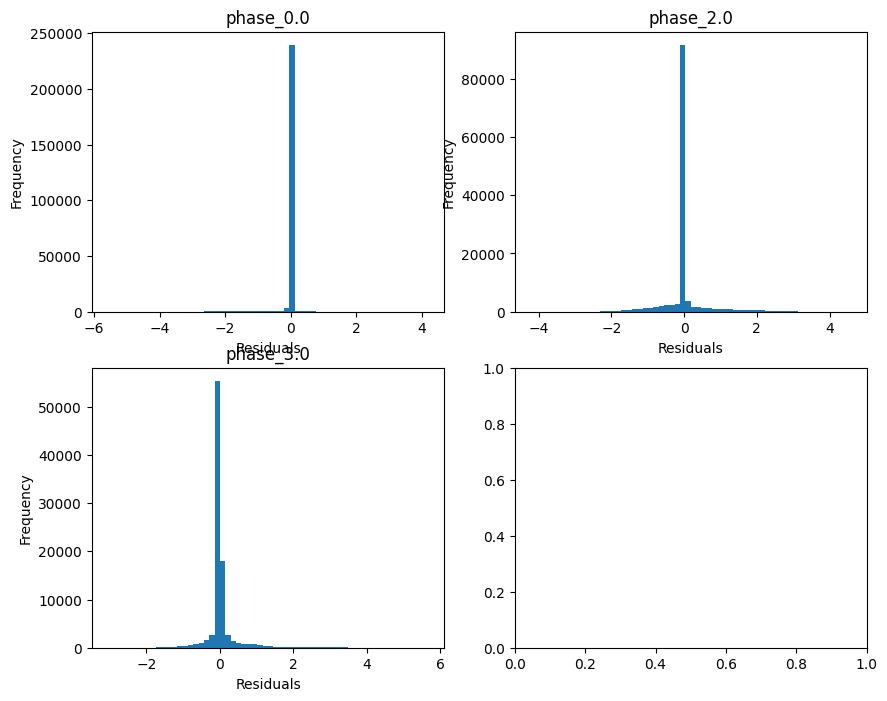

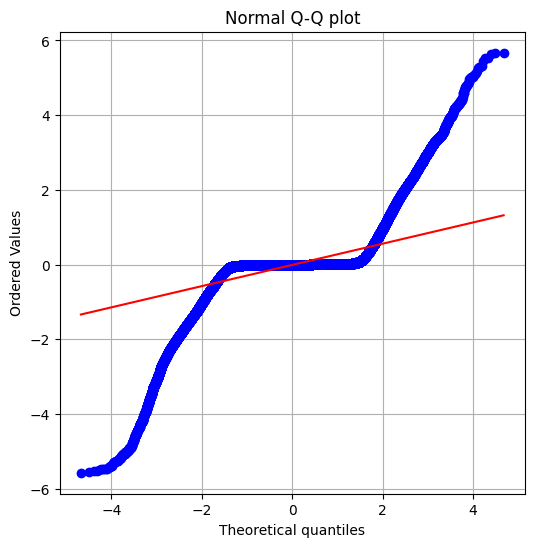

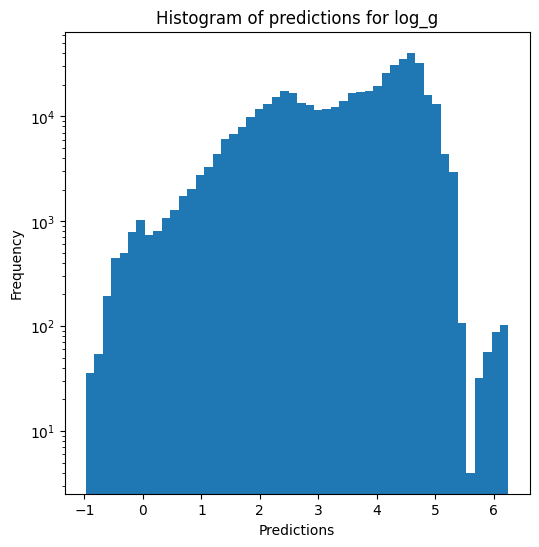

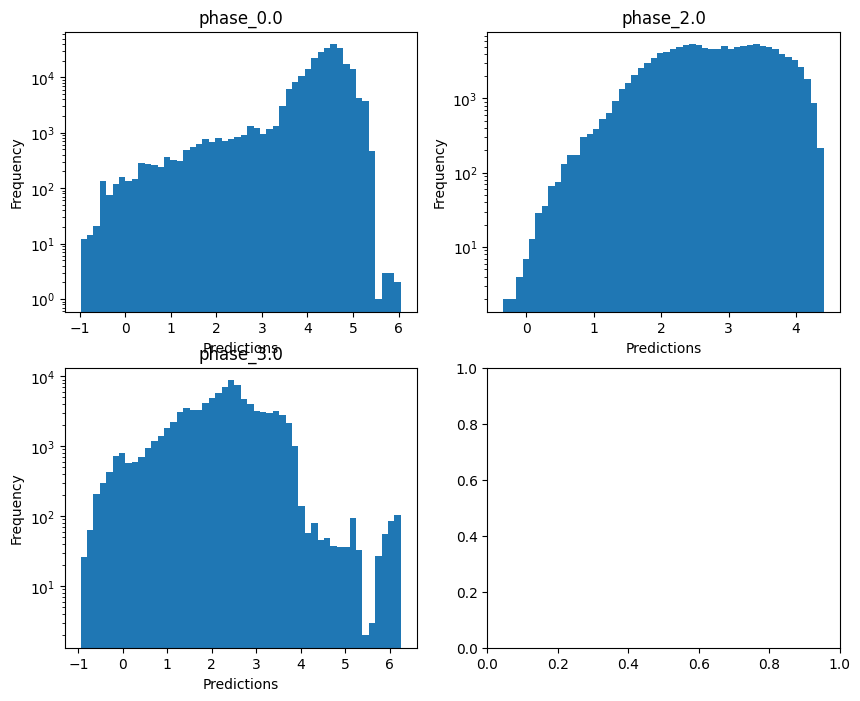

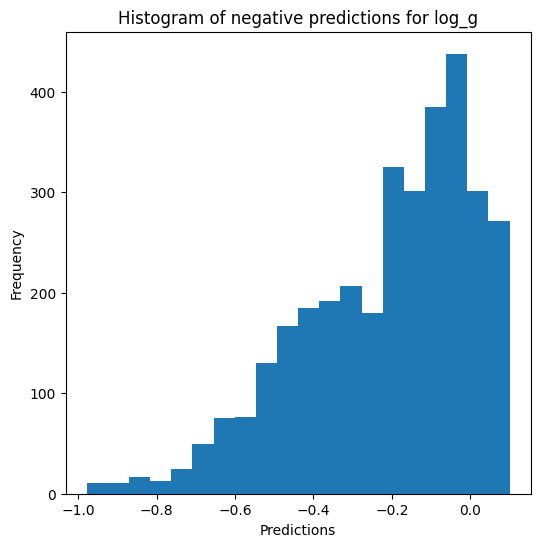


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.916522014528654
  RMSE :  0.16620708466951598
  MAE :  0.032474359467852765
  MedAE :  0.002749563704889546
  CORR :  0.9608601938239718
  MAX_ER :  2.788066779003325
  Percentiles : 
    75th percentile :  0.005768516851805447
    90th percentile :  0.014114480475520386
    95th percentile :  0.06508126285166288
    99th percentile :  0.9002938137601478

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.6524083606660985
  RMSE :  0.28947609752359355
  MAE :  0.12361275860664189
  MedAE :  0.005156147945734546
  CORR :  0.8126494076260037
  MAX_ER :  2.2937092246449966
  Percentiles : 
    75th percentile :  0.07144812271957901
    90th percentile :  0.4873469486814655
    95th percentile :  0.735581006185444
    99th percentile :  1.1599232492838405

radius results for the phase catego

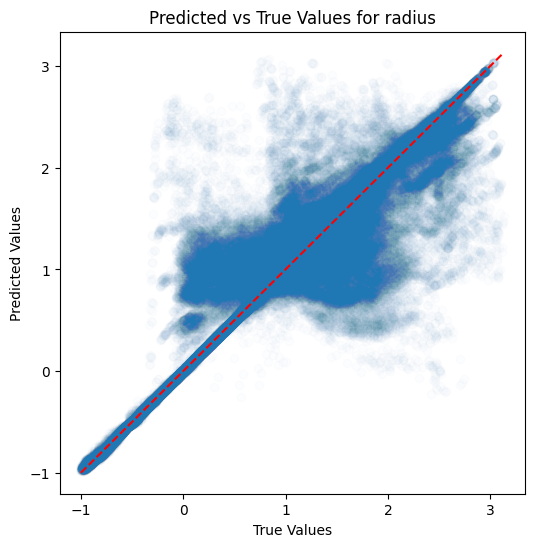

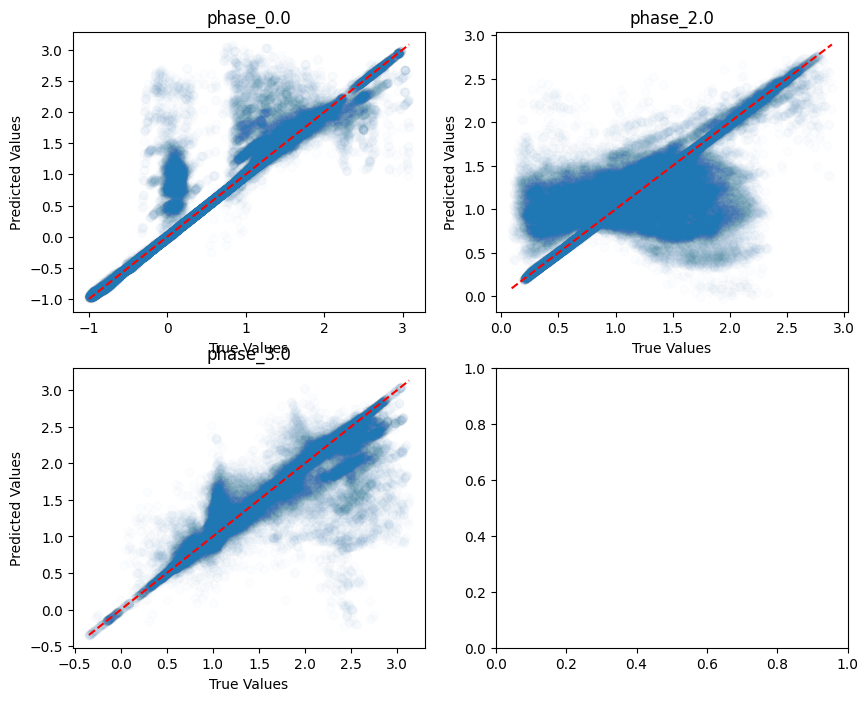

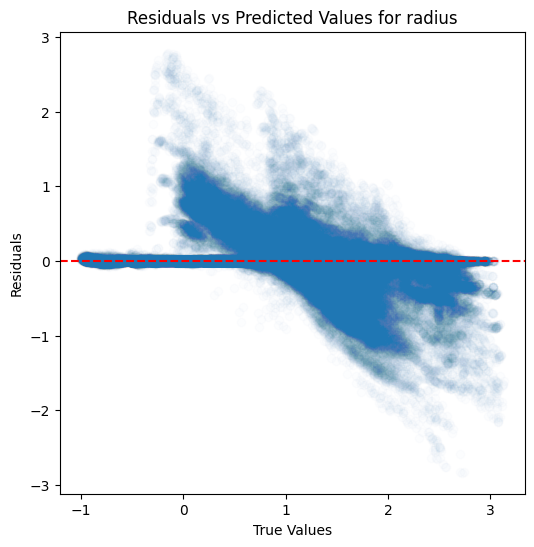

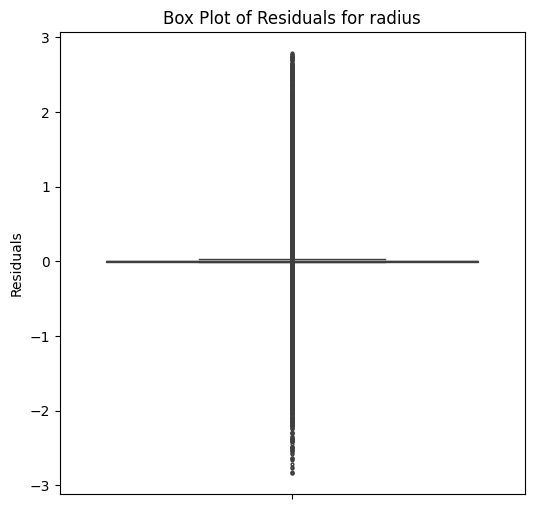

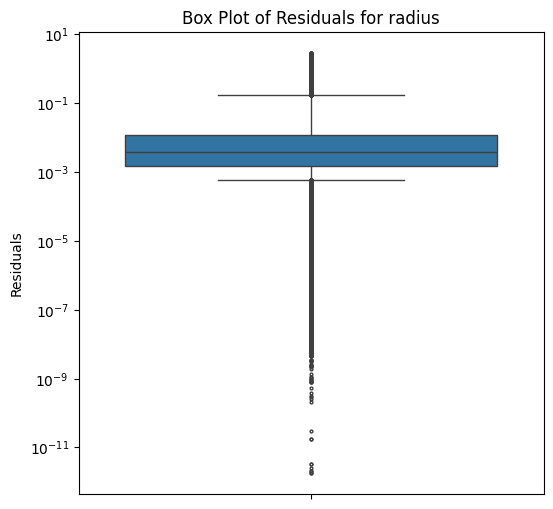

...

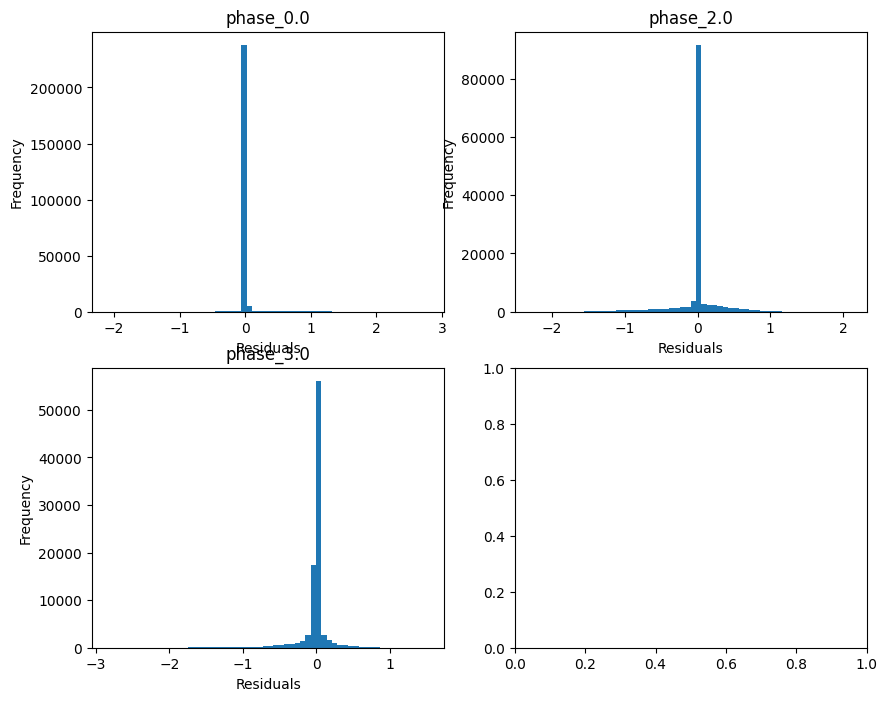

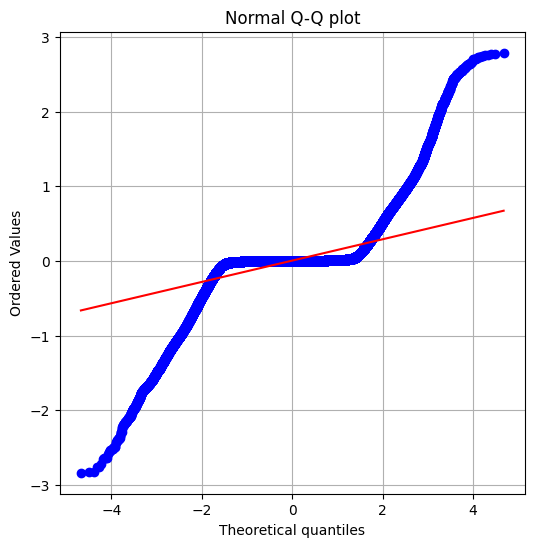

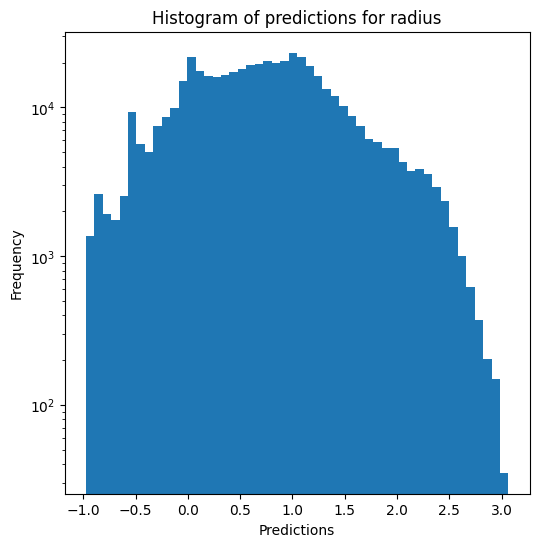

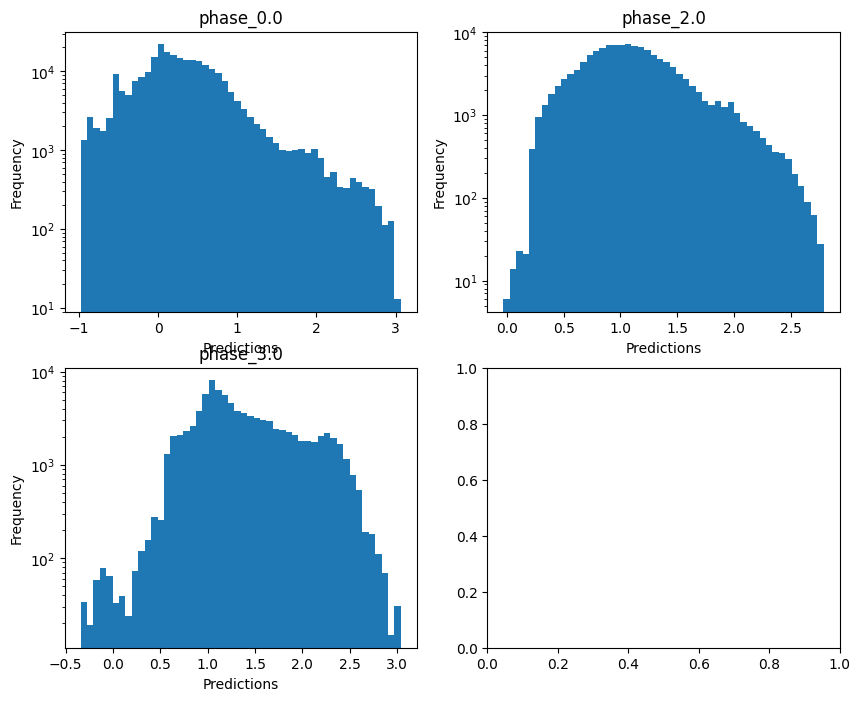

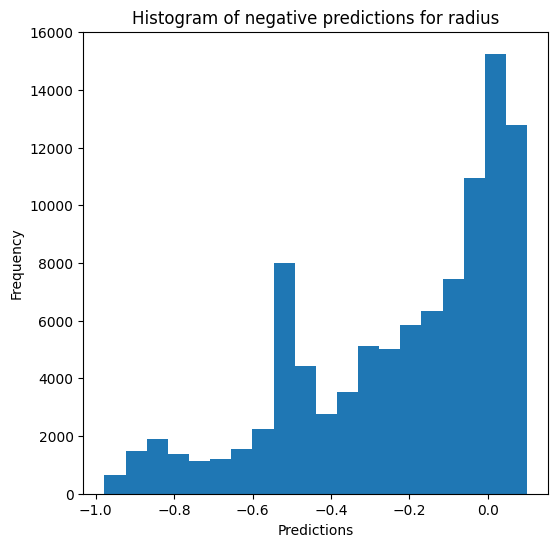

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9741732182997672
  RMSE :  0.05674652376769171
  MAE :  0.01023914289720907
  MedAE :  0.0005776910448969108
  CORR :  0.987123447532878
  MAX_ER :  0.916203044254809
  Percentiles : 
    75th percentile :  0.0014955130368321523
    90th percentile :  0.00503764582311801
    95th percentile :  0.022164570707993454
    99th percentile :  0.30991524659231134

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9748377659913344
  RMSE :  0.05020254004707223
  MAE :  0.019925446244382895
  MedAE :  0.0021000670430750823
  CORR :  0.9873426149349664
  MAX_ER :  0.7222805607319285
  Percentiles : 
    75th percentile :  0.01114501409224844
    90th percentile :  0.06895835285003402

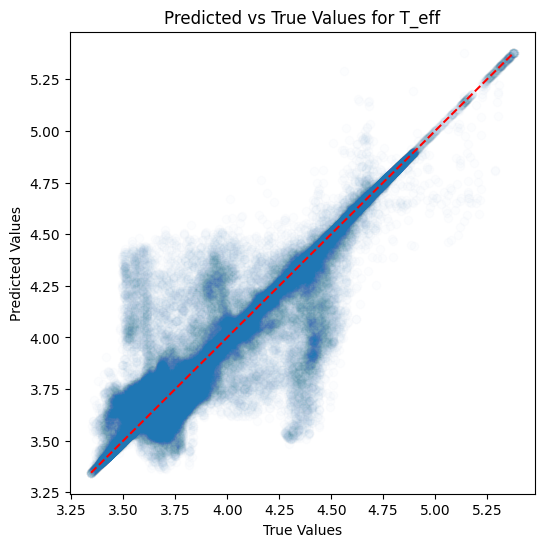

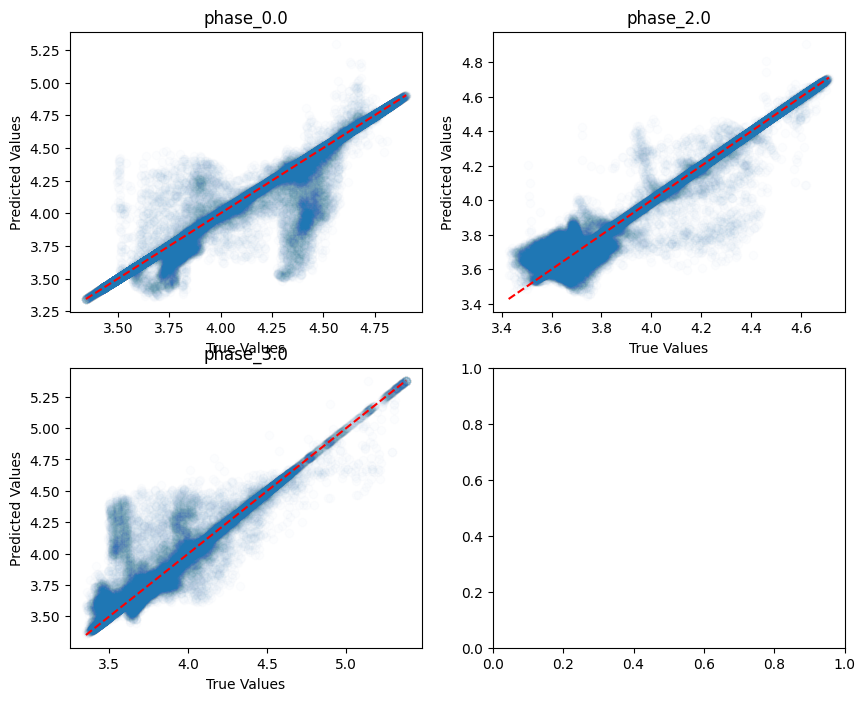

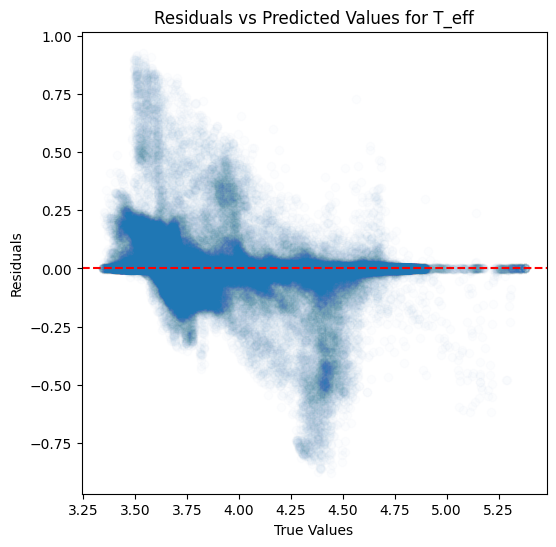

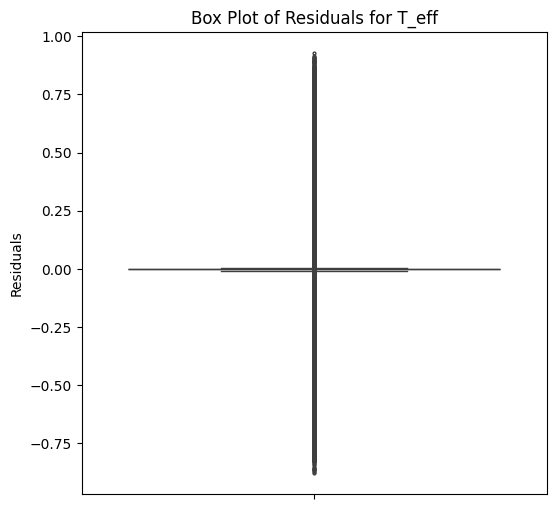

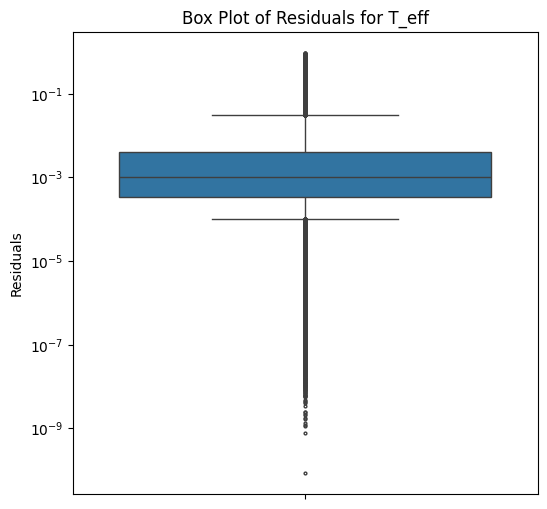

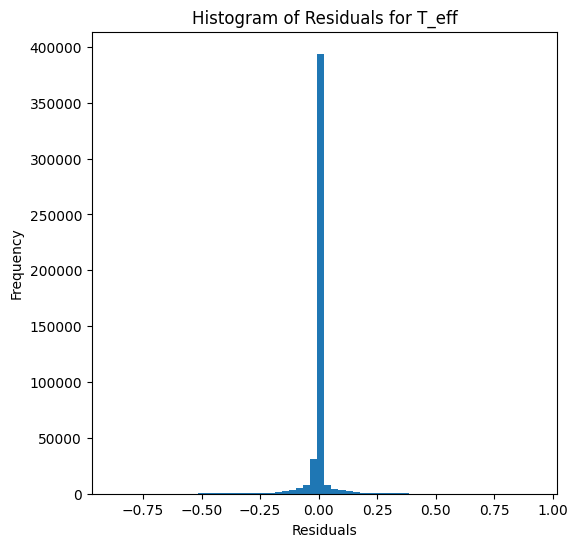

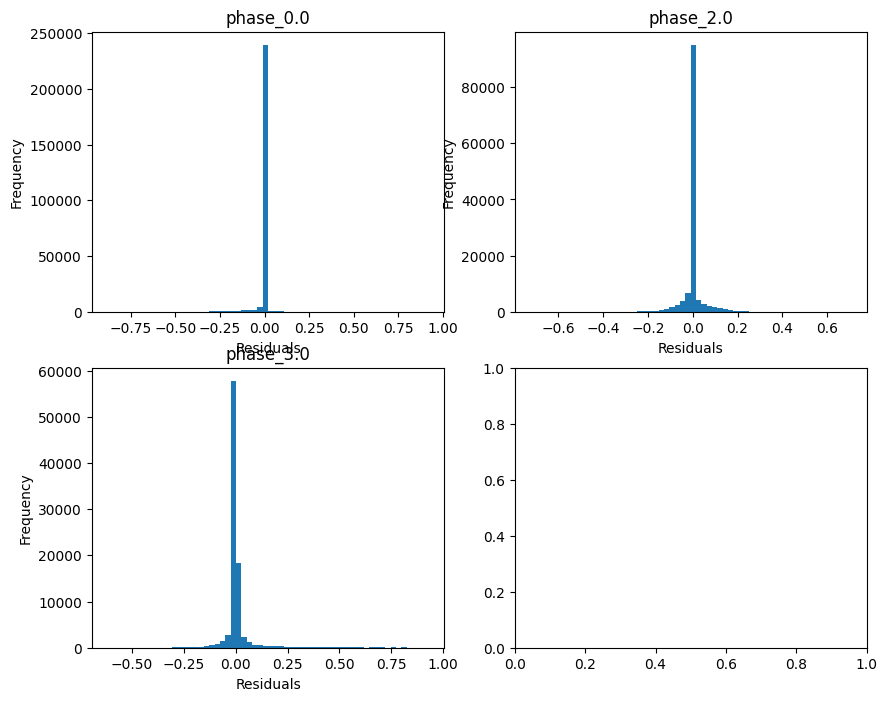

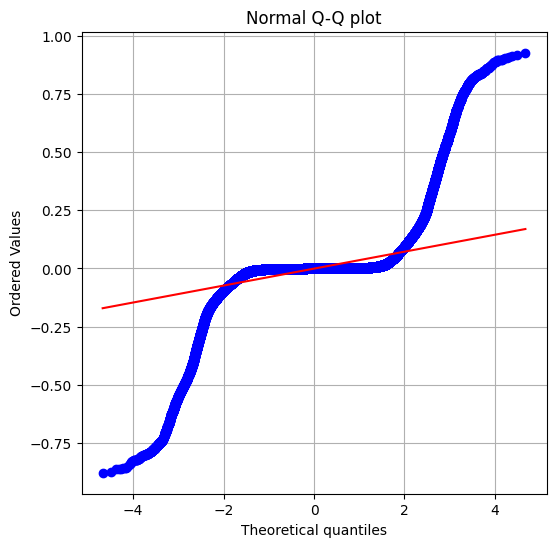

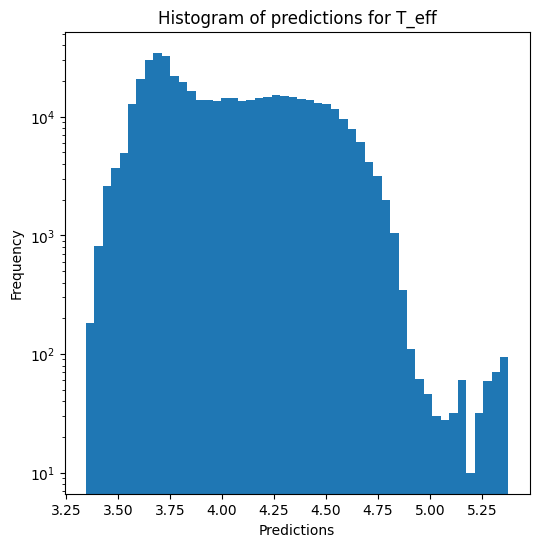

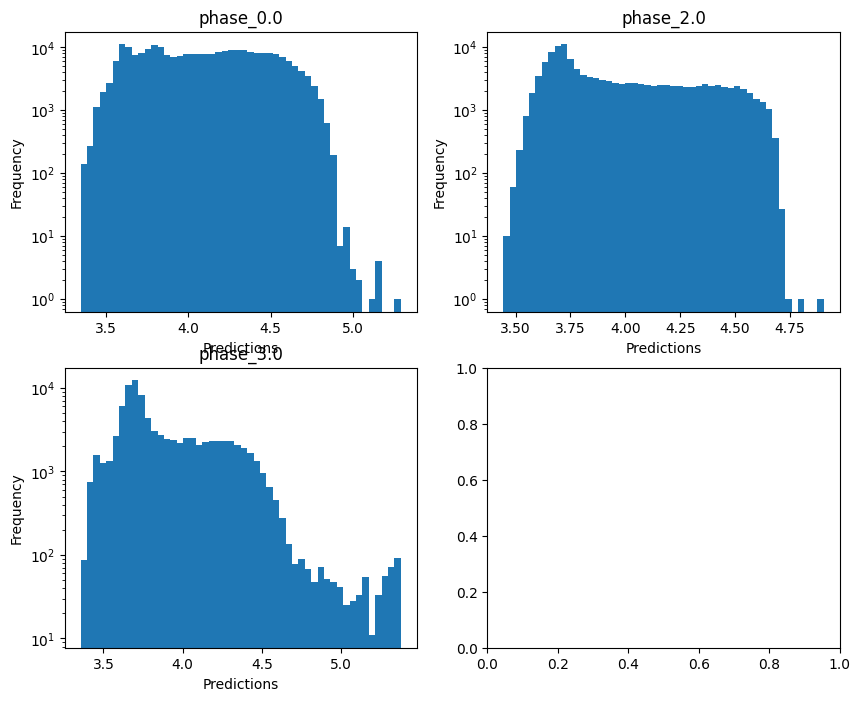


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6551770944148279
  RMSE :  0.3711670123207571
  MAE :  0.06815418816191786
  MedAE :  0.0017677549781955904
  CORR :  0.8636357039072204
  MAX_ER :  5.579727982686569
  Percentiles : 
    75th percentile :  0.005273593788950981
    90th percentile :  0.019475283922257048
    95th percentile :  0.14048588822659616
    99th percentile :  2.1869796352123885

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.3865878927575134
  RMSE :  0.7132311000925535
  MAE :  0.3016709881276155
  MedAE :  0.010287095706059457
  CORR :  0.6633979629987422
  MAX_ER :  4.588712721187647
  Percentiles : 
    75th percentile :  0.13803941574550205
    90th percentile :  1.2347069648587965
    95th percentile :  1.8673415310874975
    99th percentile :  2.8668535063225438

log_g results for the phase category wi

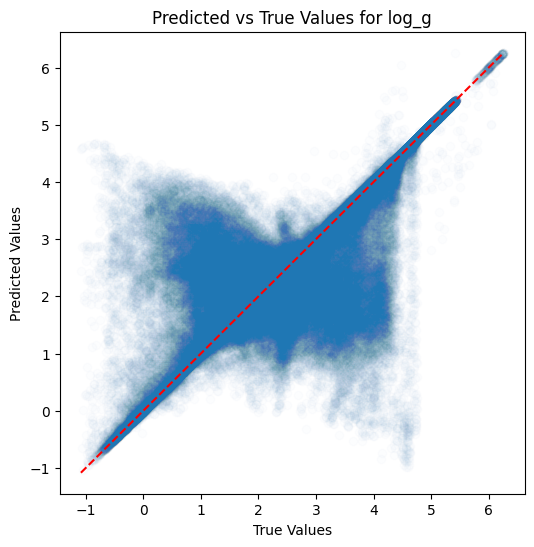

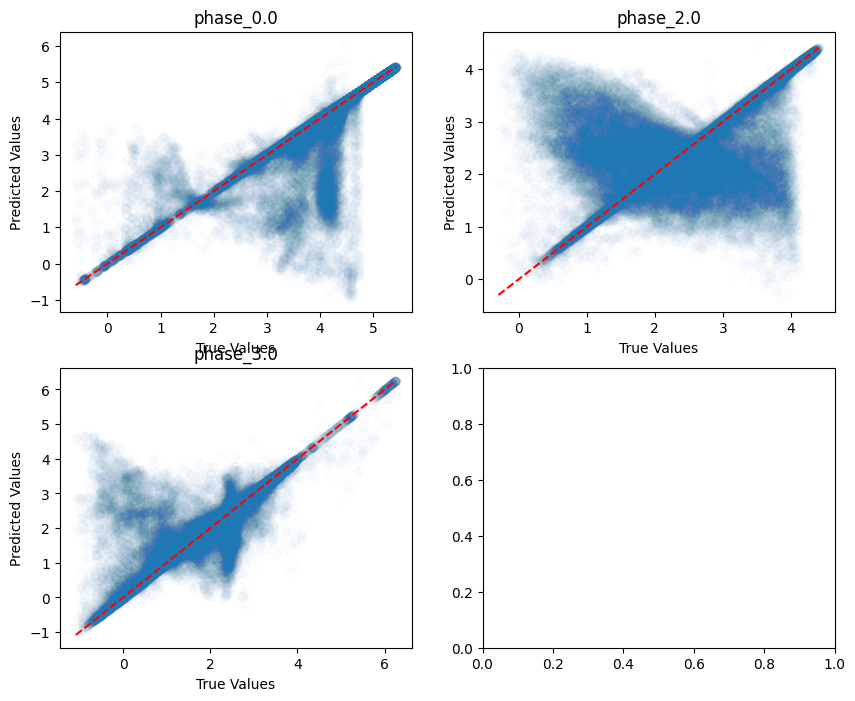

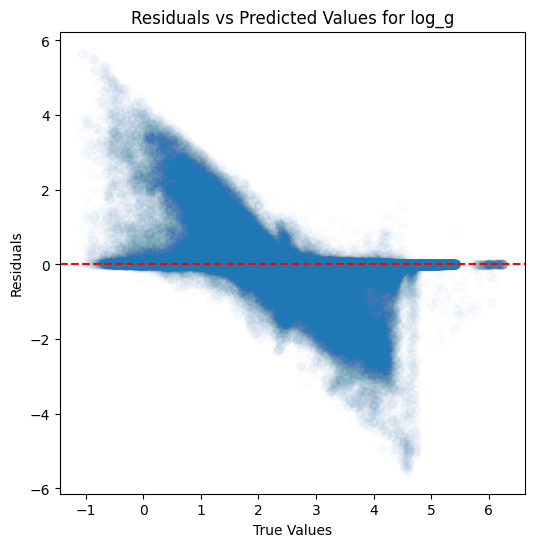

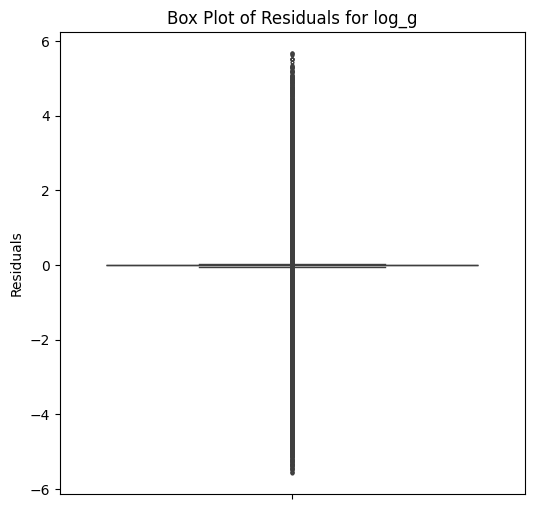

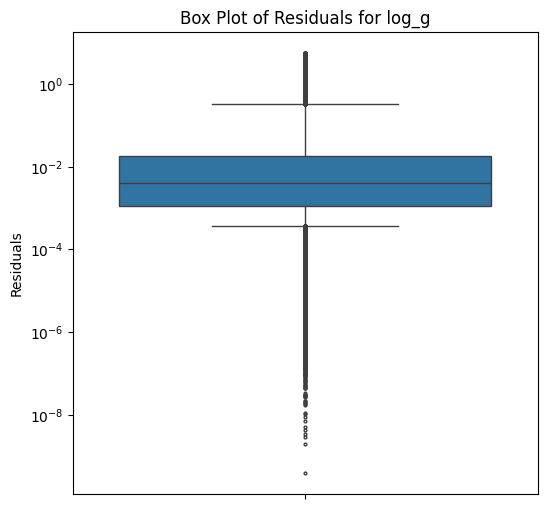

...

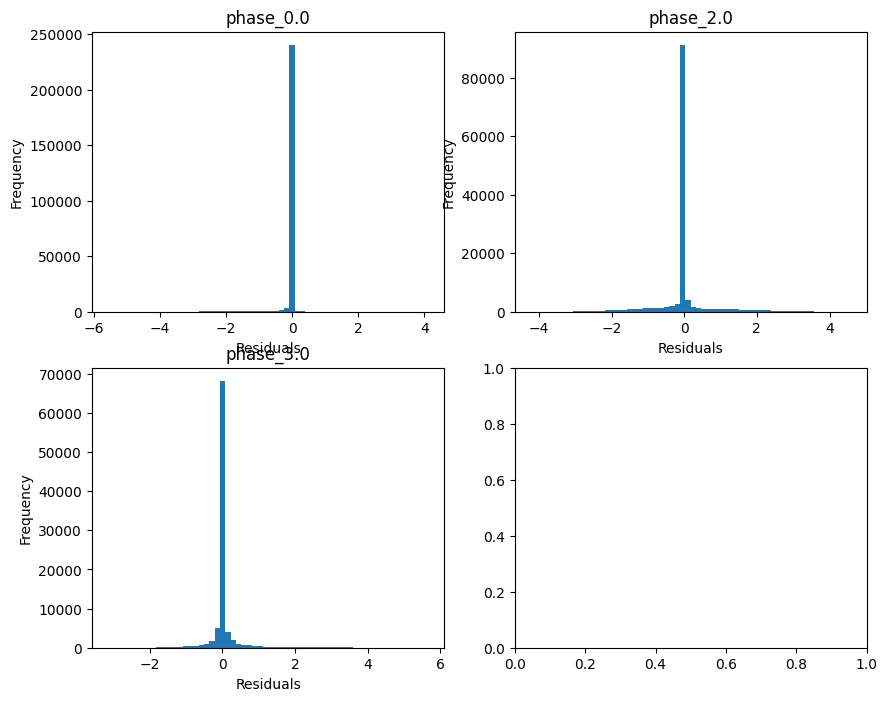

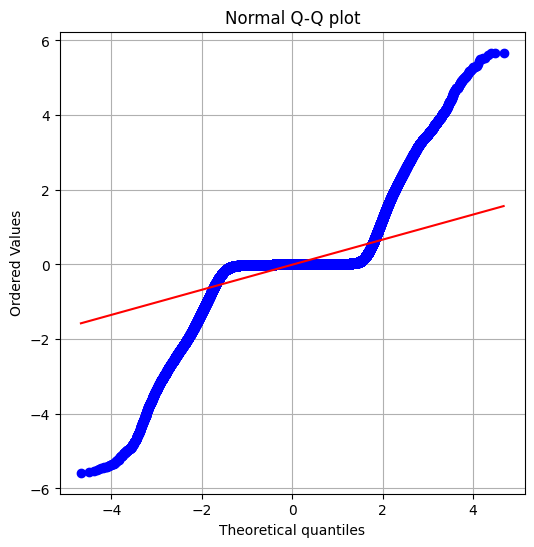

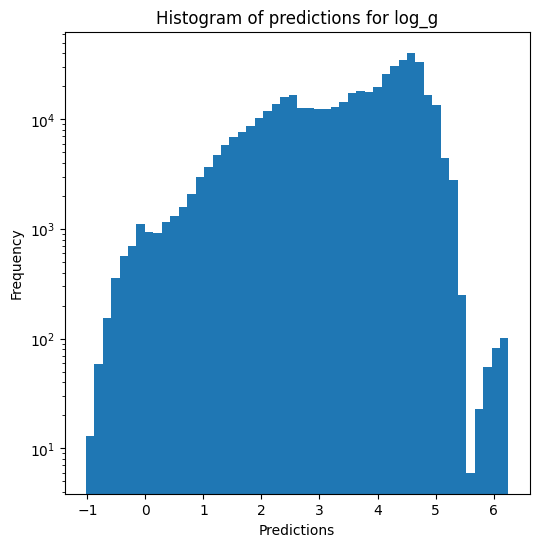

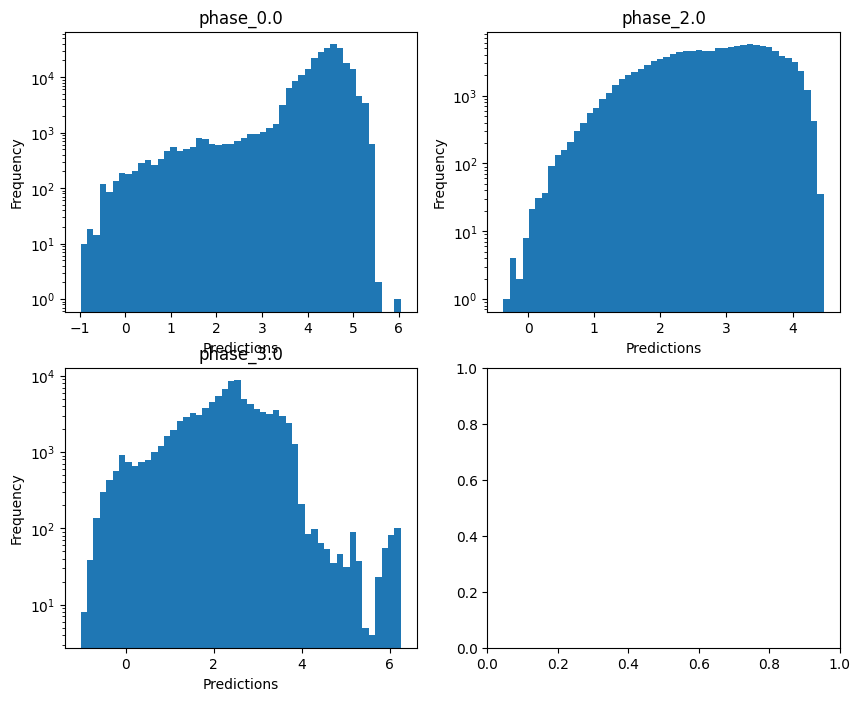

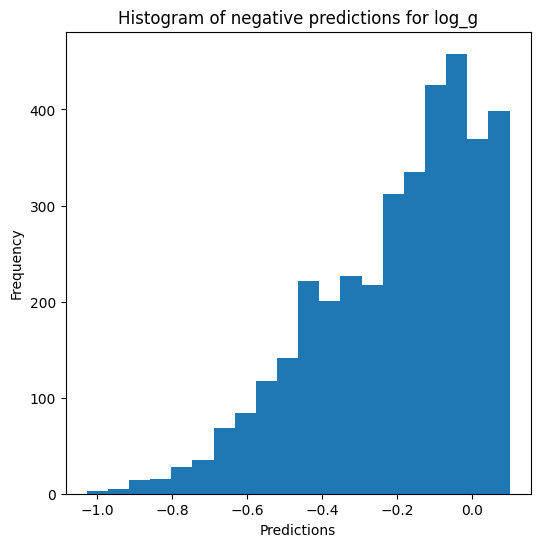


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8958047717666149
  RMSE :  0.18578341990864036
  MAE :  0.03443390585776906
  MedAE :  0.0011520933320112448
  CORR :  0.9514927392446253
  MAX_ER :  2.791559951081879
  Percentiles : 
    75th percentile :  0.003177264730492492
    90th percentile :  0.010667830876480065
    95th percentile :  0.07061792486065531
    99th percentile :  1.0951193066223195

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4723744819110136
  RMSE :  0.3566076819902055
  MAE :  0.1508377457986865
  MedAE :  0.005151919078778988
  CORR :  0.720789350938878
  MAX_ER :  2.294455398621409
  Percentiles : 
    75th percentile :  0.06902950947080844
    90th percentile :  0.6173827877724685
    95th percentile :  0.933711524949541
    99th percentile :  1.4333903524621403

radius results for the phase category 

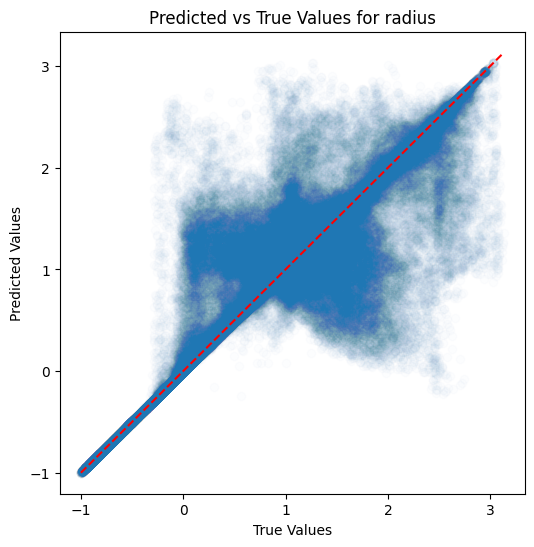

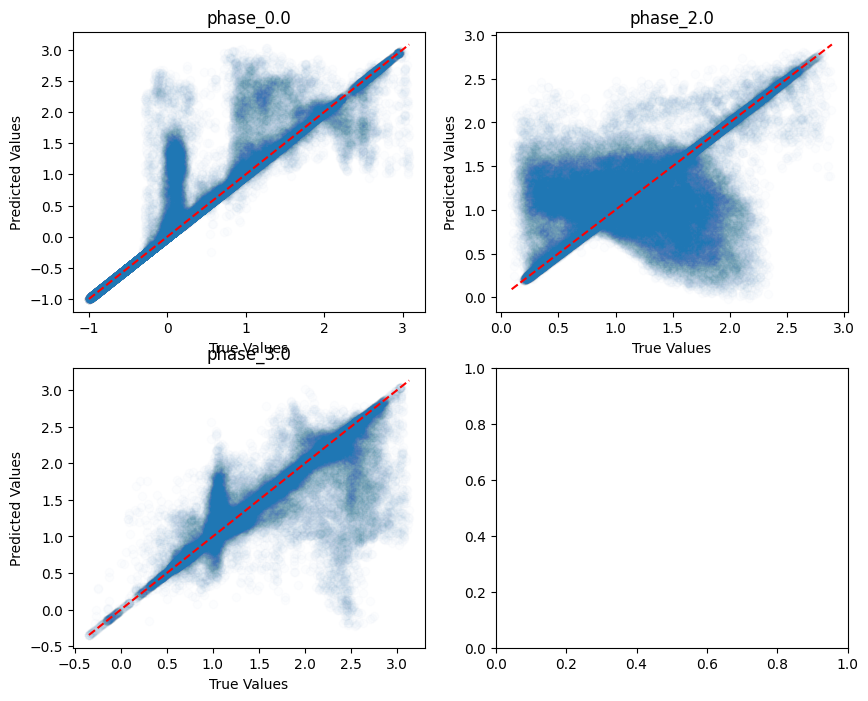

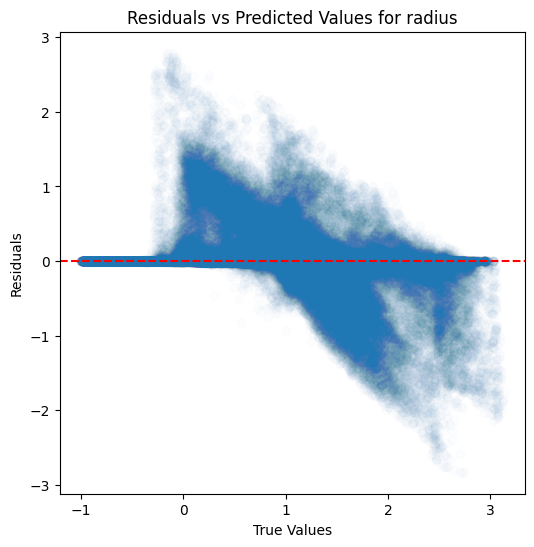

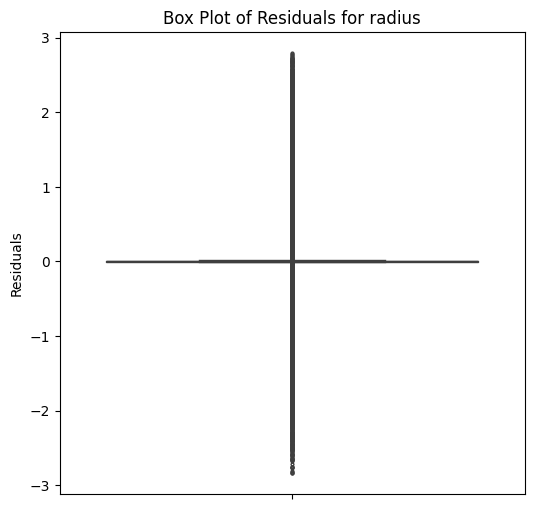

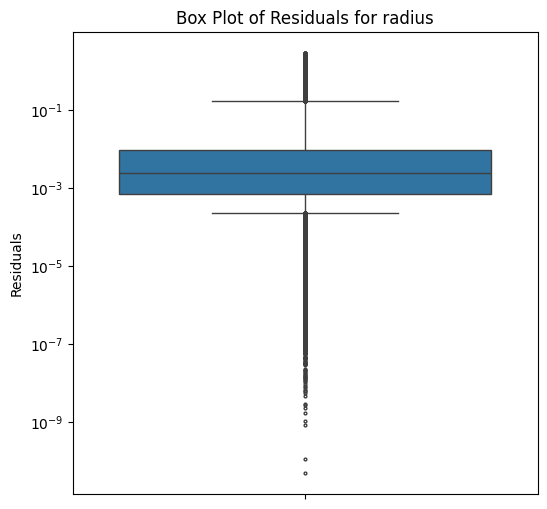

...

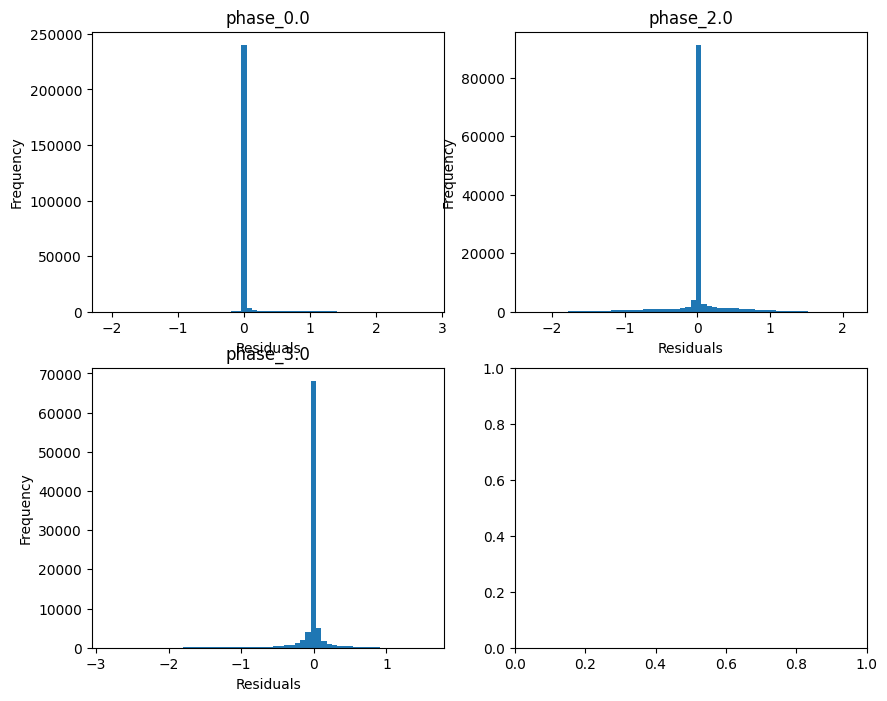

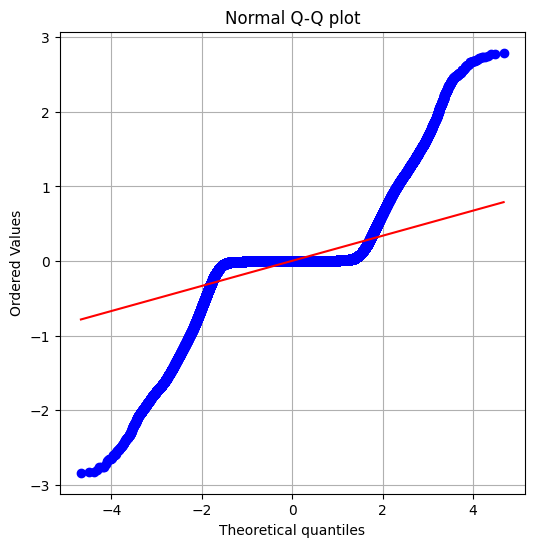

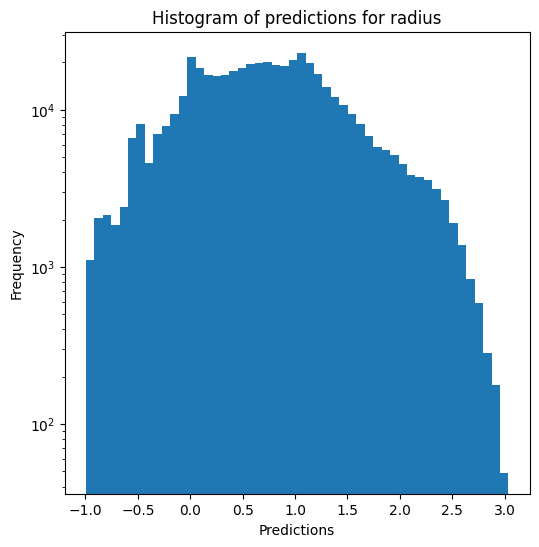

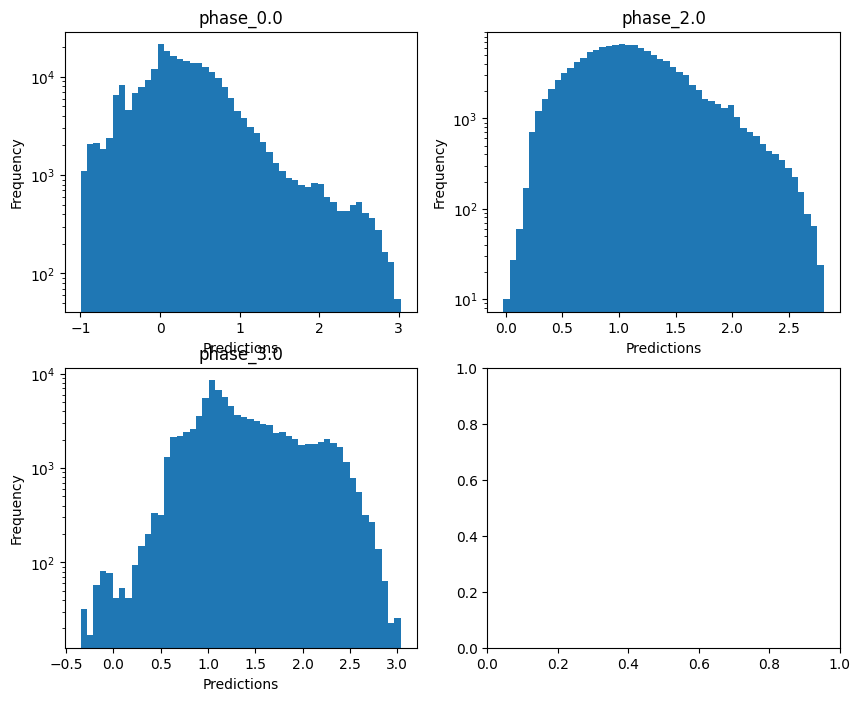

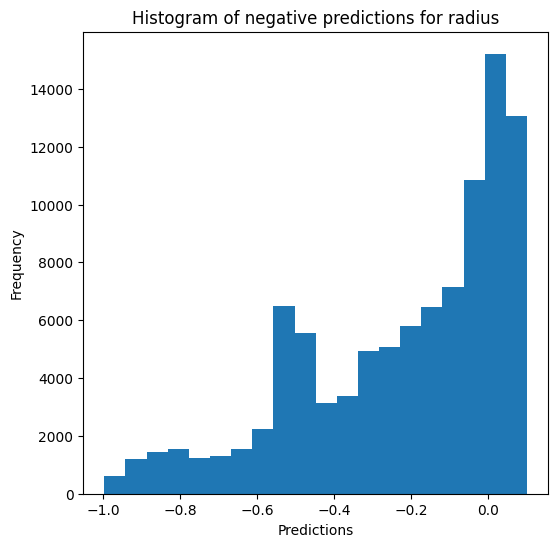

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9411032034414745
  RMSE :  0.09202810718625536
  MAE :  0.05068022044690287
  MedAE :  0.01590337838007594
  CORR :  0.970382156964214
  MAX_ER :  0.7805575089809458
  Percentiles : 
    75th percentile :  0.06177221698947055
    90th percentile :  0.15588197283574817
    95th percentile :  0.22211510677535118
    99th percentile :  0.3465406380271093

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8743195401885882
  RMSE :  0.11425003351180722
  MAE :  0.08531197583758551
  MedAE :  0.06480835206190827
  CORR :  0.9357671319435953
  MAX_ER :  0.5014623088057348
  Percentiles : 
    75th percentile :  0.11874353597966514
    90th percentile :  0.18821395559560383
    95t

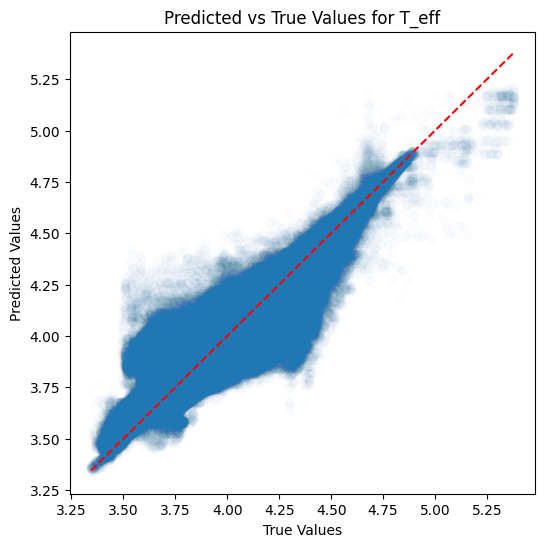

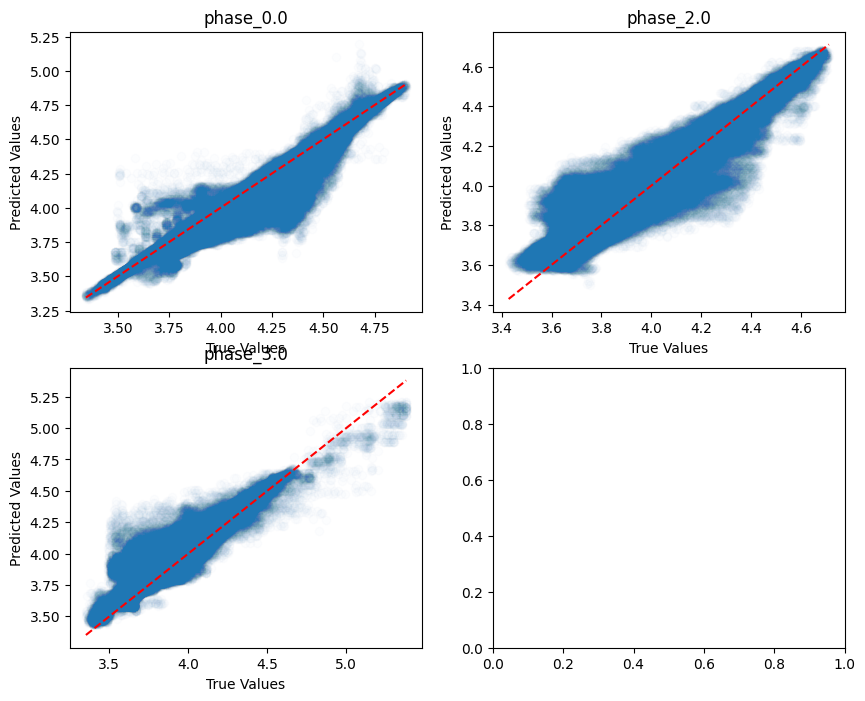

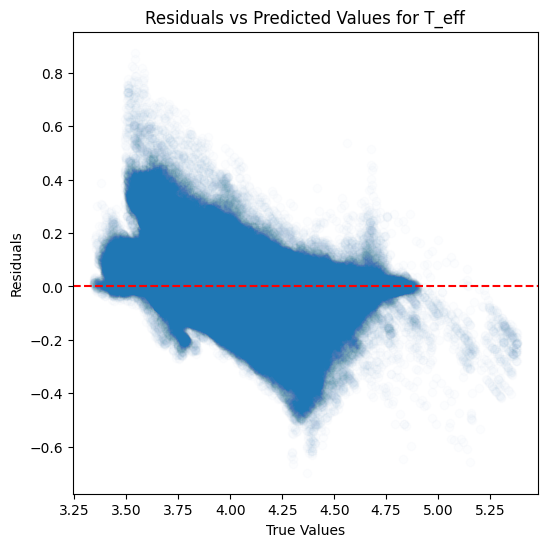

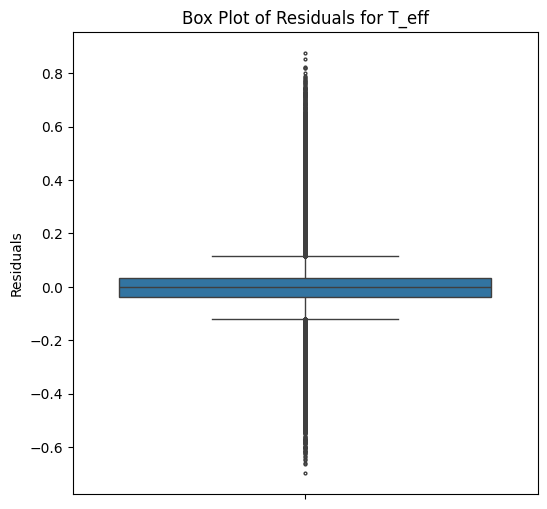

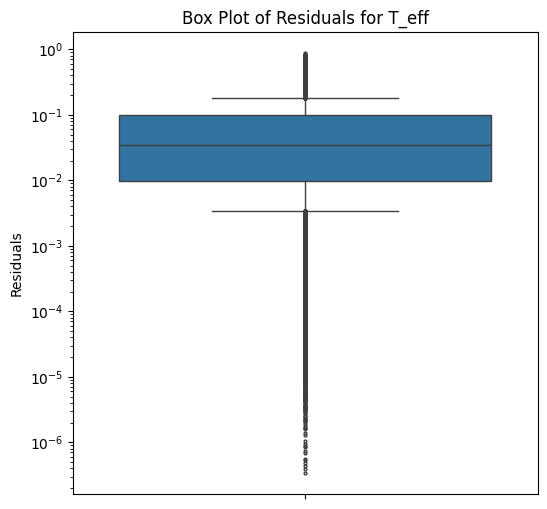

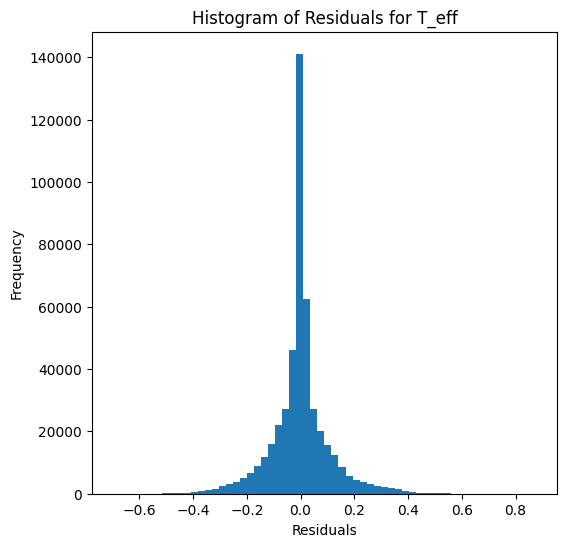

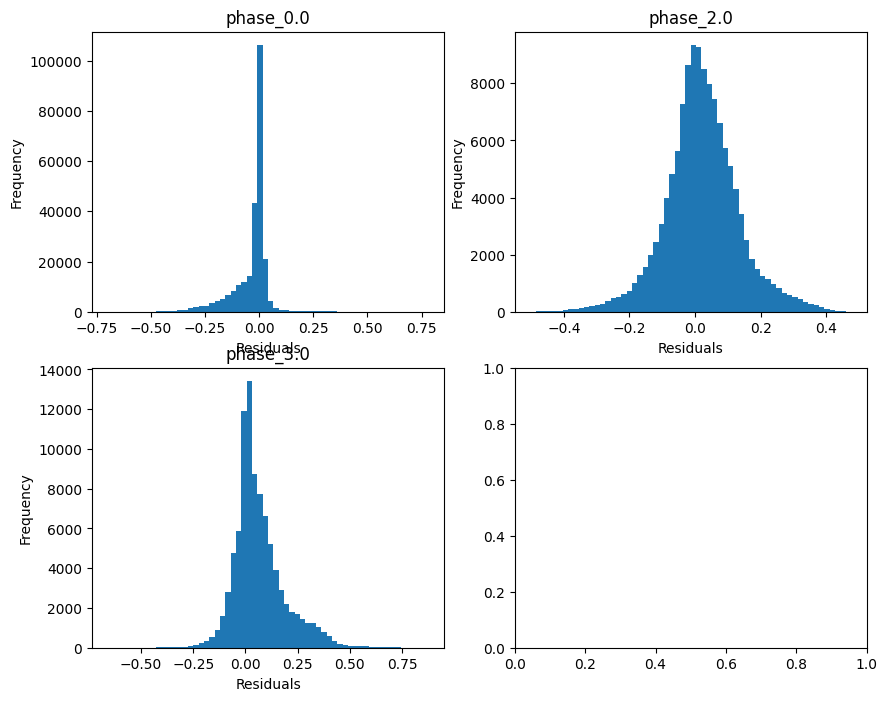

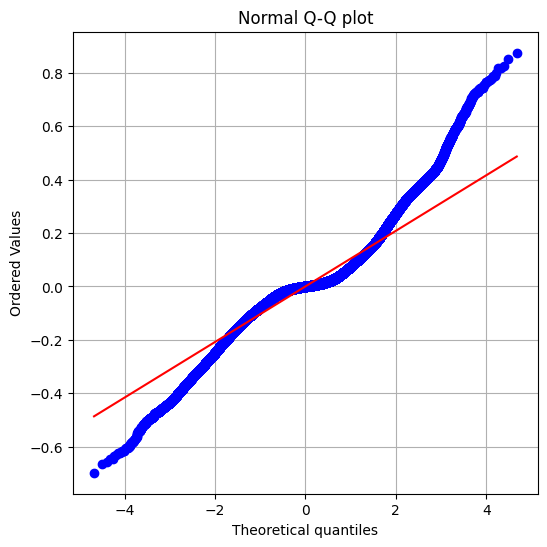

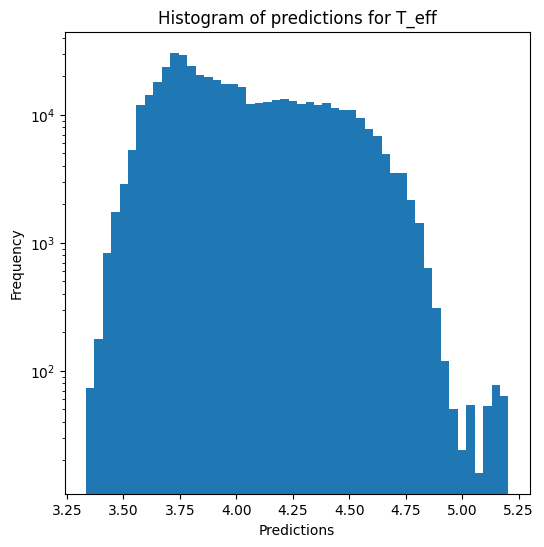

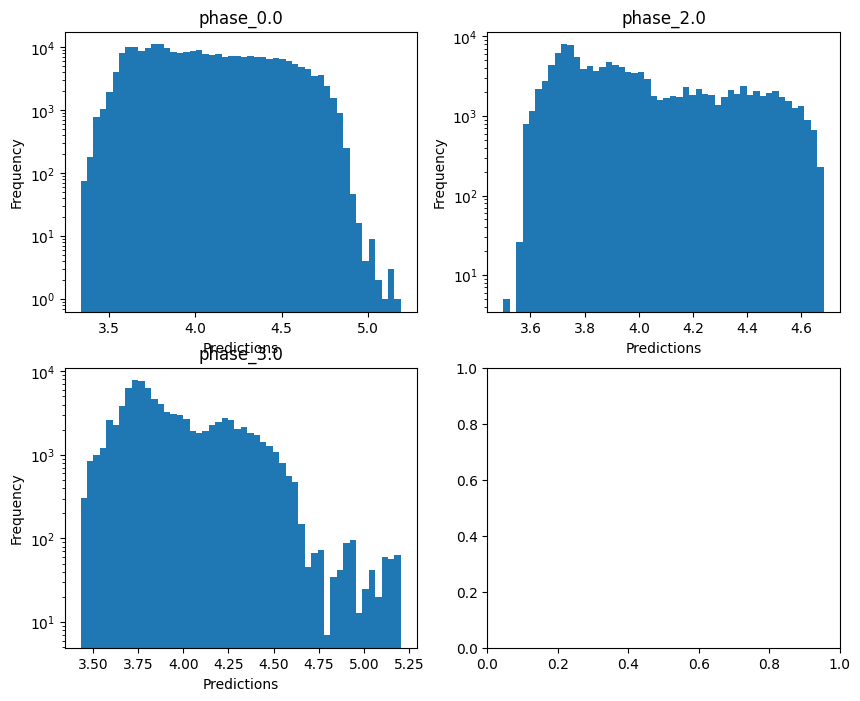


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44691654666339886
  RMSE :  0.5082593743148593
  MAE :  0.2835072011554159
  MedAE :  0.08326073488527763
  CORR :  0.8354414595009478
  MAX_ER :  4.903121191917052
  Percentiles : 
    75th percentile :  0.37452884853721724
    90th percentile :  0.8845259821816233
    95th percentile :  1.1892781113993436
    99th percentile :  1.719533643417754

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.41669574350629013
  RMSE :  0.7019460318743453
  MAE :  0.5275843068063185
  MedAE :  0.39569485005278215
  CORR :  0.6457549730283418
  MAX_ER :  3.6501886747144097
  Percentiles : 
    75th percentile :  0.7704040659209763
    90th percentile :  1.1761429802314547
    95th percentile :  1.4496849915543497
    99th percentile :  2.0243735049469014

log_g results for the phase category with a va

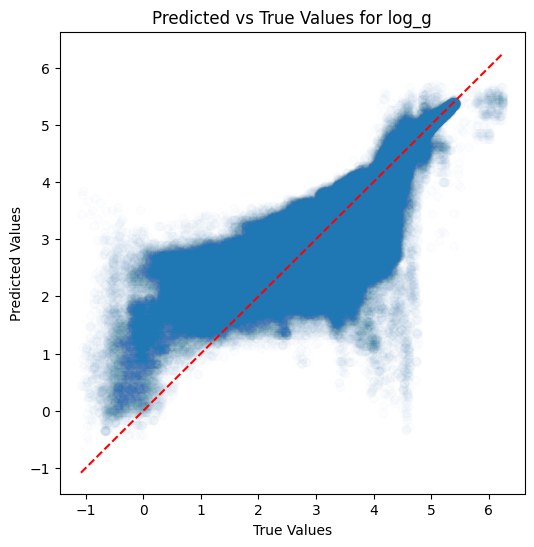

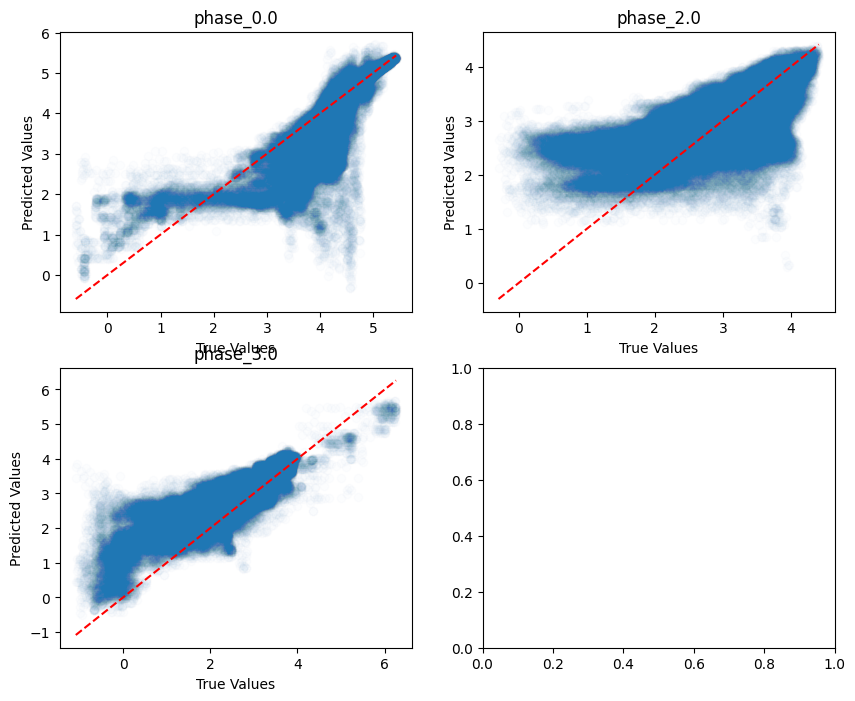

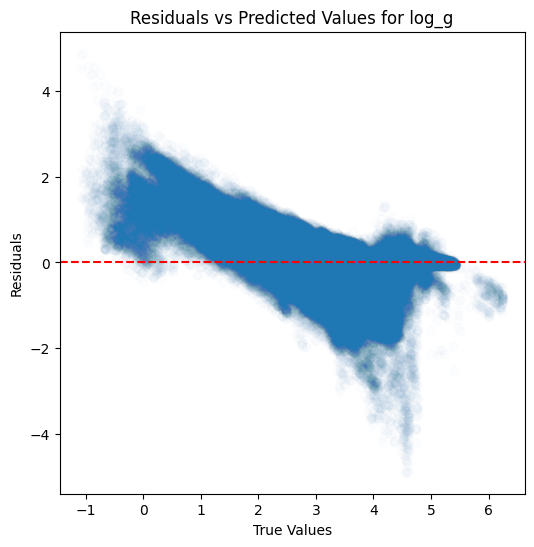

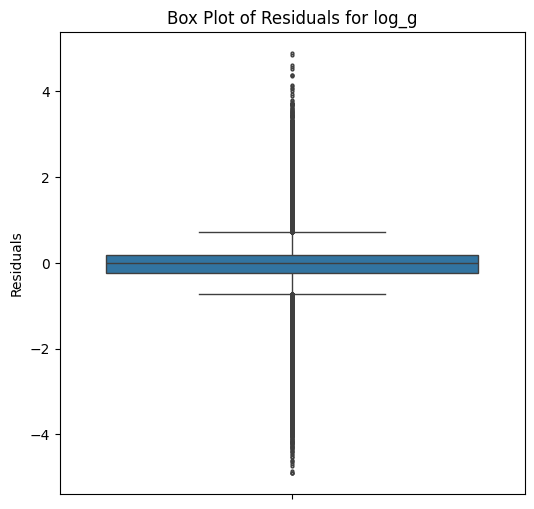

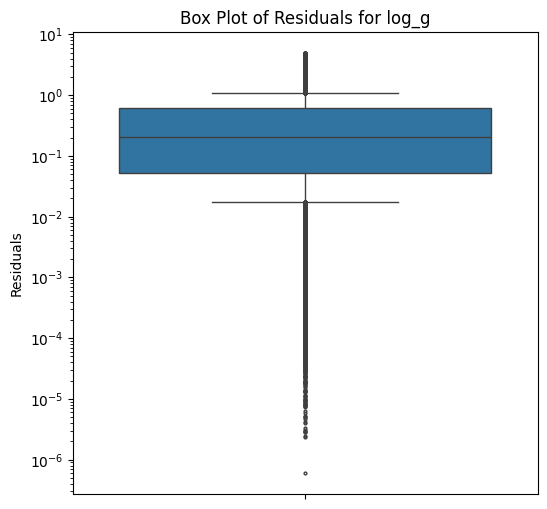

...

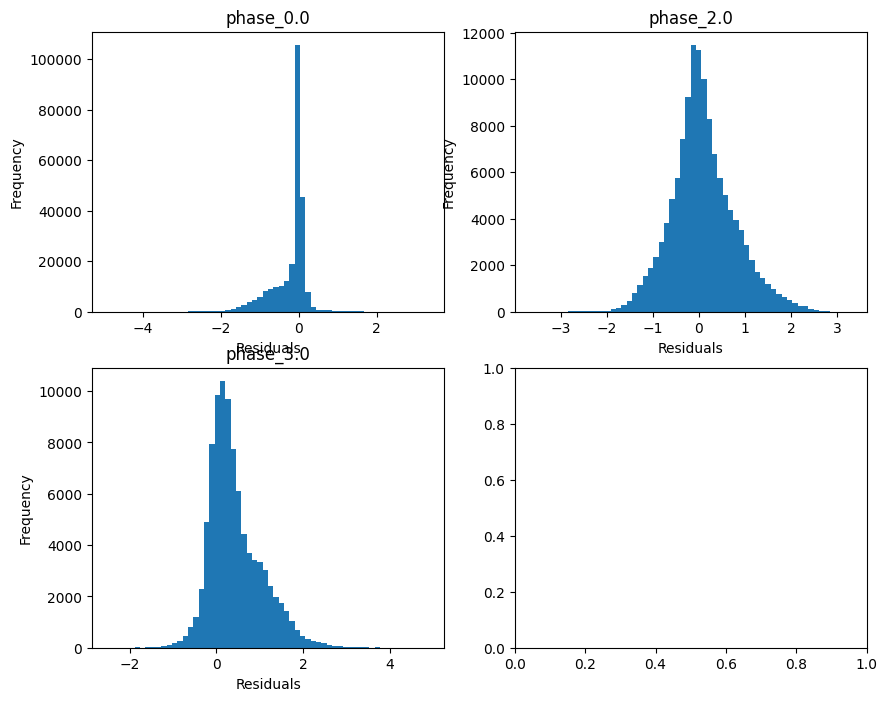

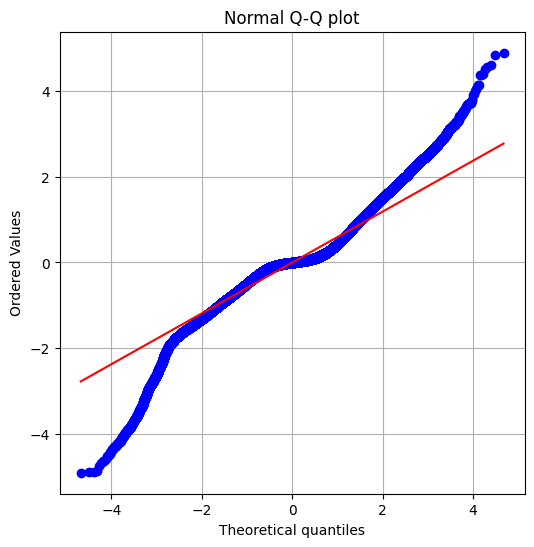

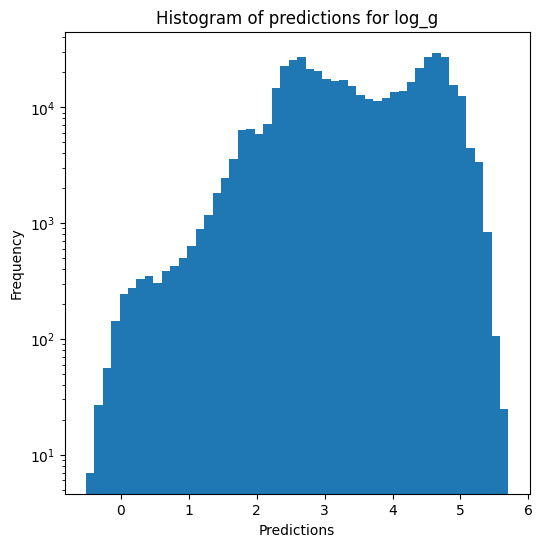

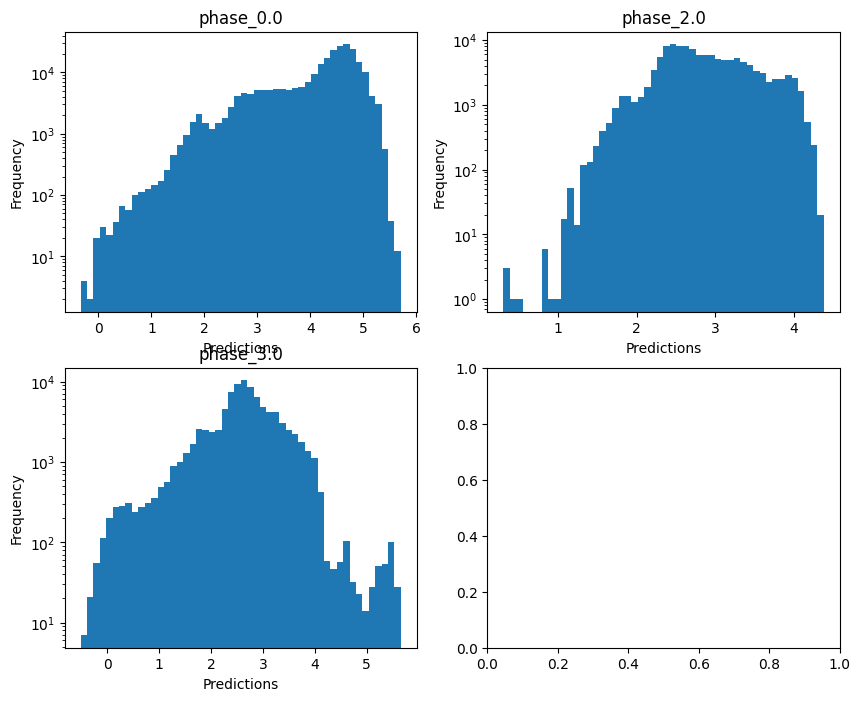

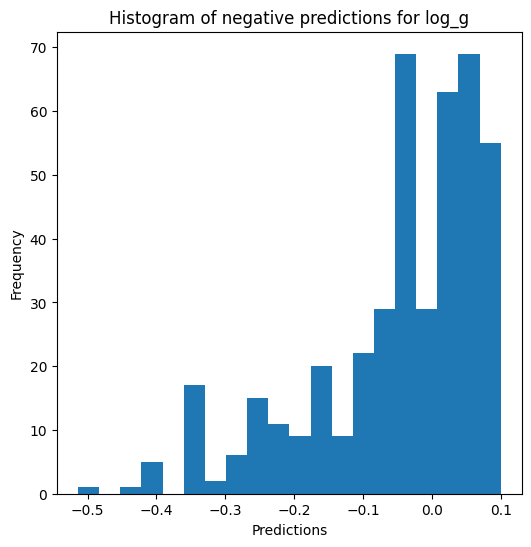


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8326137247348038
  RMSE :  0.25471861197389906
  MAE :  0.1414410772627924
  MedAE :  0.03912252499455934
  CORR :  0.9319318508795805
  MAX_ER :  2.539424695289145
  Percentiles : 
    75th percentile :  0.18628538377101247
    90th percentile :  0.4451228264590615
    95th percentile :  0.5979050099586749
    99th percentile :  0.8591561694482943

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4973824682051966
  RMSE :  0.35122580256497776
  MAE :  0.2640692059260129
  MedAE :  0.1980965522730711
  CORR :  0.7064712725550806
  MAX_ER :  1.8242319557214528
  Percentiles : 
    75th percentile :  0.3854784710998154
    90th percentile :  0.5885386567755737
    95th percentile :  0.7237933630998779
    99th percentile :  1.0150092055043403

radius results for the phase category with a

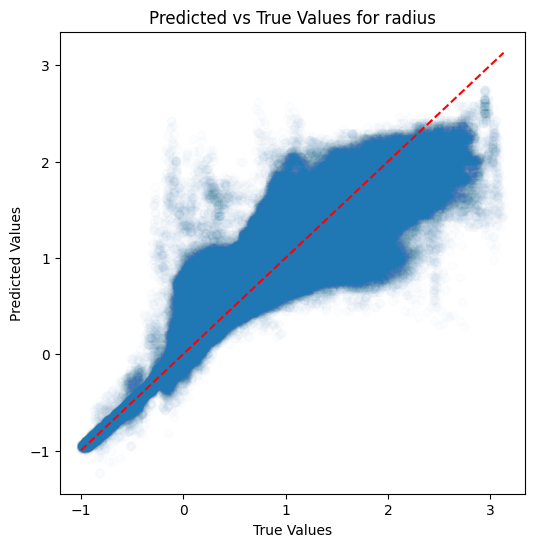

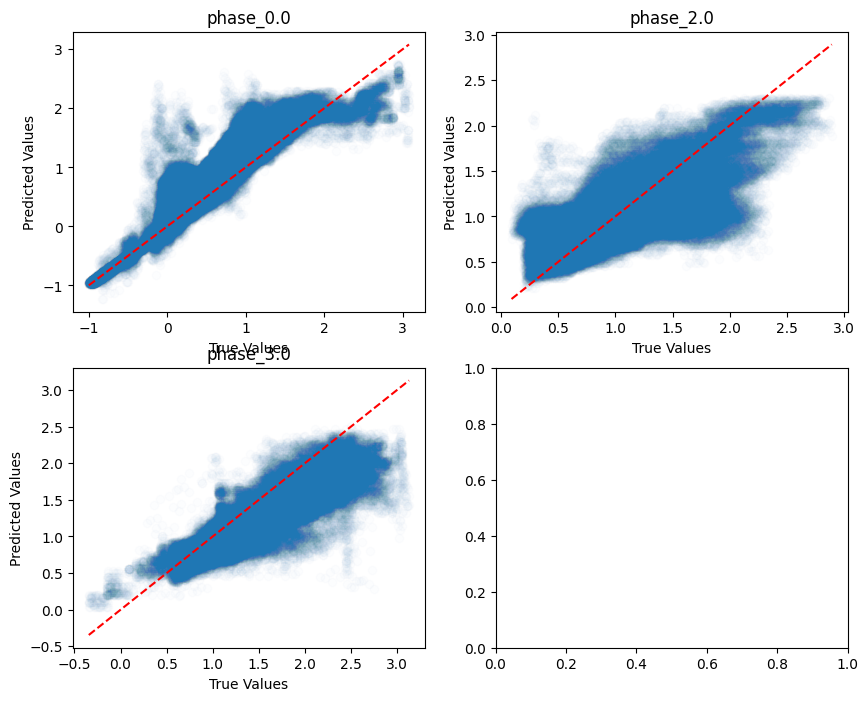

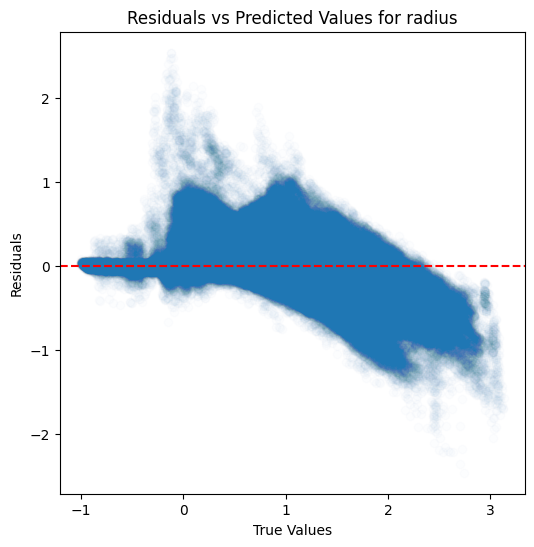

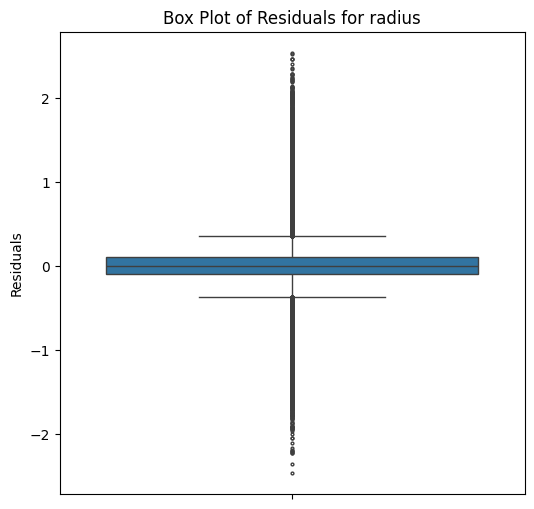

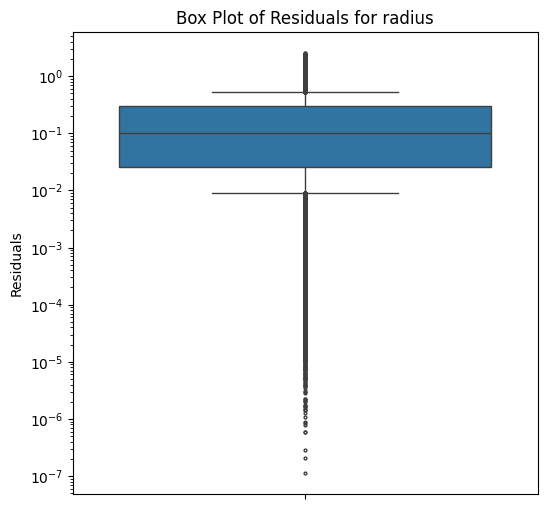

...

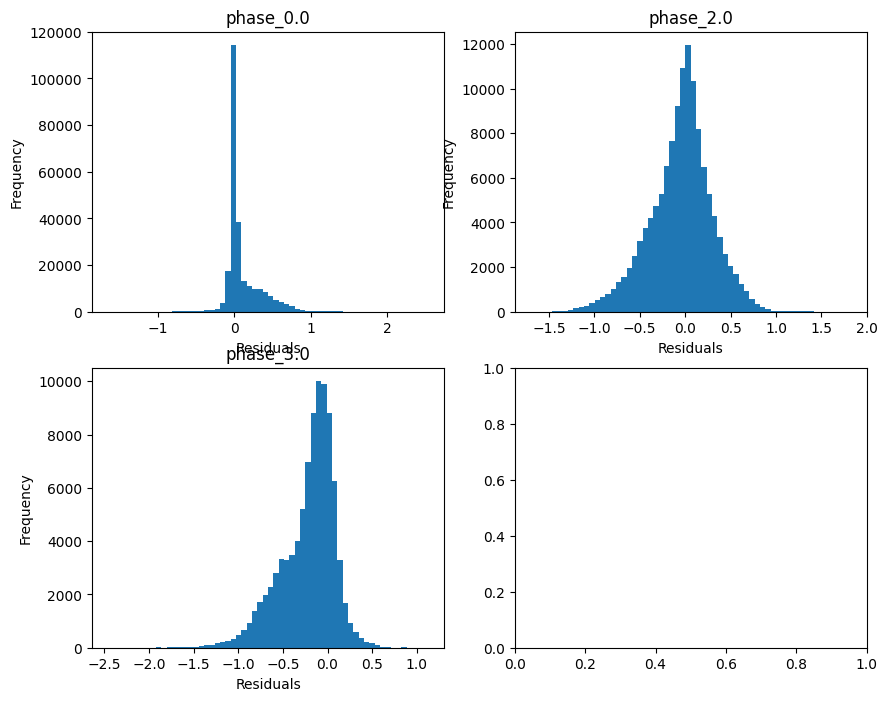

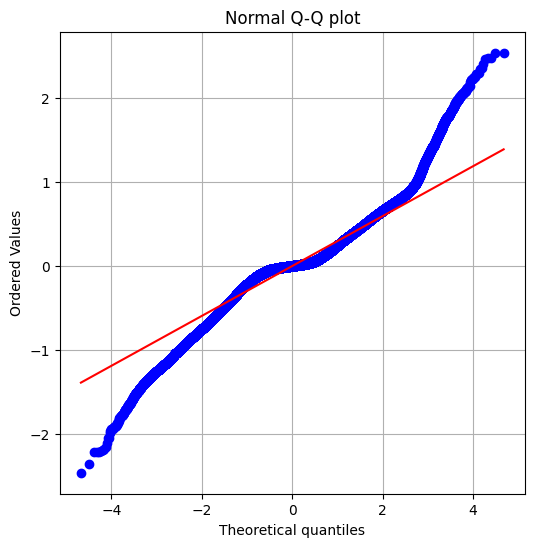

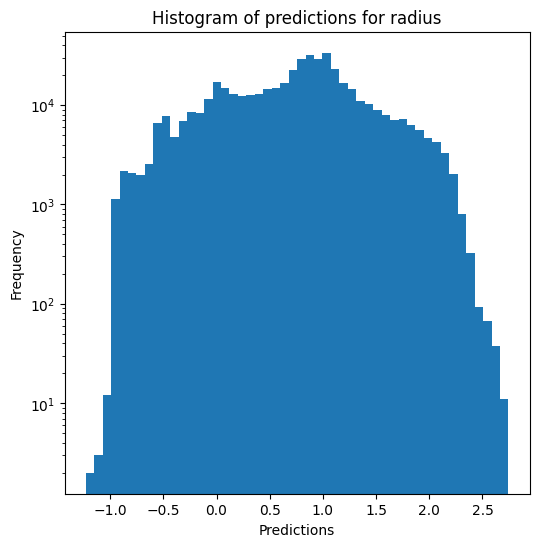

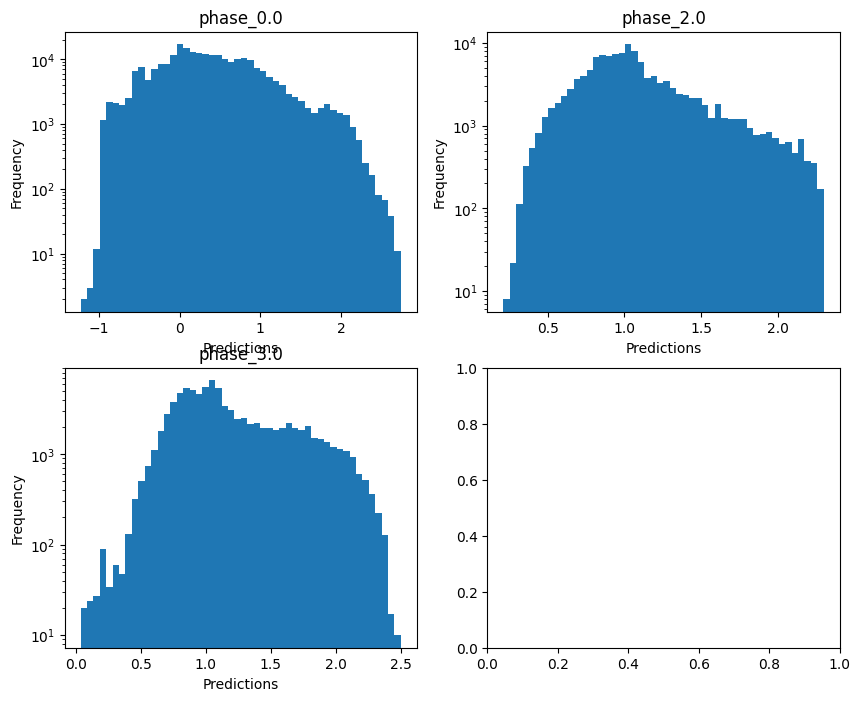

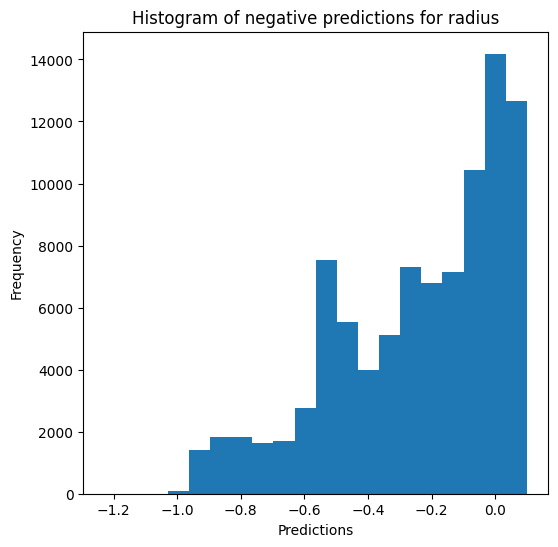

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09891444281055216
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09782913557591148
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.10185875334942583
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09626513760366445
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09835810139441668

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.891355030967779
  RMSE :  0.11619583010269595
  MAE :  0.07977674501115155
  MedAE :  0.050076126825636225
  CORR :  0.9475718500815937
  MAX_ER :  0.9155260947714075
  Percentiles : 
    75th percentile :  0.10680017528052765
    90th percentile :  0.19298241249999806
    95th percentile :  0.25916162344054966
    99th percentile :  0.3936687030483509

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8348754196827564
  RMSE :  0.13165270756726163
  MAE :  0.10078573200130803
  MedAE :  0.07917550366197679
  CORR :  0.9139276566221946
  MAX_ER :  0.6622618001238787
  Percentiles : 
    75th percentile :  0.1402550068598598
    90th percentile :  0.2183316575610313
    95th percentile :  0.27289877466828144
    99th percentile : 

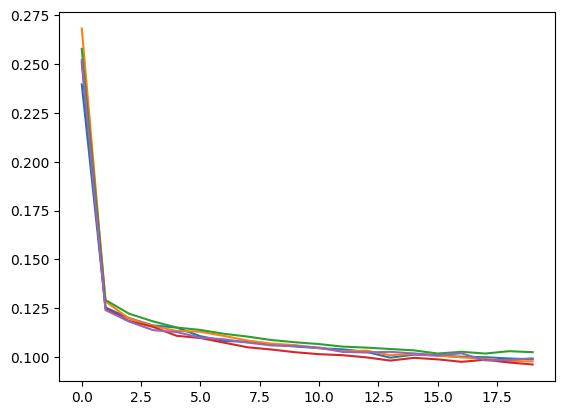

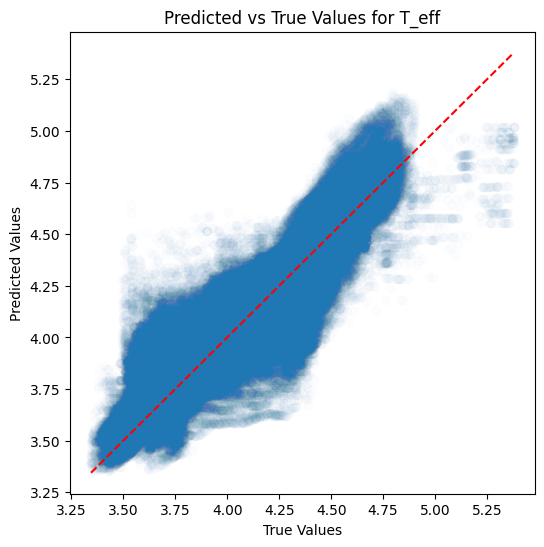

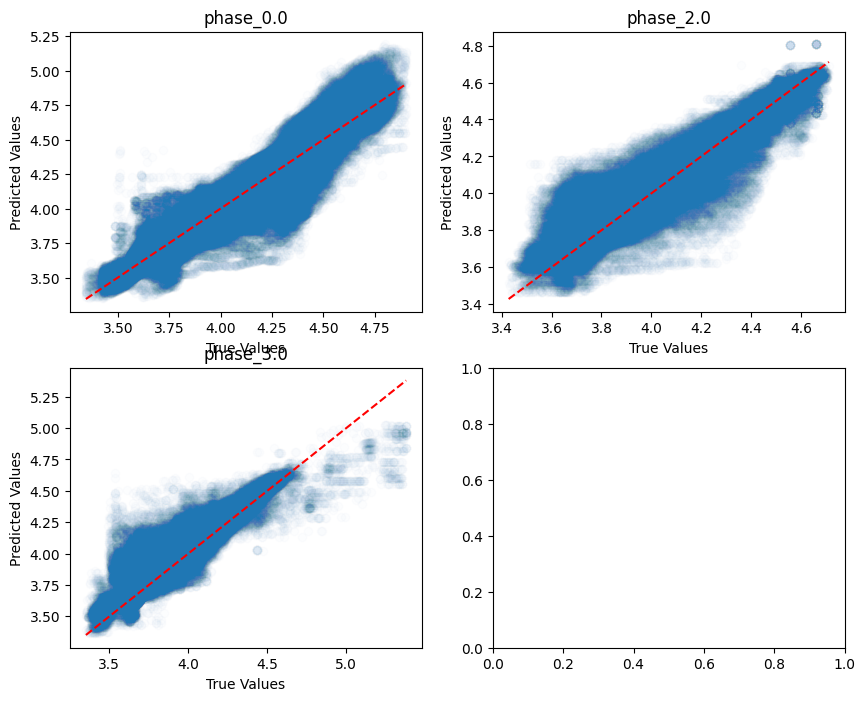

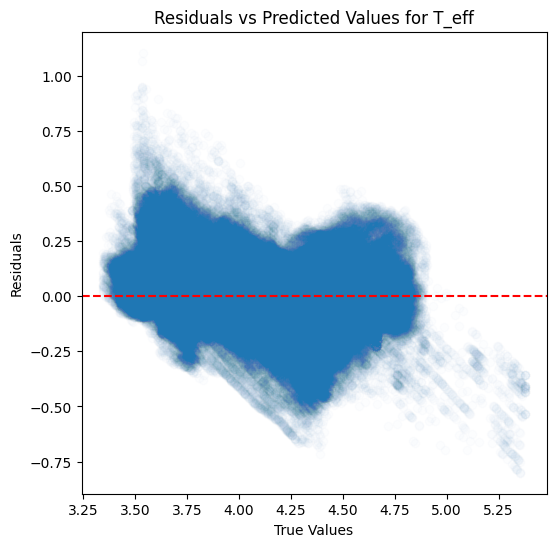

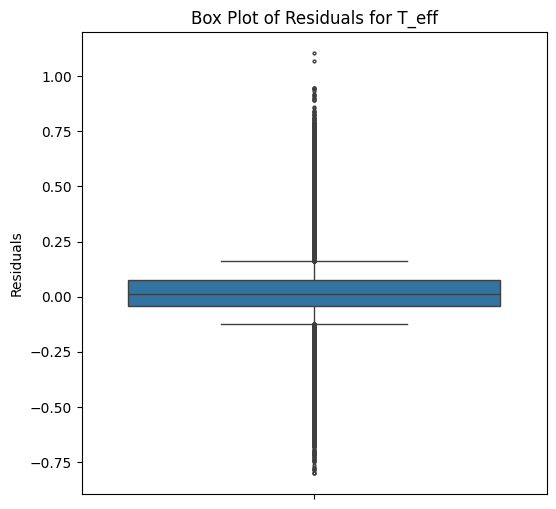

...

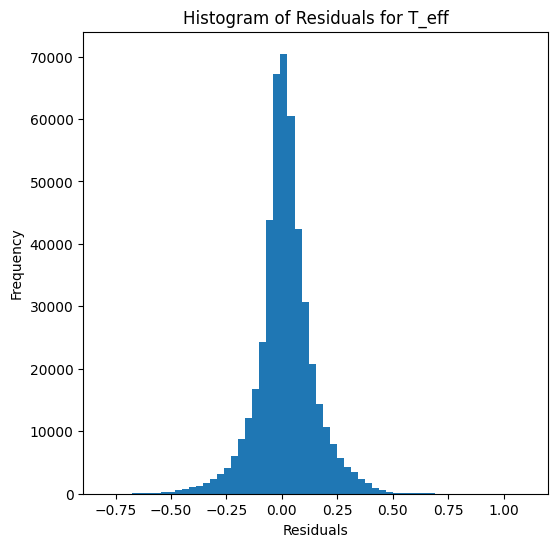

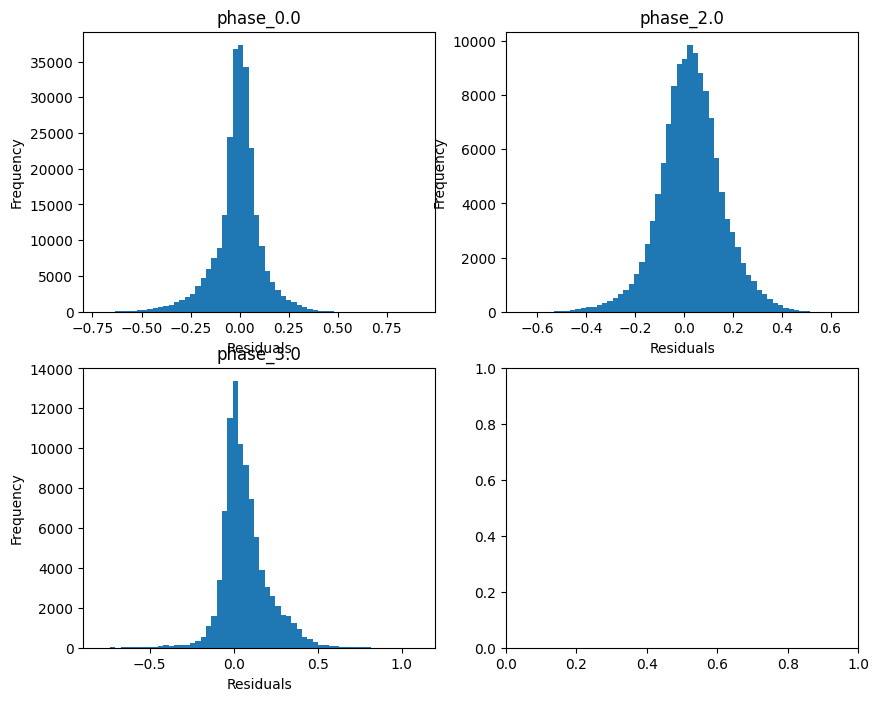

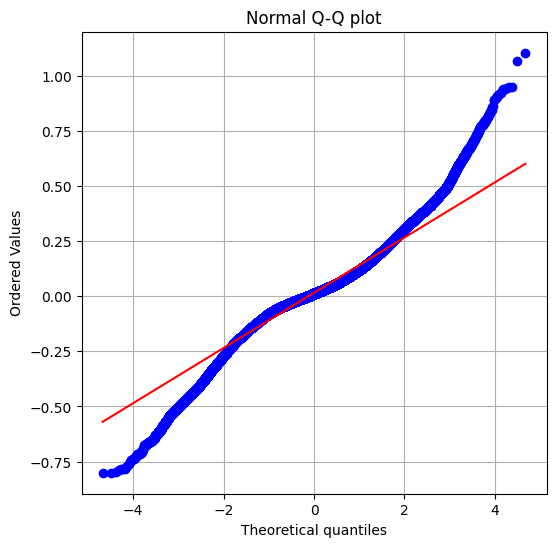

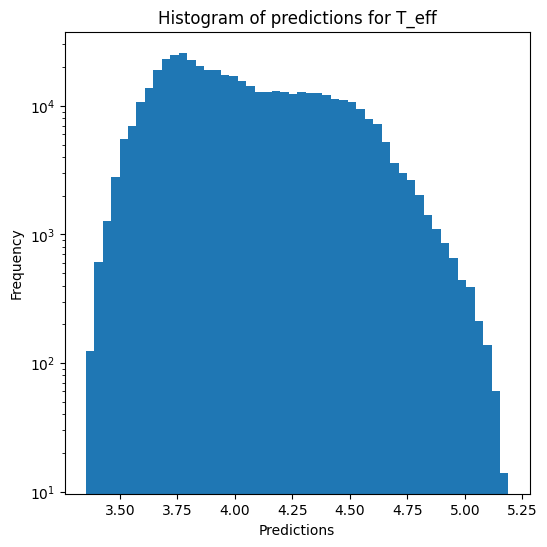

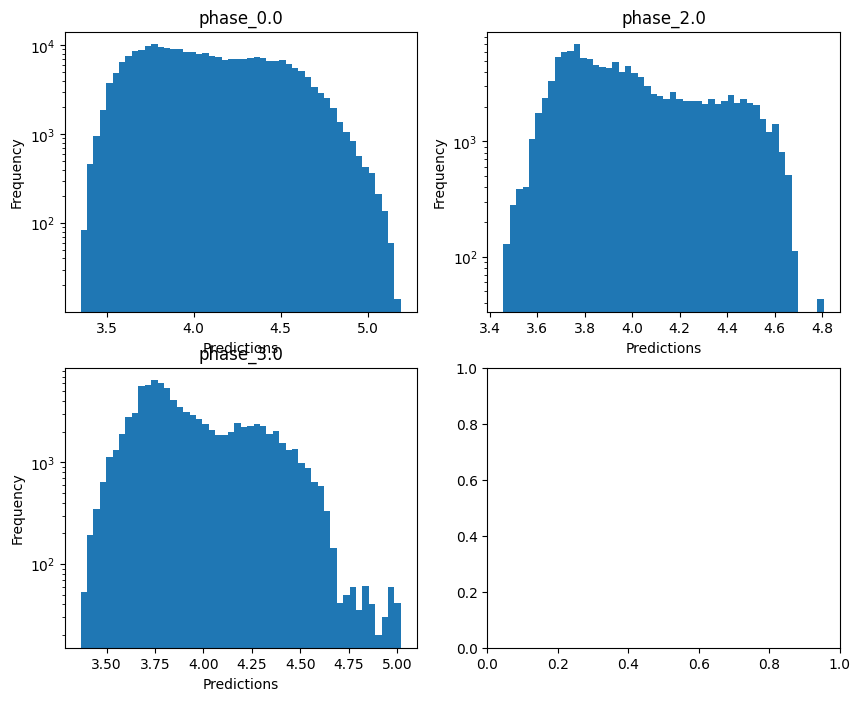

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.36370262337147663
  RMSE :  0.5445854829802154
  MAE :  0.29881578291550315
  MedAE :  0.10214066482859074
  CORR :  0.8037987558914559
  MAX_ER :  3.886740800288287
  Percentiles : 
    75th percentile :  0.29770722363831703
    90th percentile :  0.9788414254338684
    95th percentile :  1.3167193036812368
    99th percentile :  1.980513969437921

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.3086582358414772
  RMSE :  0.7739507856771052
  MAE :  0.58613570514414
  MedAE :  0.446594053619217
  CORR :  0.5674601751037733
  MAX_ER :  3.6018865401153364
  Percentiles : 
    75th percentile :  0.8467120007145372
    90th percentile :  1.3011531382450707
    95th percentile :  1.6191488994000158
    99th percentile :  2.186786309600974

log_g results for the phase cate

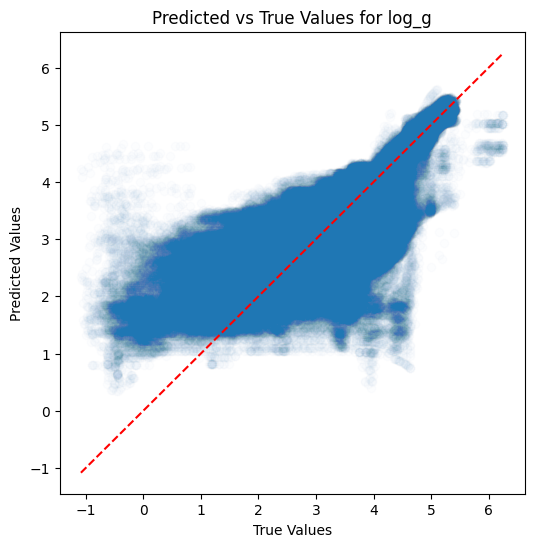

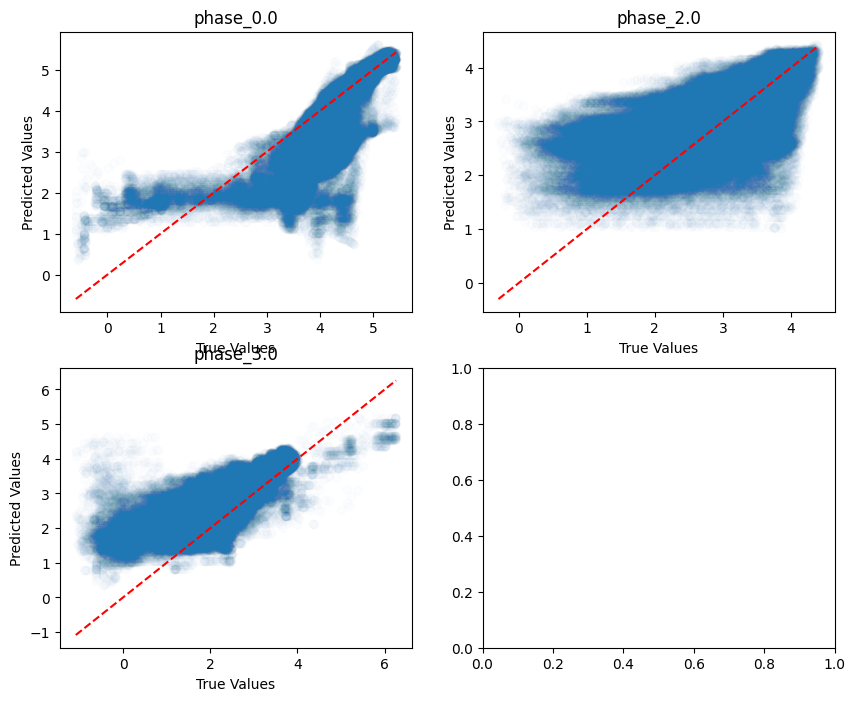

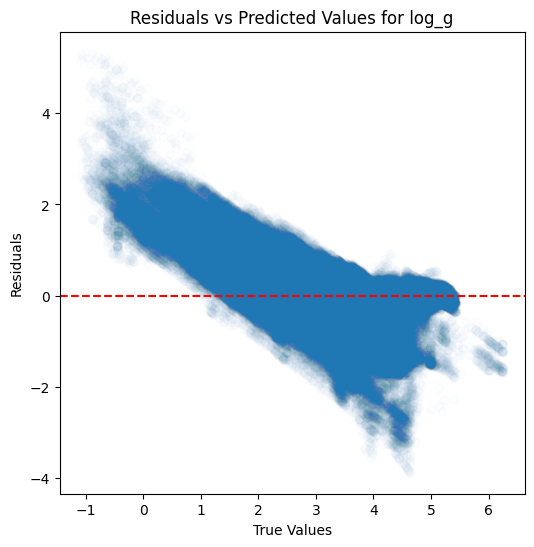

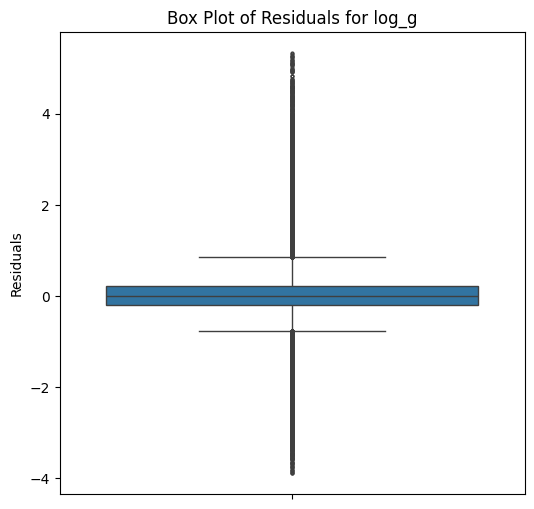

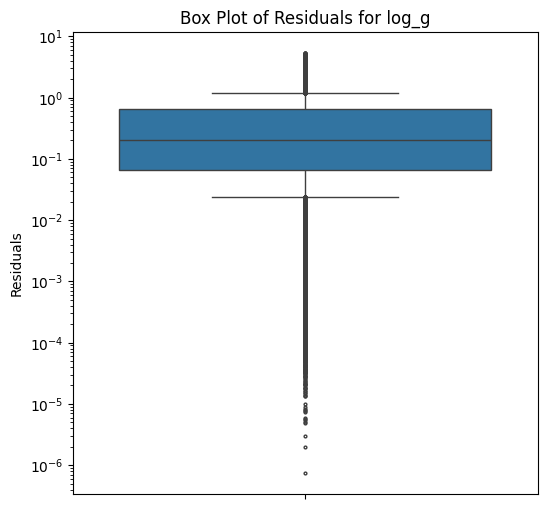

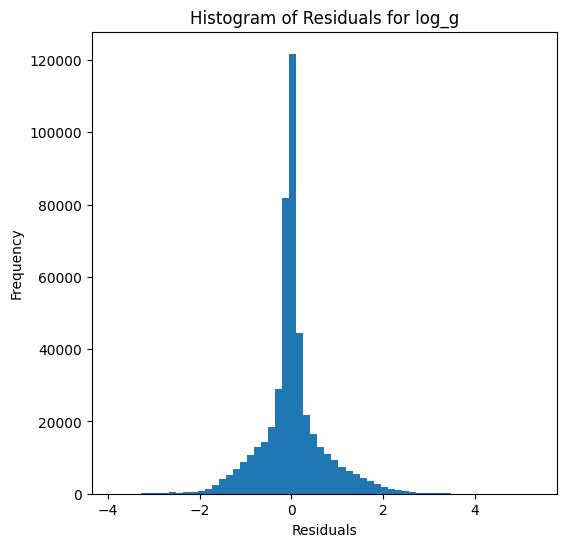

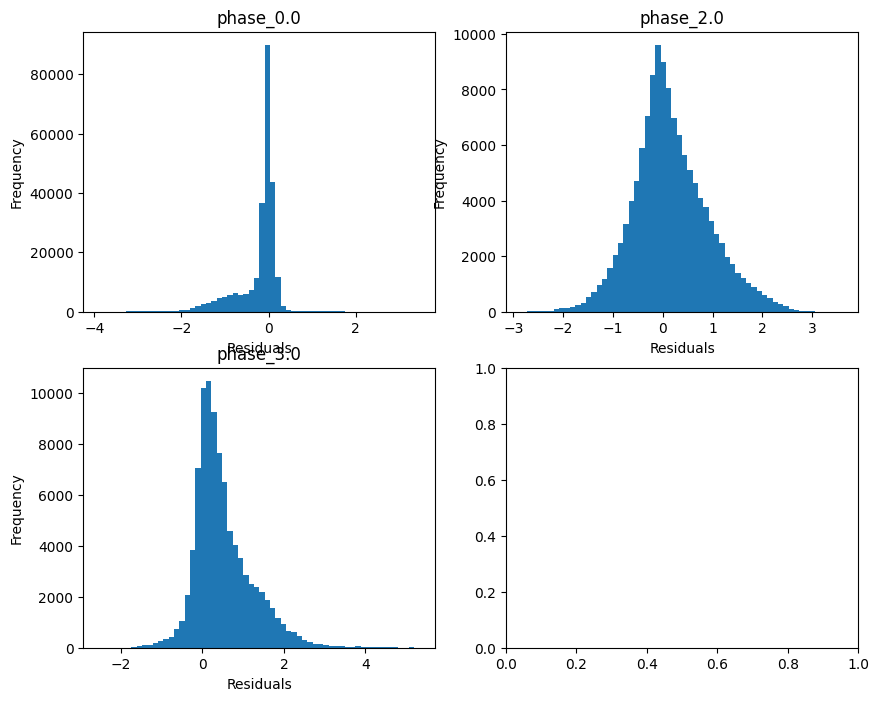

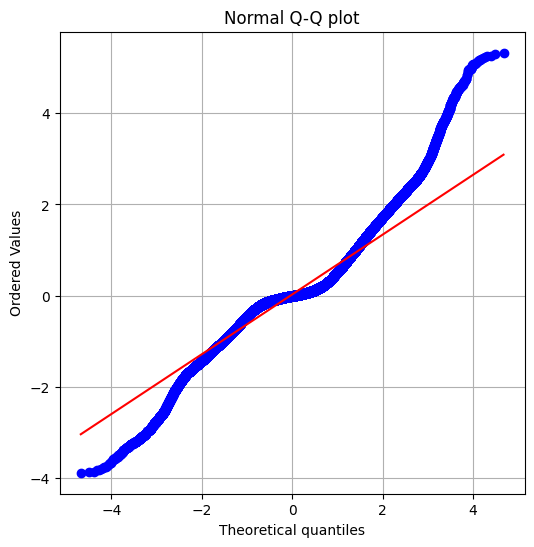

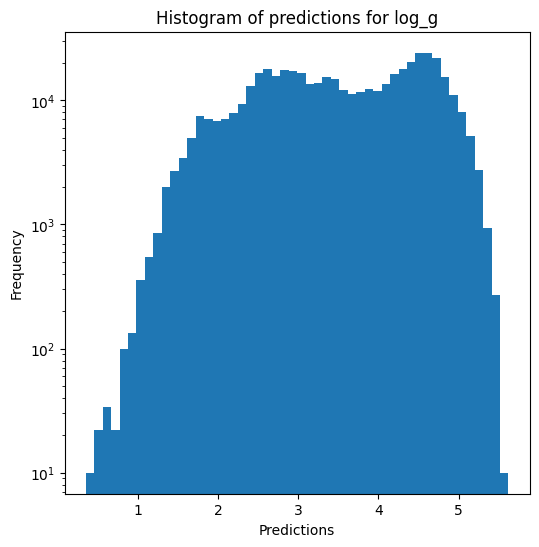

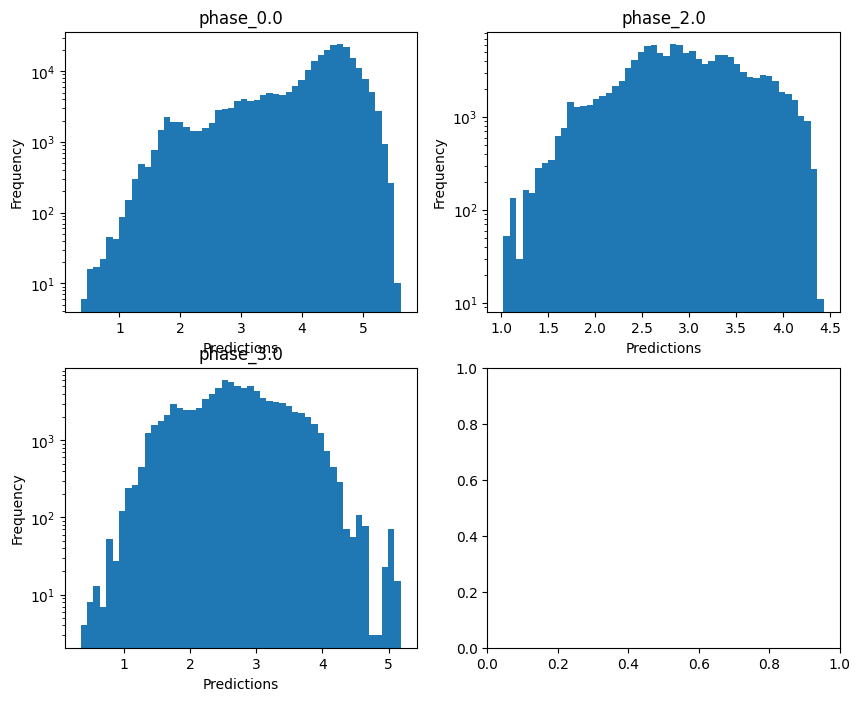


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8064145112135745
  RMSE :  0.2826051586666802
  MAE :  0.16328758847681796
  MedAE :  0.06823391423226499
  CORR :  0.9178434334352733
  MAX_ER :  2.071621374301463
  Percentiles : 
    75th percentile :  0.17489646727401334
    90th percentile :  0.5005290927113931
    95th percentile :  0.6755604834198702
    99th percentile :  1.0156598001047692

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.39852014409752545
  RMSE :  0.3872211232763295
  MAE :  0.2938096803266274
  MedAE :  0.2251044888289606
  CORR :  0.6637679151101497
  MAX_ER :  1.8577714699571115
  Percentiles : 
    75th percentile :  0.42305665611642773
    90th percentile :  0.6499157382199936
    95th percentile :  0.81106751796485
    99th percentile :  1.0924223600288214

radius results for the phase category with a 

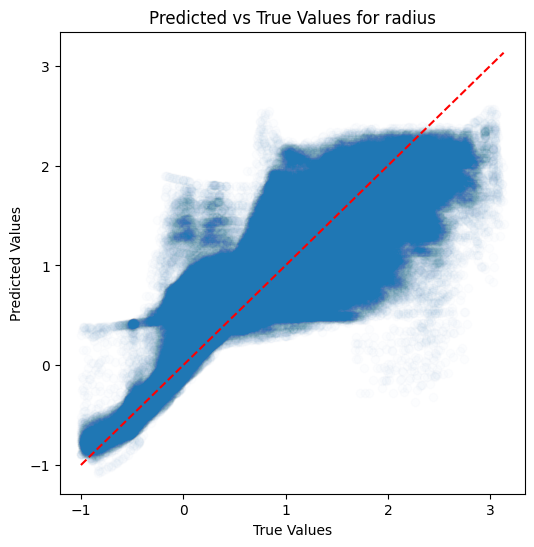

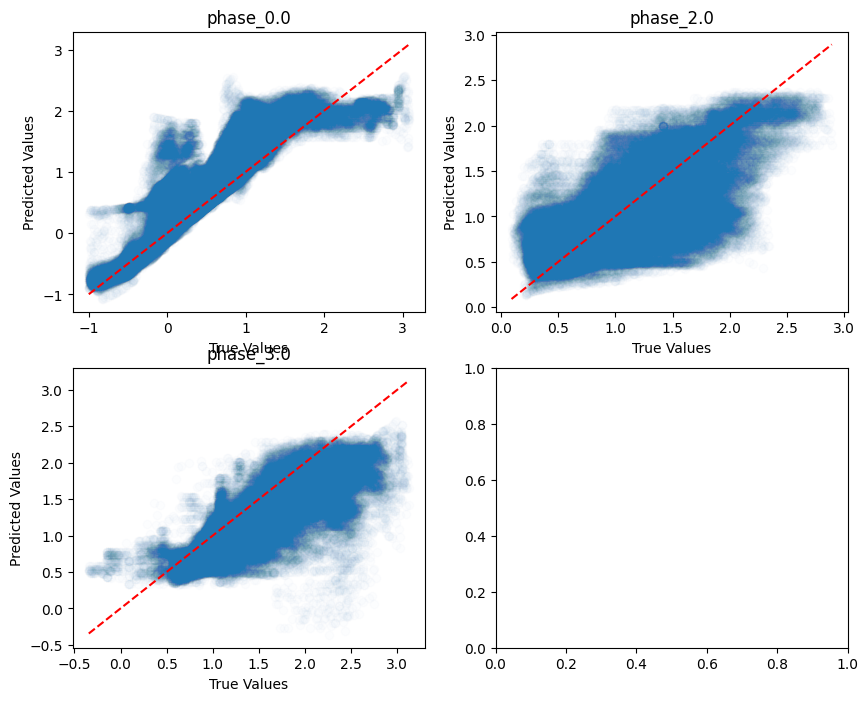

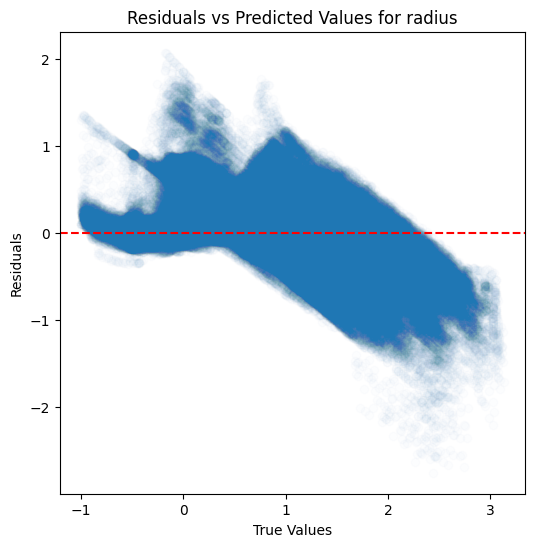

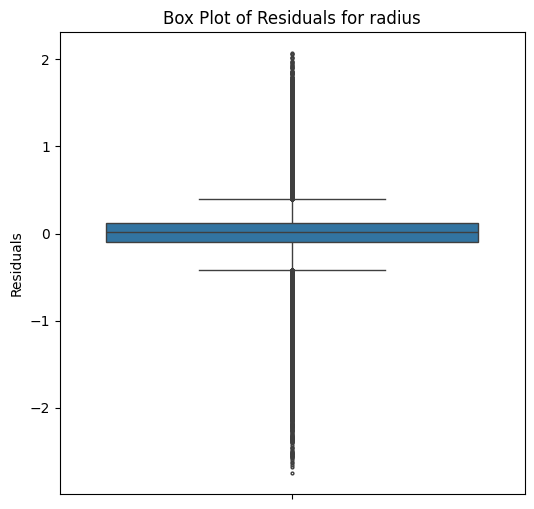

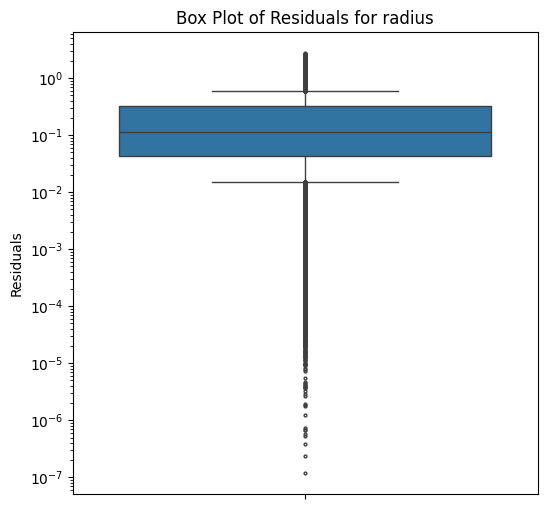

...

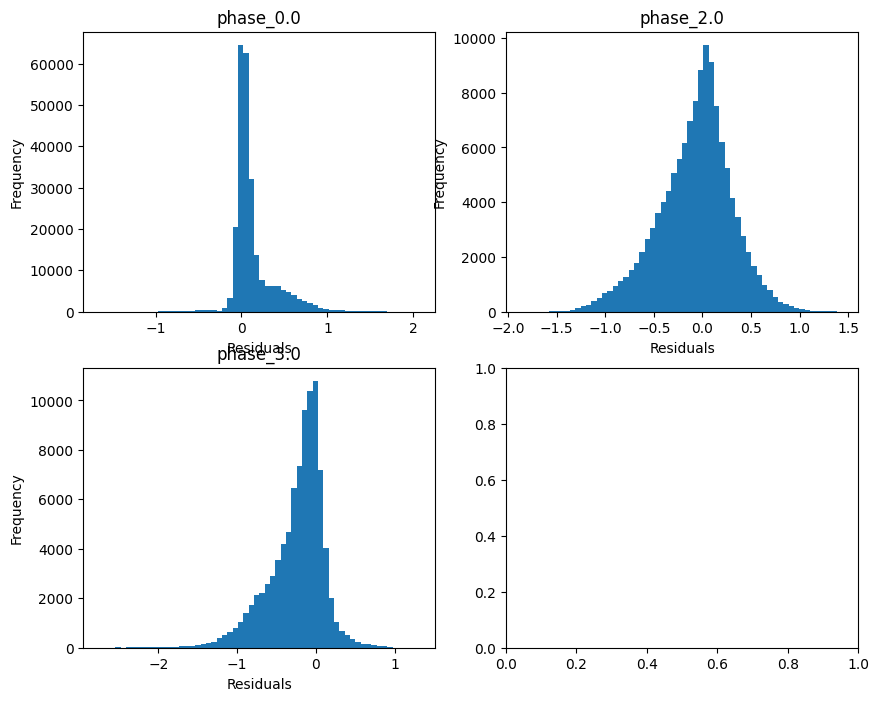

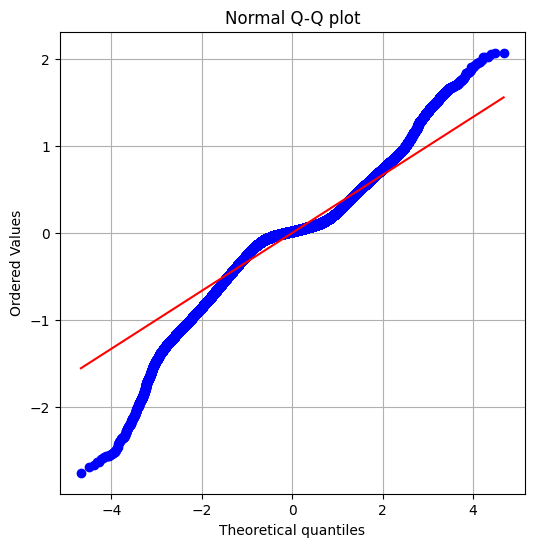

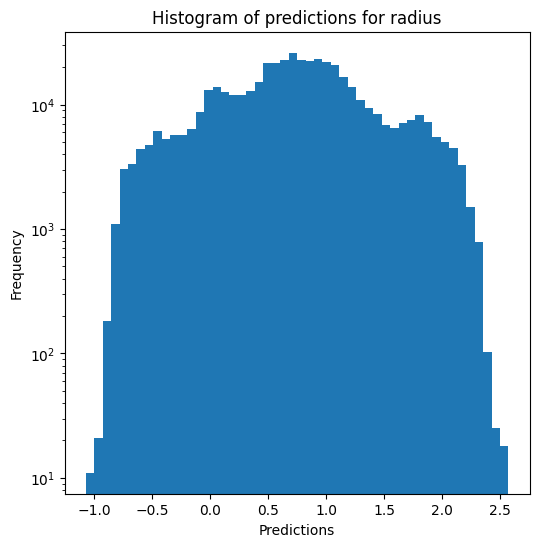

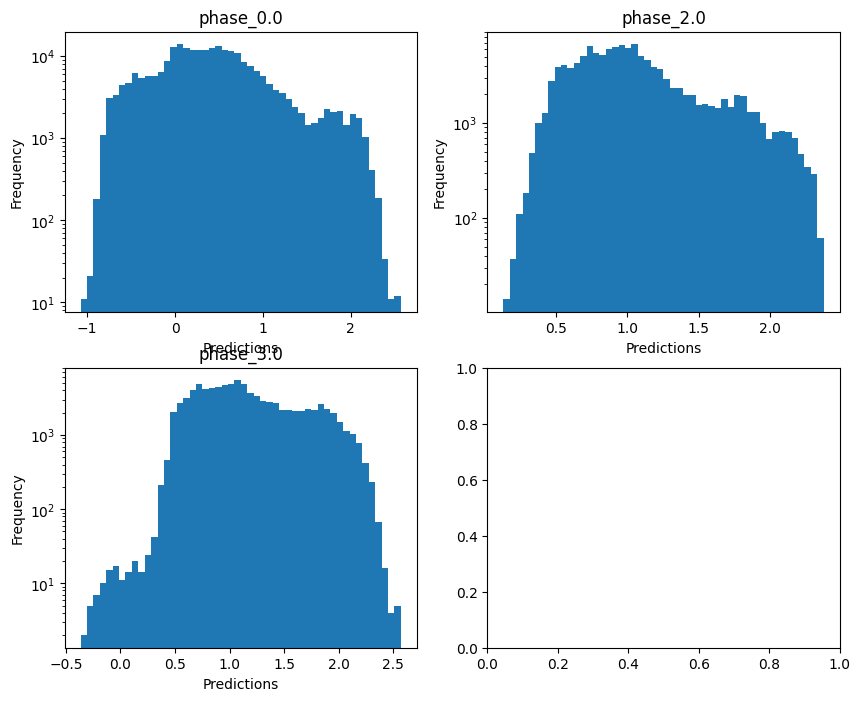

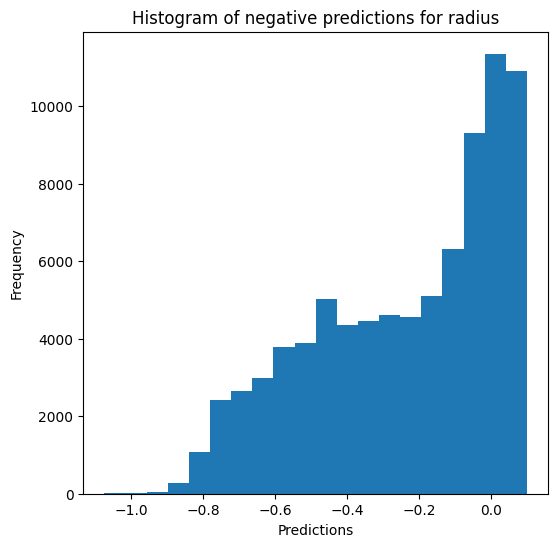

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon